<a href="https://colab.research.google.com/github/lucasinanaj/DataScienceLab/blob/main/Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
filepath = '/content/drive/MyDrive/Data Science Lab/'
import pandas as pd
import numpy as np

d = pd.read_csv(filepath+'ecommerce.csv', delimiter=';')
d['data'] = pd.to_datetime(d['data'], format='%d-%m-%Y')
Nord = pd.read_excel(filepath+'Nord_temperature.xlsx')
Nord['data'] = pd.to_datetime(Nord['data'], format='%d-%m-%Y')
df1 = pd.merge(d, Nord, on='data', how='left')

Center = pd.read_excel(filepath+'Center_temperature.xlsx')
Center['data'] = pd.to_datetime(Center['data'], format='%d-%m-%Y')
df2 = pd.merge(df1, Center, on='data', how='left')

Sud = pd.read_excel(filepath+'Sud_temperature.xlsx')
Sud['data'] = pd.to_datetime(Sud['data'], format='%d-%m-%Y')
df = pd.merge(df2, Sud, on='data', how='left')


df['totale'] = df['totale'].round(2) #Column "total" only selects the first 3 decimal places.
df

,data,totale,settore,Temperature_Nord,Temperature_Center,Temperature_Sud
0,2013-01-01,613.97,Calcio,NaN,NaN,NaN
1,2014-02-04,205.26,Pesca,NaN,NaN,NaN
2,2014-07-07,412.17,Fitness,NaN,NaN,NaN
3,2014-08-22,656.67,Fitness,NaN,NaN,NaN
4,2014-09-26,1065.54,Fitness,NaN,NaN,NaN
...,...,...,...,...,...,...
26610,NaT,41.30,Soft air,NaN,NaN,NaN
26611,NaT,31335.96,Subacquea,NaN,NaN,NaN
26612,NaT,257316.51,Tennis,NaN,NaN,NaN
26613,NaT,736988.38,Trekking,NaN,NaN,NaN


In [ ]:
df["settore"].unique()

array(['Calcio', 'Pesca', 'Fitness', 'Pattini', 'Basket', 'Casual',
       'Running', 'Nuoto', 'Snowboard', 'Trekking', 'Arti marziali',
       'Mare', 'Tennis', 'Bambino', 'Sci', 'Volley', 'Ciclismo',
       'Subacquea', 'Ping-pong', 'Skateboard', 'Baseball', 'Arceria',
       'Rugby', 'Freccette', 'Golf', 'Danza', 'Buoni / acconti',
       'Soft air', 'Intimo', 'Padel'], dtype=object)

In [ ]:
# Translation of columns
df = df.rename(columns={'data': 'Date', 'totale': 'Total', 'settore': 'Sector'})

# Translation of sector names
translation = {
    'Calcio': 'Football',
    'Pesca': 'Fishing',
    'Fitness': 'Fitness',
    'Pattini': 'Skating',
    'Basket': 'Basketball',
    'Casual': 'Casual',
    'Running': 'Running',
    'Nuoto': 'Swimming',
    'Snowboard': 'Snowboarding',
    'Trekking': 'Trekking',
    'Arti marziali': 'Martial arts',
    'Mare': 'Sea',
    'Tennis': 'Tennis',
    'Bambino': 'Kids',
    'Sci': 'Skiing',
    'Volley': 'Volleyball',
    'Ciclismo': 'Cycling',
    'Subacquea': 'Scuba diving',
    'Ping-pong': 'Table tennis',
    'Skateboard': 'Skateboarding',
    'Baseball': 'Baseball',
    'Arceria': 'Archery',
    'Rugby': 'Rugby',
    'Freccette': 'Darts',
    'Golf': 'Golf',
    'Danza': 'Dance',
    'Buoni / acconti': 'Vouchers / Deposits',
    'Soft air': 'Airsoft',
    'Intimo': 'Underwear',
    'Padel': 'Padel'
}

df['Sector'] = df['Sector'].map(translation)

In [ ]:
df

,Date,Total,Sector,Temperature_Nord,Temperature_Center,Temperature_Sud
0,2013-01-01,613.97,Football,NaN,NaN,NaN
1,2014-02-04,205.26,Fishing,NaN,NaN,NaN
2,2014-07-07,412.17,Fitness,NaN,NaN,NaN
3,2014-08-22,656.67,Fitness,NaN,NaN,NaN
4,2014-09-26,1065.54,Fitness,NaN,NaN,NaN
...,...,...,...,...,...,...
26610,NaT,41.30,Airsoft,NaN,NaN,NaN
26611,NaT,31335.96,Scuba diving,NaN,NaN,NaN
26612,NaT,257316.51,Tennis,NaN,NaN,NaN
26613,NaT,736988.38,Trekking,NaN,NaN,NaN


## DATA QUALITY

### Check Missing

In [ ]:
missing_values = df.isna().sum()
print(missing_values)

Date                  30
Total                  0
Sector                 0
Temperature_Nord      46
Temperature_Center    39
Temperature_Sud       85
dtype: int64


In [ ]:
df=df.dropna()

### Check for negative or null prices

In [ ]:
df[df["Total"]<= 0]

,Date,Total,Sector,Temperature_Nord,Temperature_Center,Temperature_Sud
7050,2017-04-30,0.0,Running,14.0,14.0,16.0
7149,2017-05-12,0.0,Running,17.0,21.0,20.0
7187,2017-05-16,0.0,Running,21.0,21.0,20.0
7347,2017-06-02,0.0,Running,25.0,22.0,22.0
9008,2017-11-22,0.0,Running,9.0,13.0,15.0
9109,2017-12-02,0.0,Running,5.0,9.0,11.0
9198,2017-12-10,0.0,Running,0.0,5.0,12.0
9317,2017-12-20,0.0,Running,0.0,3.0,10.0
9343,2017-12-23,0.0,Running,3.0,9.0,14.0
9367,2017-12-26,0.0,Running,5.0,10.0,14.0


In [ ]:
Rows_negative_prices = df[df['Total'] == 0]
print(len(Rows_negative_prices))

25


In [ ]:
df = df[df['Total'] != 0]

In [ ]:
last_year=df[(df["Date"] > '2022-5-11')]

### ESPLORATORY ANALYSIS

Identify which sector and which brand generate the highest profits in the dataset and use this information to make future predictions

Let's take the sectors with more than 100 observations in the last year and calculate their cumulative sum.

In [ ]:
describe=last_year.groupby('Sector').describe()

In [ ]:
sectors_with_count_greater_than_100 = describe[describe['Total']['count'] > 100]

In [ ]:
sectors_with_count_greater_than_100

Total                                                       \
              count         mean          std    min        25%      50%   
Sector                                                                     
Casual        331.0  1454.890181  1371.479886  37.17   501.1750  1073.80   
Cycling       127.0   109.650472    98.927346  20.65    46.2600    51.21   
Fishing       367.0  2606.320654  1385.070947  20.24  1609.3350  2306.52   
Fitness       327.0   492.134648   526.241349  11.98   197.2100   350.64   
Football      363.0  3084.135096  2203.121329  24.37  1502.0800  2681.82   
Kids          118.0   304.101441   257.811035  24.78   138.3550   206.09   
Padel         293.0  2404.942048  2450.603026  15.49   652.5400  1673.06   
Running       213.0  1035.171408   974.021013  28.50   495.6000   743.40   
Skiing        189.0  2258.472063  2455.825604  36.76   615.3700  1569.40   
Snowboarding  129.0  1006.501473  1178.571054  61.95   288.6900   569.94   
Tennis        226.0   949.934469  1623.244612  20.65   111.6125   412.59   
Trekking      246.0   990.176870   880.325713  14.87   392.1400   776.03   

                                  Temperature_Nord             ...  \
                    75%       max            count       mean  ...   
Sector                                                         ...   
Casual        1974.7600  10510.85            331.0  15.812689  ...   
Cycling        164.7900    489.82            127.0  16.661417  ...   
Fishing       3510.3750   8042.23            367.0  15.926431  ...   
Fitness        619.0900   5663.47            327.0  16.140673  ...   
Football      4282.0500  15380.12            363.0  15.859504  ...   
Kids           371.2900   1404.61            118.0  14.245763  ...   
Padel         3332.9100  19406.46            293.0  16.030717  ...   
Running       1362.9000   5946.37            213.0  13.807512  ...   
Skiing        3279.2200  20393.53            189.0  11.322751  ...   
Snowboarding  1375.2900   8458.24            129.0  12.883721  ...   
Tennis        1073.7475  11088.64            226.0  15.150442  ...   
Trekking      1234.0450   5257.08            246.0  15.479675  ...   

             Temperature_Center       Temperature_Sud                       \
                            75%   max           count       mean       std   
Sector                                                                       
Casual                    25.00  30.0           331.0  19.688822  5.908122   
Cycling                   25.00  31.0           127.0  19.937008  5.958518   
Fishing                   25.00  31.0           367.0  19.852861  5.951547   
Fitness                   25.00  31.0           327.0  20.042813  5.912294   
Football                  25.00  31.0           363.0  19.842975  5.944506   
Kids                      22.75  31.0           118.0  19.271186  5.741826   
Padel                     25.00  31.0           293.0  20.020478  5.892262   
Running                   20.00  30.0           213.0  18.225352  5.517204   
Skiing                    17.00  30.0           189.0  17.201058  5.199407   
Snowboarding              23.00  30.0           129.0  18.441860  6.326911   
Tennis                    24.00  31.0           226.0  19.946903  5.698874   
Trekking                  25.00  31.0           246.0  19.796748  6.317400   

                                            
               min   25%   50%   75%   max  
Sector                                      
Casual         9.0  15.0  19.0  25.0  35.0  
Cycling        9.0  15.0  19.0  26.0  32.0  
Fishing        9.0  15.0  19.0  25.5  35.0  
Fitness        9.0  15.0  20.0  26.0  35.0  
Football       9.0  15.0  19.0  25.5  35.0  
Kids          10.0  14.0  18.5  24.0  32.0  
Padel          9.0  15.0  20.0  26.0  32.0  
Running        9.0  14.0  18.0  22.0  29.0  
Skiing         9.0  14.0  16.0  20.0  30.0  
Snowboarding   9.0  13.0  17.0  24.0  30.0  
Tennis         9.0  15.0  20.0  25.0  32.0  
Trekking       9.0  1

In [ ]:
# Select only the rows with sectors present in sectors_with_count_greater_than_100
filtered_df = last_year[last_year['Sector'].isin(sectors_with_count_greater_than_100.index.get_level_values(0))]

Scegliamo i 5 settori con un guadagno maggiore nell'ultimo anno

<ipython-input-16-ca1deb591589>:14: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(sum_by_sector.index, rotation=45)  # Ruota le etichette sull'asse x per una migliore leggibilità


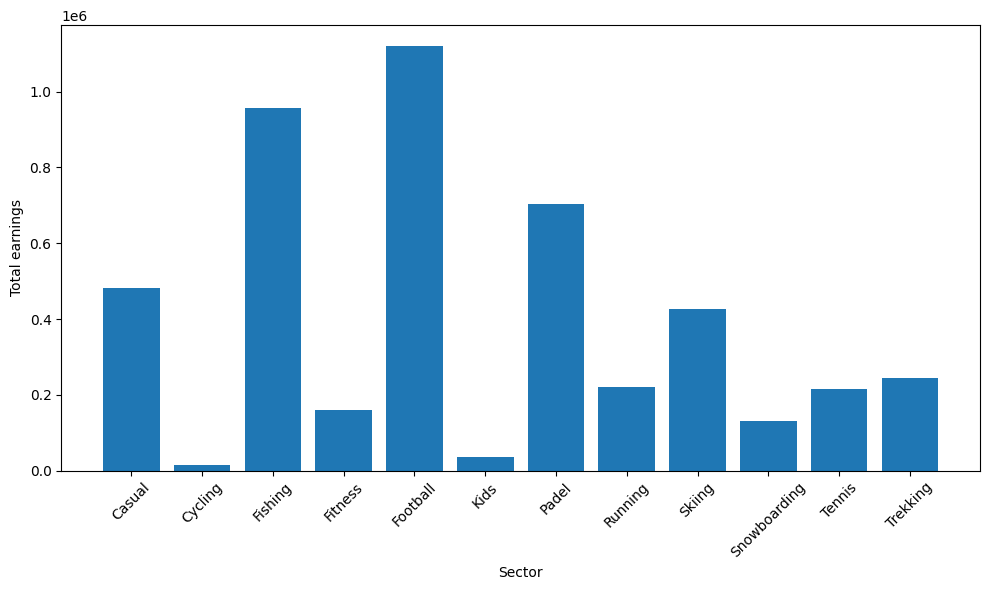

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Calcolo la somma dei valori totali per ogni settore
sum_by_sector = filtered_df.groupby('Sector')['Total'].sum()

# Creazione dell'istogramma
fig, ax = plt.subplots(figsize=(10, 6))  # Crea una figura con dimensioni personalizzate
ax.bar(sum_by_sector.index, sum_by_sector.values)

ax.set_xlabel('Sector')
ax.set_ylabel('Total earnings')

ax.set_xticklabels(sum_by_sector.index, rotation=45)  # Ruota le etichette sull'asse x per una migliore leggibilità

plt.tight_layout()  # Ottimizza la disposizione dei componenti del grafico
plt.show()

Smoothed time series graphs

In [ ]:
settori_desiderati = ['Football', 'Fishing', 'Padel', 'Casual', 'Skiing']
df_clean=df[df["Sector"].isin(settori_desiderati)]

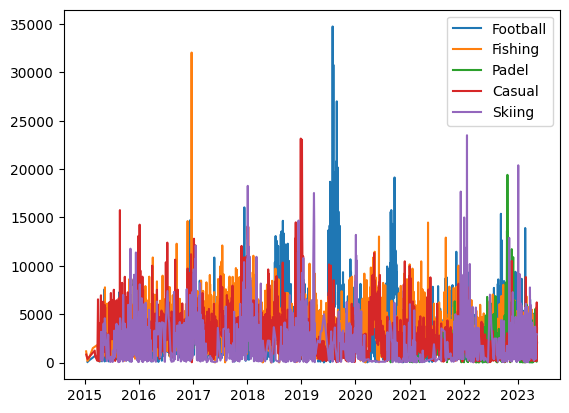

In [ ]:
# Plotting only for the selected sectors
for settore in settori_desiderati:
    plt.plot(df_clean.loc[df_clean["Sector"] == settore]["Date"], df_clean.loc[df_clean["Sector"] == settore]["Total"], label=f"{settore}")

plt.legend()
plt.show()

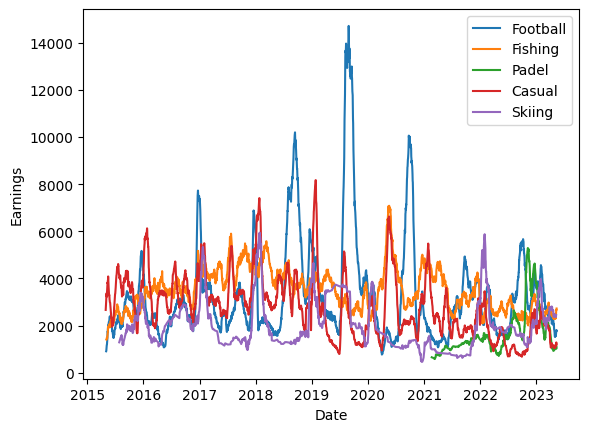

In [ ]:
# Plotting only for the selected sectors
for settore in settori_desiderati:
    plt.plot(df_clean.loc[df_clean["Sector"] == settore]["Date"], df_clean.loc[df_clean["Sector"] == settore]["Total"].rolling(30).mean(), label=f"{settore}")

plt.legend()
plt.xlabel("Date")  # Aggiungi il nome dell'asse x
plt.ylabel("Earnings")  # Aggiungi il nome dell'asse y
plt.show()


Removal of observations for 2013 and 2014 (insignificant)

In [ ]:
df_clean = df_clean[(df_clean['Date'].dt.year != 2013) & (df_clean['Date'].dt.year != 2014)]

In [ ]:
from datetime import datetime
# Filter dates prior to 2020
filtered_df = df_clean[df_clean['Date'].dt.year < 2020]
filtered_df = filtered_df[filtered_df['Sector'] == "Skiing"]
filtered_df.set_index('Date', inplace=True)
filtered_df = filtered_df.resample('M').sum()
filtered_df.reset_index(inplace=True)

<ipython-input-21-abd315bbda18>:6: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  filtered_df = filtered_df.resample('M').sum()


Temperature graph

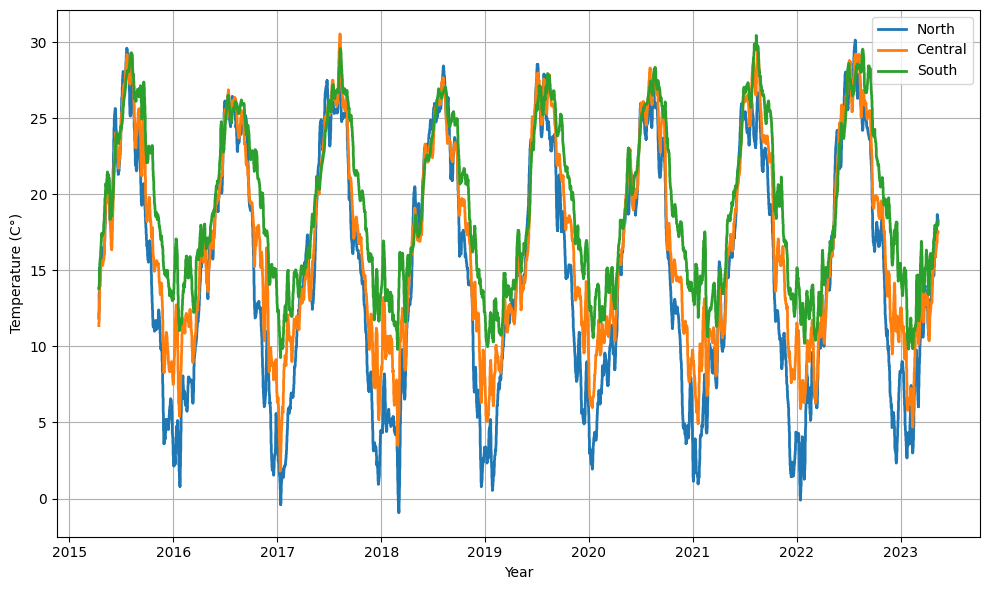

In [ ]:
# Calculating the moving average of temperatures
rolling_mean_nord = df_clean["Temperature_Nord"].rolling(30).mean()
rolling_mean_center = df_clean["Temperature_Center"].rolling(30).mean()
rolling_mean_sud = df_clean["Temperature_Sud"].rolling(30).mean()

# I graph the average temperatures
plt.figure(figsize=(10, 6))  # Set the size of the figure
plt.plot(df_clean["Date"], rolling_mean_nord, label="North", linewidth=2)
plt.plot(df_clean["Date"], rolling_mean_center, label="Central", linewidth=2)
plt.plot(df_clean["Date"], rolling_mean_sud, label="South", linewidth=2)

plt.xlabel("Year")  # X-axis label
plt.ylabel("Temperature (C°)")  # Label of the y-axis
plt.grid(True)  # Show a grid on the graph
plt.legend()  # Show legend
plt.tight_layout()  # Optimizes the arrangement of components in the graph
plt.show()


Dataset saving

In [ ]:
filtered_df.to_csv(filepath + 'dataset_filtrato2019.csv', index=False)

# Sector Football

In [ ]:
df_calcio=df_clean.loc[df_clean["Sector"]=="Football"]
df_calcio=df_calcio[["Date","Total", "Temperature_Nord", "Temperature_Center", "Temperature_Sud"]]

## Aggregate for months over 8 years

In [ ]:
def function(dataSp, dataSpAnnoMese, dataSpTotalePerMese, dataSpMese):
    dataSp = dataSp.set_index('Date')
    dataSp.index = pd.to_datetime(dataSp.index)
    dataSpAnnoMese = dataSp.groupby([(dataSp.index.year), (dataSp.index.month)]).sum()
    dataSpTotalePerMese = dataSp.groupby([(dataSp.index.month)]).sum()
    dataSpMese = dataSp.groupby(pd.Grouper(freq="M")).sum()
    dataSpMese['year'] = [d.year for d in dataSpMese.index]
    dataSpMese['month'] = [d.strftime('%b') for d in dataSpMese.index]
    years = dataSpMese['year'].unique()
    np.random.seed(100)
    mycolors = ["blue",  "green" ,"black" , "cyan", "magenta", "lime", "red", "indigo", "royalblue", "brown"]
    plt.figure(figsize=(10, 8), dpi = 80)
    for i, y in enumerate(years):
        if i > 0:
            plt.plot('month', 'Total', data=dataSpMese.loc[dataSpMese.year==y, :], color=mycolors[i], label=y)
            plt.text(dataSpMese.loc[dataSpMese.year==y, :].shape[0]-.9, dataSpMese.loc[dataSpMese.year==y, 'Total'][-1:].values[0],
                     y, fontsize=12, color=mycolors[i])
    plt.gca().set(xlim=(-0.3, 11), ylabel='$Total(Millions-€)$', xlabel='$Month$')
    plt.yticks(fontsize=12, alpha=.7)
    plt.show()

    return dataSpAnnoMese, dataSpTotalePerMese, dataSpMese

In [ ]:
import matplotlib as mpl
def totaleAnno(dataSpAnno, dataSp, strSp):
    dataSp = dataSp.set_index('Date')
    dataSp.index = pd.to_datetime(dataSp.index)
    dataSpAnno = dataSp.groupby(pd.Grouper(freq="Y")).sum()
    dataSpAnno['year'] = [d.year for d in dataSpAnno.index]
    dataSpAnno['NumAnno'] = dataSpAnno.year.apply(lambda x: 0 if x==2015 else(1 if x==2016 else 2 if x==2017 else 3 if x==2018 else 4 if x==2019 else 5 if x==2020 else 6 if x==2021 else 7 if x==2022 else 8))
    dataSpAnno['Sector'] = strSp
    settori = dataSpAnno['Sector'].unique()
    np.random.seed(100)
    mycolors = np.random.choice(list(mpl.colors.XKCD_COLORS.keys()), len(settori), replace=False)

    plt.figure(figsize=(10, 8), dpi = 80)
    for i, y in enumerate(settori):
            plt.plot('NumAnno', 'Total', data=dataSpAnno.loc[dataSpAnno.Sector==y, :], color=mycolors[i], label=y)
            plt.text(dataSpAnno.loc[dataSpAnno.Sector==y, :].shape[0]-.9, dataSpAnno.loc[dataSpAnno.Sector==y, 'Total'][-1:].values[0],
                     y, fontsize=12, color=mycolors[i])

    plt.gca().set(xlim=(-0.3, 11), ylabel='$Total(Millions-€)$', xlabel='$Year$')
    plt.xticks([0, 1, 2, 3, 4, 5, 6, 7, 8], ['2015', '2016', '2017', '2018', '2019', '2020', '2021', '2022', "2023"])
    plt.yticks(fontsize=12, alpha=.7)
    plt.show()

    return dataSpAnno

In [ ]:
def totaleMese(dataSpTotalePerMese, dataSp, strSp):
  dataSp = dataSp.set_index('Date')
  dataSp.index = pd.to_datetime(dataSp.index)
  dataSp['month'] = [d.strftime('%b') for d in dataSp.index]
  dataSpTotalePerMese = dataSp
  dataSpTotalePerMese['month'] =  dataSpTotalePerMese.month.apply(lambda x: 1 if x=='Jan' else(2 if x=='Feb' else 3 if x=='Mar' else 4 if x=='Apr' else 5 if x=='May' else 6 if x=='Jun' else 7 if x=='Jul' else 8 if x=='Aug' else 9 if x=='Sep' else 10 if x=='Oct' else 11 if x=='Nov' else 12))
  dataSpTotalePerMese = dataSpTotalePerMese.groupby(pd.Grouper(key = 'month')).sum()
  dataSpTotalePerMese['Sector'] = strSp
  dataSpTotalePerMese = dataSpTotalePerMese.sort_values('month')
  dataSpTotalePerMese = dataSpTotalePerMese.reset_index()
  np.random.seed(100)
  mycolors = np.random.choice(list(mpl.colors.XKCD_COLORS.keys()), len(dataSpTotalePerMese['month']), replace=False)
  plt.figure(figsize=(10, 8), dpi = 80)
  for i, y in enumerate(dataSpTotalePerMese['Sector']):
          plt.plot('month', 'Total', data=dataSpTotalePerMese.loc[dataSpTotalePerMese.Sector==y, :], color=mycolors[i], label=y)
          plt.text(dataSpTotalePerMese.loc[dataSpTotalePerMese.Sector==y, :].shape[0]-.9, dataSpTotalePerMese.loc[dataSpTotalePerMese.Sector==y, 'Total'][-1:].values[0],
                  y, fontsize=12, color=mycolors[i])

  plt.gca().set(xlim=(-0.3, 12), ylabel='$Total(Millions-€)$', xlabel='$Month$')
  plt.xticks([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12], [' ', 'Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dic'])
  plt.yticks(fontsize=12, alpha=.7)
  plt.show()

  return dataSpTotalePerMese

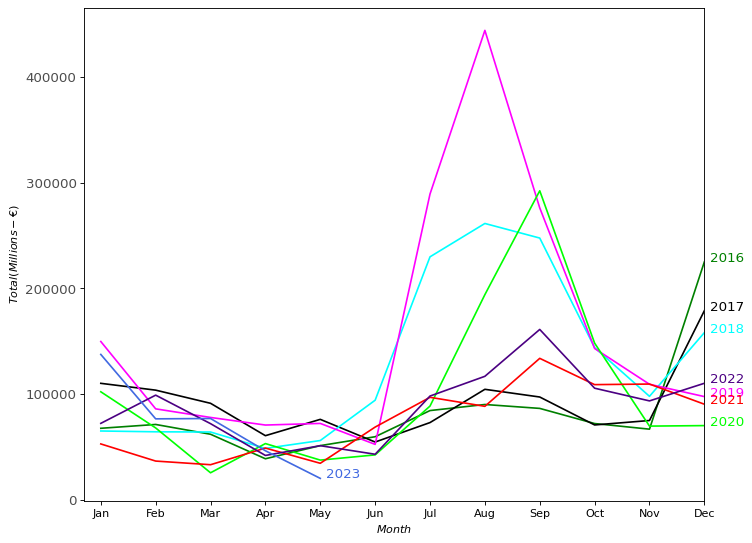

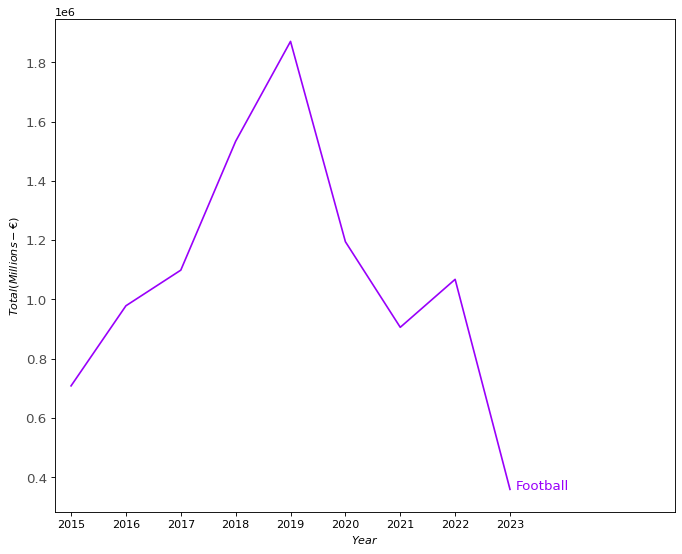

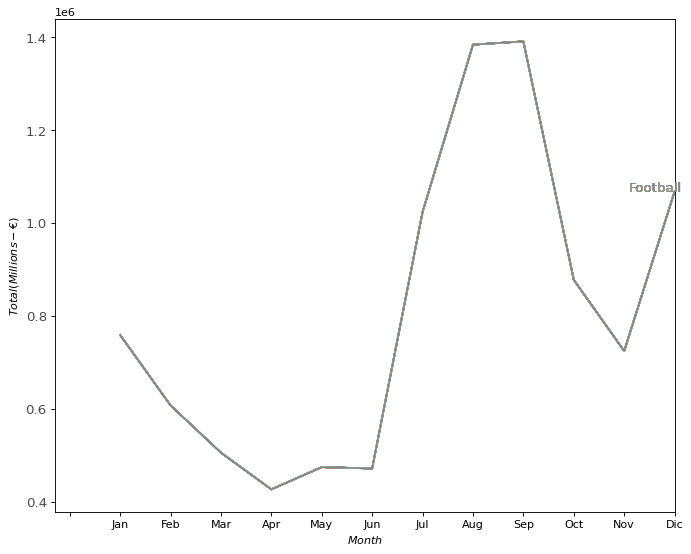

In [ ]:
dataCalcioAnnoMese = df_calcio
dataCalcioTotalePerMese = df_calcio
dataCalcioMese = df_calcio
dataCalcioAnno = df_calcio
strCalcio = "Football"
(dataCalcioAnnoMese, dataCalcioTotalePerMese, dataCalcioMese) = function(df_calcio, dataCalcioAnnoMese, dataCalcioTotalePerMese, dataCalcioMese)
dataCalcioAnno = totaleAnno(dataCalcioAnno, df_calcio, strCalcio)
dataCalcioTotalePerMese = totaleMese(dataCalcioTotalePerMese, df_calcio, strCalcio)

In [ ]:
import pandas as pd

# Create the dataframe df_calcio_m
df_calcio_m = pd.DataFrame()

# Set the index on the 'Date' column
df_calcio.set_index('Date', inplace=True)

# Calculate the sum for the "Total" column with weekly frequency
df_calcio_m['Total'] = df_calcio['Total'].resample('W').sum()

# Calculate the mean for the temperature columns with weekly frequency
df_calcio_m['Temperature_Nord'] = df_calcio['Temperature_Nord'].resample('W').mean()
df_calcio_m['Temperature_Center'] = df_calcio['Temperature_Center'].resample('W').mean()
df_calcio_m['Temperature_Sud'] = df_calcio['Temperature_Sud'].resample('W').mean()

# Remove rows with NaN values in the temperature columns
df_calcio_m = df_calcio_m.dropna(subset=['Temperature_Nord', 'Temperature_Center', 'Temperature_Sud'])

In [ ]:
df_calcio_m=df_calcio_m.round(2)

Smoothed graph with all observations.

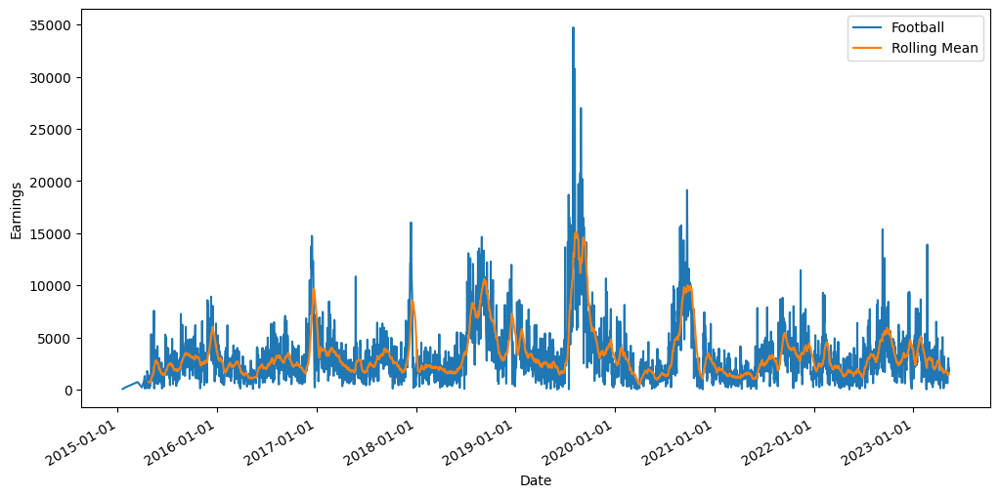

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

calcio_noise = df_calcio['Total'].rolling(20).mean()

# Create a figure and axis
fig, ax = plt.subplots(figsize=(12,6))

# Plot the data and rolling mean
ax.plot(df_calcio.index, df_calcio['Total'])
ax.plot(df_calcio.index, calcio_noise)

# Format the x-axis as dates
date_formatter = mdates.DateFormatter('%Y-%m-%d')
ax.xaxis.set_major_formatter(date_formatter)
plt.gcf().autofmt_xdate()

# Set labels and legend
plt.xlabel('Date')
plt.ylabel('Earnings')
plt.legend(['Football','Rolling Mean'])
# Show the plot
plt.show()

Aggregate relaxed graph by weeks

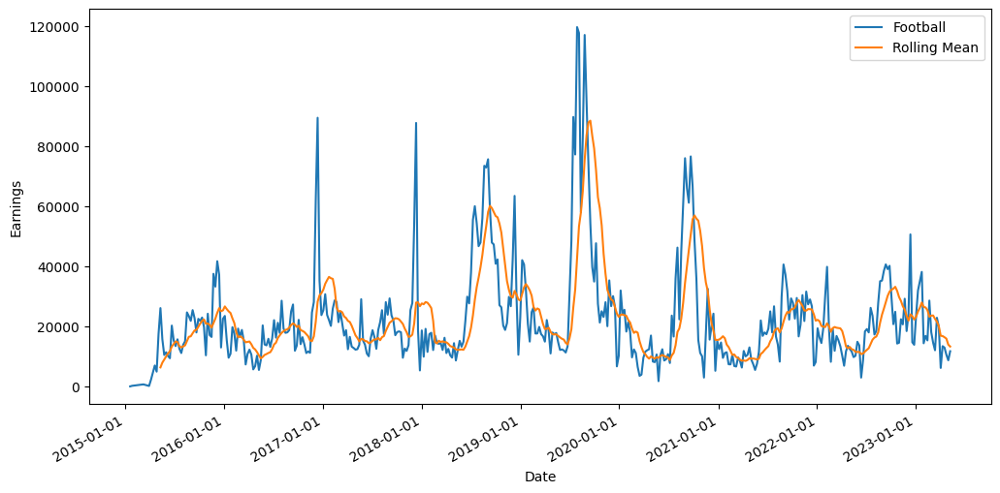

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

calcio_noiseM = df_calcio_m['Total'].rolling(10).mean()

# Create a figure and axis
fig, ax = plt.subplots(figsize=(12,6))

# Plot the data and rolling mean
ax.plot(df_calcio_m.index, df_calcio_m['Total'])
ax.plot(df_calcio_m.index, calcio_noiseM)

# Format the x-axis as dates
date_formatter = mdates.DateFormatter('%Y-%m-%d')
ax.xaxis.set_major_formatter(date_formatter)
plt.gcf().autofmt_xdate()

# Set labels and legend
plt.xlabel('Date')
plt.ylabel('Earnings')
plt.legend(['Football','Rolling Mean'])
# Show the plot
plt.show()

Saving the dataset for analysis in R

In [ ]:
#df_calcio_m=df_calcio_m.reset_index().rename(columns={'data': 'date', 'totale': 'tot'})

In [ ]:
#df_calcio_m.to_csv(filepath + 'df_calcio.csv', index=False)

Partial Autocorrelation

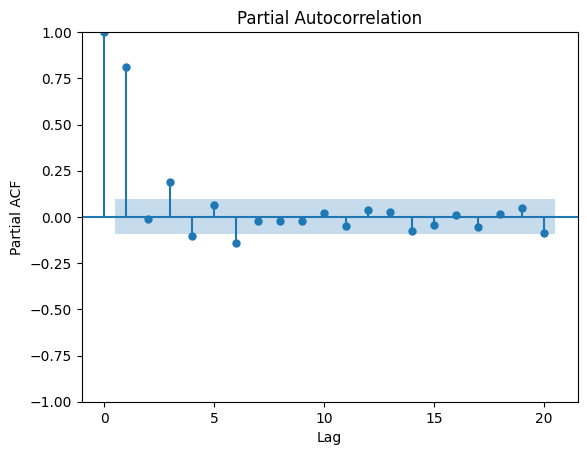

In [ ]:
#Suggerisce un modello MA
from statsmodels.graphics.tsaplots import plot_pacf
plot_pacf(df_calcio_m["Total"], lags=20)
plt.xlabel('Lag')
plt.ylabel('Partial ACF')
plt.show()

## Model for calcio

In [ ]:
pip install pmdarima

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 55.9 MB/s eta 0:00:00


In [ ]:
#from pmdarima import auto_arima
#stepwise_fit = auto_arima(df_calcio_m['Total'], trace=True,suppress_warnings=True)

In [ ]:
 pip install statsmodels

#### Una settimana

ARIMA MODEL

In [ ]:
df_calcio_m.index = pd.DatetimeIndex(df_calcio_m.index).to_period('W')

In [ ]:
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Definisci la finestra temporale per la previsione
window_size = 2

# Esegui la previsione rolling
predictions = []
li=pd.DataFrame()
#df_calcio_m = df_calcio_m.asfreq('W')
exog_data = df_calcio_m[["Temperature_Nord", "Temperature_Center", "Temperature_Sud"]].values  # Variabili esogene
for i in range(len(df_calcio_m) - window_size):
    endog_data = df_calcio_m["Total"].iloc[:i + window_size]
    exog_train_data = exog_data[:i + window_size]
    model = SARIMAX(endog=endog_data, exog=exog_train_data, order=(1, 0, 0), freq="W")  # Esempio di modello ARIMAX con ordine (1, 0, 0)
    model_fit_1 = model.fit()
    forecast = model_fit_1.forecast(steps=1, exog=exog_data[i + window_size].reshape(1, -1))  # Previsione per il prossimo step
    prova = model_fit_1.get_forecast(steps=1, exog=exog_data[i + window_size].reshape(1, -1), alpha=0.05).conf_int()
    predictions.append(forecast)
    li=li.append(prova)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-151-09b4f634c543>:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  li=li.append(prova)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning:

In [ ]:
df_calcio_m.index = df_calcio_m.index.to_timestamp()

In [ ]:
predict_calcio=df_calcio_m[2:].copy()
predict_calcio["Total"]=predictions
predict_calcio=predict_calcio.shift(-1).dropna()

SARIMAX MODEL

In [ ]:
df_calcio_m.index = pd.DatetimeIndex(df_calcio_m.index).to_period('W')

In [ ]:
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Definisci la finestra temporale per la previsione
window_size = 2

# Esegui la previsione rolling
predictions = []
#df_calcio_m = df_calcio_m.asfreq('W')
exog_data = df_calcio_m[["Temperature_Nord", "Temperature_Center", "Temperature_Sud"]].values  # Variabili esogene
for i in range(len(df_calcio_m) - window_size):
    endog_data = df_calcio_m["Total"].iloc[:i + window_size]
    exog_train_data = exog_data[:i + window_size]
    model = SARIMAX(endog=endog_data, exog=exog_train_data, order=(1, 0, 0), seasonal_order=(2, 0, 0, 13), freq="W", initialization='approximate_diffuse')
    model_fit_s1 = model.fit()
    forecast = model_fit_s1.forecast(steps=1, exog=exog_data[i + window_size].reshape(1, -1))  # Previsione per il prossimo step
    predictions.append(forecast)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be s

In [ ]:
df_calcio_m.index = df_calcio_m.index.to_timestamp()

In [ ]:
predict_calcio_s=df_calcio_m[2:].copy()
predict_calcio_s["Total"]=predictions
predict_calcio_s=predict_calcio_s.shift(-1).dropna()

PROPHET MODEL

In [ ]:
df_calcio_m=df_calcio_m.reset_index()
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd
from prophet import Prophet

predictions_prophet=pd.DataFrame(columns=["ds","yhat"])

# Create Prophet dataframe
df_prophet = df_calcio_m[['Date', 'Total',"Temperature_Nord","Temperature_Center","Temperature_Sud"]].copy()
df_prophet.columns = ['ds', 'y',"Temperature_Nord","Temperature_Center","Temperature_Sud"]
#df_prophet["ds"] = pd.to_datetime(df_prophet["ds"].dt.to_timestamp())
df_prophet["ds"] = pd.to_datetime(df_prophet["ds"])


for i in range(2, len(df_calcio_m) - 1):
    df_train = df_prophet[:i]
    df_test = df_prophet.iloc[[i + 1]]

    # Instantiate and fit Prophet model
    model_prophet = Prophet(interval_width=0.95)
    model_prophet.add_regressor("Temperature_Nord")
    model_prophet.add_regressor("Temperature_Center")
    model_prophet.add_regressor("Temperature_Sud")
    model_prophet.fit(df_train)

    # Make predictions for the next observation
    future = model_prophet.make_future_dataframe(periods=2, freq='W')
    future = future.iloc[-1:]  # Select the last row for prediction
    future["Temperature_Nord"] = df_test["Temperature_Nord"].values
    future["Temperature_Center"] = df_test["Temperature_Center"].values
    future["Temperature_Sud"] = df_test["Temperature_Sud"].values

    forecast = model_prophet.predict(future)
    prediction_row = forecast[["ds", "yhat"]].iloc[0]

    predictions_prophet = predictions_prophet.append(prediction_row, ignore_index=True)

predictions_prophet['yhat']=predictions_prophet['yhat'].shift(-1).dropna()
predictions_prophet=predictions_prophet.dropna()

Streaming output truncated to the last 5000 lines.
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=45396', 'data', 'file=/tmp/tmp_onldwd1/olncrblr.json', 'init=/tmp/tmp_onldwd1/48zo1vr7.json', 'output', 'file=/tmp/tmp_onldwd1/prophet_modeltklgd2gv/prophet_model-20230702154805.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
15:48:05 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
15:48:05 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
<ipython-input-159-544bf2eeafda>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions_prophet = predictions_prophet.append(prediction_row, ignore_index=True)
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling weekly s

In [ ]:
df_calcio_m.set_index('Date', inplace=True)

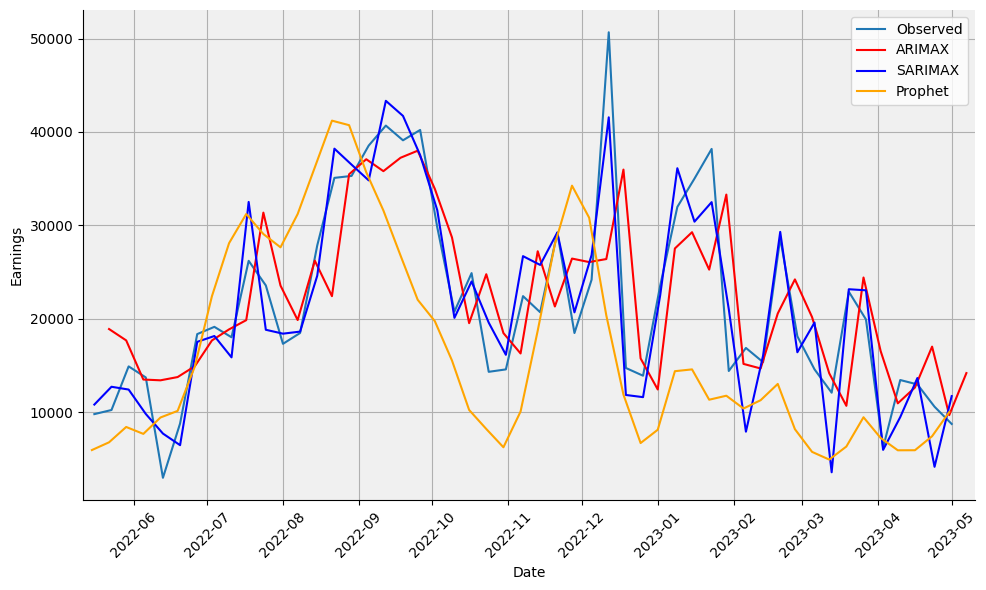

In [ ]:
import matplotlib.pyplot as plt

# Set the figure size to make the dates readable on the x-axis
plt.figure(figsize=(10, 6))

# Plot the graphs of predictions and actual values
plt.plot(df_calcio_m["Total"][-52:-1], label='Observed')
plt.plot(predict_calcio["Total"][-51:], color='red', label='ARIMAX')
plt.plot(predict_calcio_s["Total"][-51:], color='blue', label='SARIMAX')
plt.plot(predictions_prophet["ds"][-51:], predictions_prophet["yhat"][-51:], color='orange', label='Prophet')

# Rotate the labels on the x-axis by 45 degrees to make them readable
plt.xticks(rotation=45)

# Add a legend
plt.legend()

# Set labels and title
plt.xlabel('Date')
plt.ylabel('Earnings')

# Add gridlines
plt.grid(True)

# Set a background color
plt.gca().set_facecolor('#f0f0f0')

# Remove the top and right spines
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

# Add a margin to the x-axis
plt.margins(x=0.01)

# Adjust the layout to avoid overlapping elements
plt.tight_layout()

# Show the graph
plt.show()


In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt
#df_calcio_m[2:].mean()
rmse_ARIMAX=sqrt(mean_squared_error(df_calcio_m["Total"][-52:-1], predict_calcio["Total"][-51:]))
rmse_SARIMAX=sqrt(mean_squared_error(df_calcio_m["Total"][-52:-1], predict_calcio_s["Total"][-51:]))
rmse_Prophet=sqrt(mean_squared_error(df_calcio_m["Total"][-52:-1], predictions_prophet[-51:].set_index("ds").loc[:, ["yhat"]]))
print(rmse_ARIMAX)
print(rmse_SARIMAX)
print(rmse_Prophet)

4652.551631885317
3817.9863275314983
10762.849432200639


In [ ]:
from sklearn.metrics import mean_absolute_percentage_error
error_ARIMAX = mean_absolute_percentage_error(df_calcio_m["Total"][-52:-1], predict_calcio["Total"][-51:])
error_SARIMAX = mean_absolute_percentage_error(df_calcio_m["Total"][-52:-1], predict_calcio_s["Total"][-51:])
error_Prophet = mean_absolute_percentage_error(df_calcio_m["Total"][-52:-1], predictions_prophet[-51:].set_index("ds").loc[:, ["yhat"]])
print(error_ARIMAX)
print(error_SARIMAX)
print(error_Prophet)

0.2561876367101426
0.19341120656195124
0.4334115101061678


#### Due settimane

ARIMA MODEL

In [ ]:
df_calcio_m.index = pd.DatetimeIndex(df_calcio_m.index).to_period('W')

In [ ]:
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Definisci la finestra temporale per la previsione
window_size = 3

# Esegui la previsione rolling
predictions = []
#df_calcio_m = df_calcio_m.asfreq('W')
exog_data = df_calcio_m[["Temperature_Nord", "Temperature_Center", "Temperature_Sud"]].values  # Variabili esogene
for i in range(len(df_calcio_m) - window_size):
    endog_data = df_calcio_m["Total"].iloc[:i + window_size]
    exog_train_data = exog_data[:i + window_size]
    model = SARIMAX(endog=endog_data, exog=exog_train_data, order=(1, 0, 0), freq="W")  # Esempio di modello ARIMAX con ordine (1, 0, 0)
    model_fit_2 = model.fit()
    forecast = model_fit_2.forecast(steps=1, exog=exog_data[i + window_size].reshape(1, -1))  # Previsione per il prossimo step
    predictions.append(forecast)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/mod

In [ ]:
df_calcio_m.index = df_calcio_m.index.to_timestamp()

In [ ]:
predict_calcio=df_calcio_m[3:].copy()
predict_calcio["Total"]=predictions
predict_calcio=predict_calcio.shift(-1).dropna()

SARIMAX MODEL

In [ ]:
df_calcio_m.index = pd.DatetimeIndex(df_calcio_m.index).to_period('W')

In [ ]:
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Definisci la finestra temporale per la previsione
window_size = 3

# Esegui la previsione rolling
predictions = []
#df_calcio_m = df_calcio_m.asfreq('W')
exog_data = df_calcio_m[["Temperature_Nord", "Temperature_Center", "Temperature_Sud"]].values  # Variabili esogene
for i in range(len(df_calcio_m) - window_size):
    endog_data = df_calcio_m["Total"].iloc[:i + window_size]
    exog_train_data = exog_data[:i + window_size]
    model = SARIMAX(endog=endog_data, exog=exog_train_data, order=(1, 0, 0), seasonal_order=(2, 0, 0, 13), freq="W", initialization='approximate_diffuse')
    model_fit_s2 = model.fit()
    forecast = model_fit_s2.forecast(steps=1, exog=exog_data[i + window_size].reshape(1, -1))  # Previsione per il prossimo step
    predictions.append(forecast)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as st

In [ ]:
df_calcio_m.index = df_calcio_m.index.to_timestamp()

In [ ]:
predict_calcio_s=df_calcio_m[3:].copy()
predict_calcio_s["Total"]=predictions
predict_calcio_s=predict_calcio_s.shift(-1).dropna()

PROPHET MODEL

In [ ]:
df_calcio_m=df_calcio_m.reset_index()
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd
from prophet import Prophet

predictions_prophet=pd.DataFrame(columns=["ds","yhat"])

# Create Prophet dataframe
df_prophet = df_calcio_m[['Date', 'Total',"Temperature_Nord","Temperature_Center","Temperature_Sud"]].copy()
df_prophet.columns = ['ds', 'y',"Temperature_Nord","Temperature_Center","Temperature_Sud"]
#df_prophet["ds"] = pd.to_datetime(df_prophet["ds"].dt.to_timestamp())
df_prophet["ds"] = pd.to_datetime(df_prophet["ds"])


for i in range(2, len(df_calcio_m) - 2):
    df_train = df_prophet[:i]
    df_test = df_prophet.iloc[i + 1:i + 3]

    # Instantiate and fit Prophet model
    model_prophet = Prophet(interval_width=0.95)
    model_prophet.add_regressor("Temperature_Nord")
    model_prophet.add_regressor("Temperature_Center")
    model_prophet.add_regressor("Temperature_Sud")
    model_prophet.fit(df_train)

    # Make predictions for the next observation
    future = model_prophet.make_future_dataframe(periods=4, freq='W')
    future = future.iloc[-2:]  # Select the last row for prediction
    future["Temperature_Nord"] = df_test["Temperature_Nord"].values
    future["Temperature_Center"] = df_test["Temperature_Center"].values
    future["Temperature_Sud"] = df_test["Temperature_Sud"].values

    forecast = model_prophet.predict(future)
    prediction_row = forecast[["ds", "yhat"]].iloc[0]

    predictions_prophet = predictions_prophet.append(prediction_row, ignore_index=True)

predictions_prophet['yhat']=predictions_prophet['yhat'].shift(-1).dropna()
predictions_prophet=predictions_prophet.dropna()

Streaming output truncated to the last 5000 lines.
15:59:41 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
15:59:41 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
<ipython-input-175-2a9d3378a503>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions_prophet = predictions_prophet.append(prediction_row, ignore_index=True)
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp_onldwd1/wx0w3bqc.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp_onldwd1/kv9fawc8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads:

In [ ]:
df_calcio_m.set_index('Date', inplace=True)

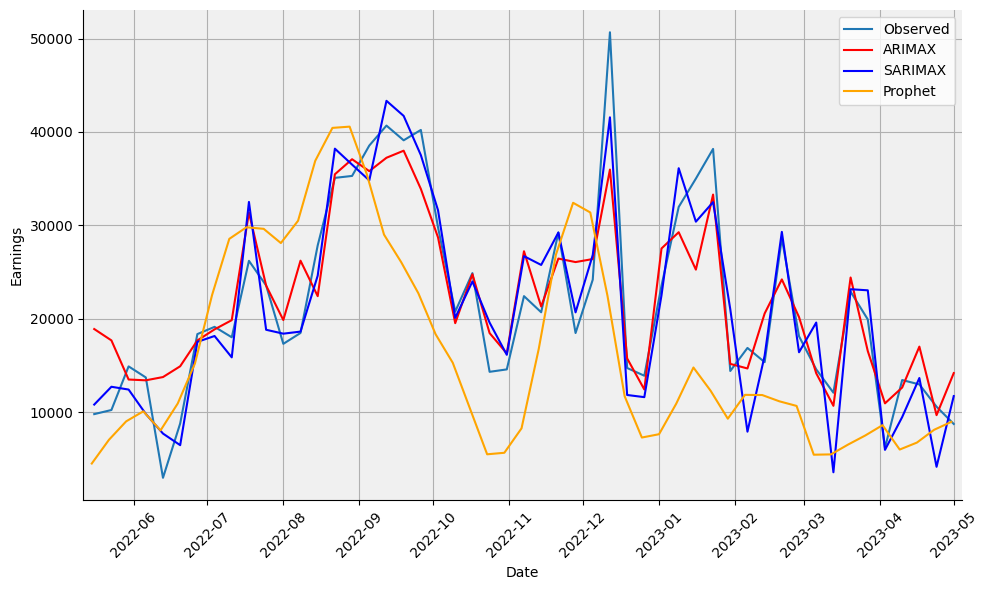

In [ ]:
import matplotlib.pyplot as plt

# Set the figure size to make the dates readable on the x-axis
plt.figure(figsize=(10, 6))

# Plot the graphs of predictions and actual values
plt.plot(df_calcio_m["Total"][-52:-1], label='Observed')
plt.plot(predict_calcio["Total"][-51:], color='red', label='ARIMAX')
plt.plot(predict_calcio_s["Total"][-51:], color='blue', label='SARIMAX')
plt.plot(predictions_prophet["ds"][-51:], predictions_prophet["yhat"][-51:], color='orange', label='Prophet')

# Rotate the labels on the x-axis by 45 degrees to make them readable
plt.xticks(rotation=45)

# Add a legend
plt.legend()

# Set labels and title
plt.xlabel('Date')
plt.ylabel('Earnings')

# Add gridlines
plt.grid(True)

# Set a background color
plt.gca().set_facecolor('#f0f0f0')

# Remove the top and right spines
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

# Add a margin to the x-axis
plt.margins(x=0.01)

# Adjust the layout to avoid overlapping elements
plt.tight_layout()

# Show the graph
plt.show()


In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt
#df_calcio_m[2:].mean()
rmse_ARIMAX=sqrt(mean_squared_error(df_calcio_m["Total"][-52:-1], predict_calcio["Total"][-51:]))
rmse_SARIMAX=sqrt(mean_squared_error(df_calcio_m["Total"][-52:-1], predict_calcio_s["Total"][-51:]))
rmse_Prophet=sqrt(mean_squared_error(df_calcio_m["Total"][-52:-1], predictions_prophet[-51:].set_index("ds").loc[:, ["yhat"]]))
print(rmse_ARIMAX)
print(rmse_SARIMAX)
print(rmse_Prophet)

4652.551631885317
3817.9863275314983
10859.474976746496


In [ ]:
from sklearn.metrics import mean_absolute_percentage_error
error_ARIMAX = mean_absolute_percentage_error(df_calcio_m["Total"][-52:-1], predict_calcio["Total"][-51:])
error_SARIMAX = mean_absolute_percentage_error(df_calcio_m["Total"][-52:-1], predict_calcio_s["Total"][-51:])
error_Prophet = mean_absolute_percentage_error(df_calcio_m["Total"][-52:-1], predictions_prophet[-51:].set_index("ds").loc[:, ["yhat"]])
print(error_ARIMAX)
print(error_SARIMAX)
print(error_Prophet)

0.2561876367101426
0.19341120656195124
0.4338786095873584


#### Tre settimane

ARIMA MODEL

In [ ]:
df_calcio_m.index = pd.DatetimeIndex(df_calcio_m.index).to_period('W')

In [ ]:
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Definisci la finestra temporale per la previsione
window_size = 4

# Esegui la previsione rolling
predictions = []
#df_calcio_m = df_calcio_m.asfreq('W')
exog_data = df_calcio_m[["Temperature_Nord", "Temperature_Center", "Temperature_Sud"]].values  # Variabili esogene
for i in range(len(df_calcio_m) - window_size):
    endog_data = df_calcio_m["Total"].iloc[:i + window_size]
    exog_train_data = exog_data[:i + window_size]
    model = SARIMAX(endog=endog_data, exog=exog_train_data, order=(1, 0, 0), freq="W")  # Esempio di modello ARIMAX con ordine (1, 0, 0)
    model_fit_3 = model.fit()
    forecast = model_fit_3.forecast(steps=1, exog=exog_data[i + window_size].reshape(1, -1))  # Previsione per il prossimo step
    predictions.append(forecast)


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarn

In [ ]:
df_calcio_m.index = df_calcio_m.index.to_timestamp()

In [ ]:
predict_calcio=df_calcio_m[4:].copy()
predict_calcio["Total"]=predictions
predict_calcio=predict_calcio.shift(-1).dropna()

SARIMAX MODEL

In [ ]:
df_calcio_m.index = pd.DatetimeIndex(df_calcio_m.index).to_period('W')

In [ ]:
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Definisci la finestra temporale per la previsione
window_size = 4

# Esegui la previsione rolling
predictions = []
li=pd.DataFrame()
#df_calcio_m = df_calcio_m.asfreq('W')
exog_data = df_calcio_m[["Temperature_Nord", "Temperature_Center", "Temperature_Sud"]].values  # Variabili esogene
for i in range(len(df_calcio_m) - window_size):
    endog_data = df_calcio_m["Total"].iloc[:i + window_size]
    exog_train_data = exog_data[:i + window_size]
    model = SARIMAX(endog=endog_data, exog=exog_train_data, order=(1, 0, 0), seasonal_order=(2, 0, 0, 13), freq="W", initialization='approximate_diffuse')
    model_fit_s3 = model.fit()
    forecast = model_fit_s3.forecast(steps=1, exog=exog_data[i + window_size].reshape(1, -1))  # Previsione per il prossimo step
    prova = model_fit_s3.get_forecast(steps=1, exog=exog_data[i + window_size].reshape(1, -1), alpha=0.05).conf_int()
    predictions.append(forecast)
    li=li.append(prova)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
<ipython-input-185-95de3702b7a2>:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  li=li.append(prova)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate st

In [ ]:
df_calcio_m.index = df_calcio_m.index.to_timestamp()

In [ ]:
predict_calcio_s=df_calcio_m[4:].copy()
predict_calcio_s["Total"]=predictions
predict_calcio_s=predict_calcio_s.shift(-1).dropna()

PROPHET MODEL

In [ ]:
df_calcio_m=df_calcio_m.reset_index()
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd
from prophet import Prophet

predictions_prophet=pd.DataFrame(columns=["ds","yhat"])

# Create Prophet dataframe
df_prophet = df_calcio_m[['Date', 'Total',"Temperature_Nord","Temperature_Center","Temperature_Sud"]].copy()
df_prophet.columns = ['ds', 'y',"Temperature_Nord","Temperature_Center","Temperature_Sud"]
#df_prophet["ds"] = pd.to_datetime(df_prophet["ds"].dt.to_timestamp())
df_prophet["ds"] = pd.to_datetime(df_prophet["ds"])


for i in range(2, len(df_calcio_m) - 3):
    df_train = df_prophet[:i]
    df_test = df_prophet.iloc[i + 1:i + 4]

    # Instantiate and fit Prophet model
    model_prophet = Prophet(interval_width=0.95)
    model_prophet.add_regressor("Temperature_Nord")
    model_prophet.add_regressor("Temperature_Center")
    model_prophet.add_regressor("Temperature_Sud")
    model_prophet.fit(df_train)

    # Make predictions for the next observation
    future = model_prophet.make_future_dataframe(periods=6, freq='W')
    future = future.iloc[-3:]  # Select the last row for prediction
    future["Temperature_Nord"] = df_test["Temperature_Nord"].values
    future["Temperature_Center"] = df_test["Temperature_Center"].values
    future["Temperature_Sud"] = df_test["Temperature_Sud"].values

    forecast = model_prophet.predict(future)
    prediction_row = forecast[["ds", "yhat"]].iloc[0]

    predictions_prophet = predictions_prophet.append(prediction_row, ignore_index=True)

predictions_prophet['yhat']=predictions_prophet['yhat'].shift(-1).dropna()
predictions_prophet=predictions_prophet.dropna()

Streaming output truncated to the last 5000 lines.
INFO:cmdstanpy:Chain [1] start processing
16:11:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
<ipython-input-188-ca43da263856>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  predictions_prophet = predictions_prophet.append(prediction_row, ignore_index=True)
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp_onldwd1/qsfvcgcp.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp_onldwd1/1_rwcsqr.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/pyth

In [ ]:
df_calcio_m.set_index('Date', inplace=True)

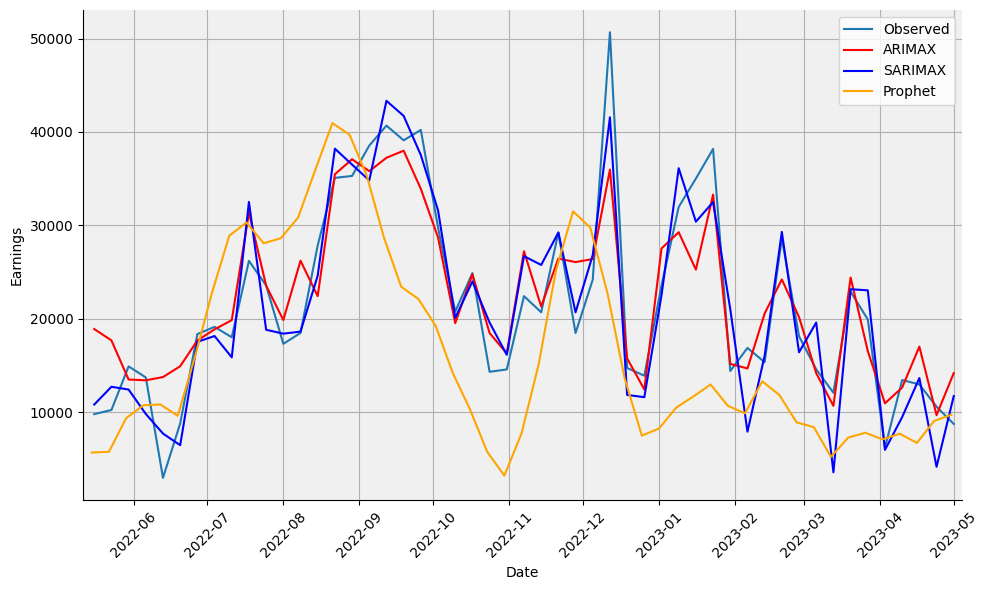

In [ ]:
import matplotlib.pyplot as plt

# Set the figure size to make the dates readable on the x-axis
plt.figure(figsize=(10, 6))

# Plot the graphs of predictions and actual values
plt.plot(df_calcio_m["Total"][-52:-1], label='Observed')
plt.plot(predict_calcio["Total"][-51:], color='red', label='ARIMAX')
plt.plot(predict_calcio_s["Total"][-51:], color='blue', label='SARIMAX')
plt.plot(predictions_prophet["ds"][-51:], predictions_prophet["yhat"][-51:], color='orange', label='Prophet')

# Rotate the labels on the x-axis by 45 degrees to make them readable
plt.xticks(rotation=45)

# Add a legend
plt.legend()

# Set labels and title
plt.xlabel('Date')
plt.ylabel('Earnings')

# Add gridlines
plt.grid(True)

# Set a background color
plt.gca().set_facecolor('#f0f0f0')

# Remove the top and right spines
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

# Add a margin to the x-axis
plt.margins(x=0.01)

# Adjust the layout to avoid overlapping elements
plt.tight_layout()

# Show the graph
plt.show()


In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt
#df_calcio_m[2:].mean()
rmse_ARIMAX=sqrt(mean_squared_error(df_calcio_m["Total"][-52:-1], predict_calcio["Total"][-51:]))
rmse_SARIMAX=sqrt(mean_squared_error(df_calcio_m["Total"][-52:-1], predict_calcio_s["Total"][-51:]))
rmse_Prophet=sqrt(mean_squared_error(df_calcio_m["Total"][-52:-1], predictions_prophet[-51:].set_index("ds").loc[:, ["yhat"]]))
print(rmse_ARIMAX)
print(rmse_SARIMAX)
print(rmse_Prophet)

4652.551631885317
3817.9863275314983
10983.808682543582


In [ ]:
from sklearn.metrics import mean_absolute_percentage_error
error_ARIMAX = mean_absolute_percentage_error(df_calcio_m["Total"][-52:-1], predict_calcio["Total"][-51:])
error_SARIMAX = mean_absolute_percentage_error(df_calcio_m["Total"][-52:-1], predict_calcio_s["Total"][-51:])
error_Prophet = mean_absolute_percentage_error(df_calcio_m["Total"][-52:-1], predictions_prophet[-51:].set_index("ds").loc[:, ["yhat"]])
print(error_ARIMAX)
print(error_SARIMAX)
print(error_Prophet)

0.2561876367101426
0.19341120656195124
0.4394246871434958


Possible future scenarios with confidence intervals



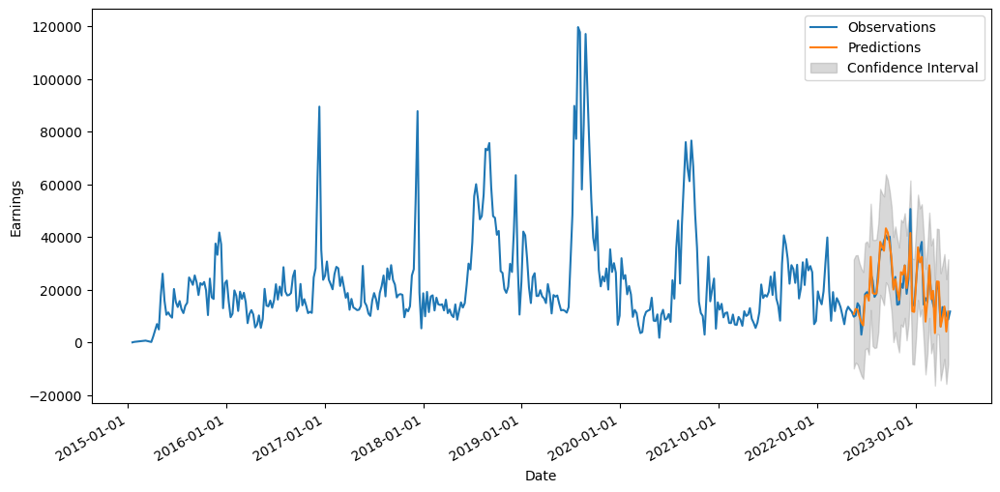

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np

# Convert predictions and confidence intervals to arrays
# predictions = np.array(predictions)
ci = li

# Create a figure and axis
fig, ax = plt.subplots(figsize=(12, 6))

# Plot all observations
ax.plot(df_calcio_m.index, df_calcio_m['Total'], label='Observations')

# Plot predictions for the last 52 weeks
ax.plot(df_calcio_m.index[-52:-1], predict_calcio_s["Total"][-51:], label='Predictions')

# Plot confidence intervals for the last 52 weeks
ax.fill_between(df_calcio_m.index[-52:-1], ci.iloc[-51:, 0], ci.iloc[-51:, 1], color='gray', alpha=0.3, label='Confidence Interval')

# Format the x-axis as dates
date_formatter = mdates.DateFormatter('%Y-%m-%d')
ax.xaxis.set_major_formatter(date_formatter)
plt.gcf().autofmt_xdate()

# Set labels and legend
plt.xlabel('Date')
plt.ylabel('Earnings')
plt.legend()

# Show the plot
plt.show()


Possible future scenarios with 1000 random solutions

In [ ]:
import statsmodels.api as sm
model2=sm.tsa.ARIMA(df_calcio_m["Total"], order=(1,0,3))
model_fit2 = model2.fit()

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


In [ ]:
simulation=model_fit2.simulate(52,anchor='end',repetitions=1000)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


In [ ]:
ar_params = model_fit2.arparams
ma_params = model_fit2.maparams

# Extract the residuals from the fitted model
residuals = model_fit2.resid

# Estimate the variance of the residuals
residual_variance = np.var(residuals)

In [ ]:
num_periods=52
simulations=[]
for _ in range(1000):
    # Generate random errors based on the estimated variance
    errors = np.random.normal(loc=0, scale=np.sqrt(residual_variance), size=num_periods)

    # Generate simulated data for each scenario
    simulated_data = model_fit2.forecast(steps=num_periods).values + errors
    simulations.append(simulated_data)

# Create a pandas DataFrame for the simulated data
dates = pd.date_range(start='2023-01-01', periods=num_periods, freq='W')
simulations_df = pd.DataFrame(simulations, index=np.arange(1000), columns=dates)
mean_simulated_data = simulations_df.mean()


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa

Graphs

In [ ]:
# Iterate over all the columns of the dataframe
for column in simulation.columns:
    # Replace negative numbers with NaN in the current column
    simulation[column] = simulation[column].apply(lambda x: np.NaN if x < 0 else x)

In [ ]:
simulations_df1=simulations_df
# Iterate over all the columns of the dataframe
for column in simulations_df.columns:
    # Replace negative numbers with 0 in the current column
    simulations_df1[column] = simulations_df[column].apply(lambda x: 0 if x < 0 else x)

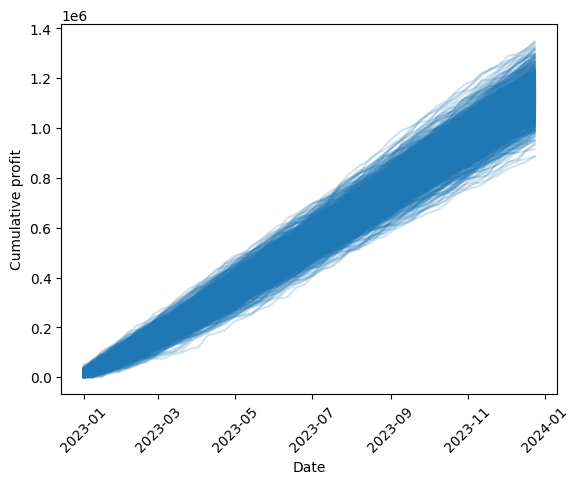

In [ ]:
# Calculation of cumulative earnings for each row
df_cumulative = simulations_df1.cumsum(axis=1)

# Plotting the cumulative earnings graph for each row
plt.plot(simulations_df1.columns, df_cumulative.transpose(), color="C0", alpha=0.2)
plt.xlabel('Date')
plt.ylabel('Cumulative profit')
plt.xticks(rotation=45)
plt.show()

In [ ]:
simulations_df2=simulations_df
# Iterate over all the columns of the dataframe
for column in simulations_df.columns:
    # Replace negative numbers with 0 in the current column
    simulations_df2[column] = simulations_df[column].apply(lambda x: np.NaN if x < 0 else x)

<ipython-input-213-82f1b22c8850>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(simulation.values.flatten(), shade=True)


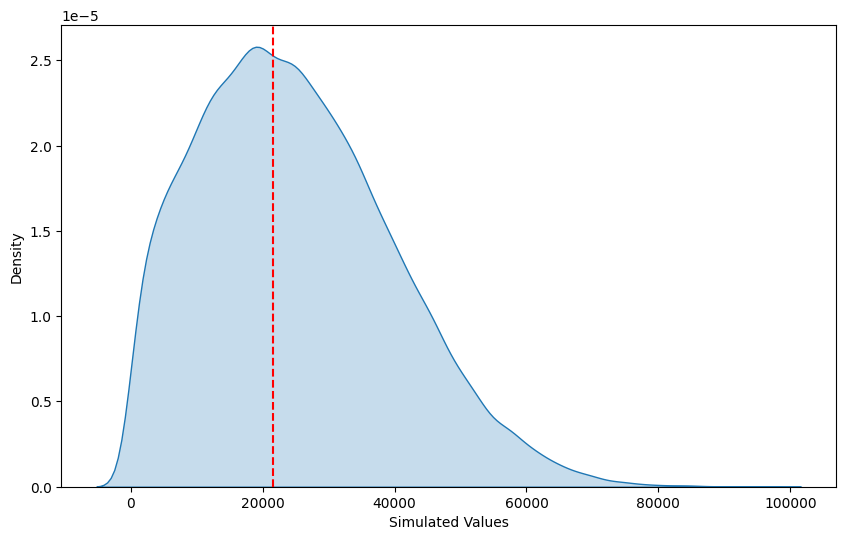

In [ ]:
import seaborn as sns
plt.figure(figsize=(10, 6))
sns.kdeplot(simulation.values.flatten(), shade=True)
plt.xlabel('Simulated Values')
plt.ylabel('Density')
mean_value = np.nanmean(simulations_df2.values.flatten())
plt.axvline(x=mean_value, color='red', linestyle='--', label='Mean Value')
plt.show()

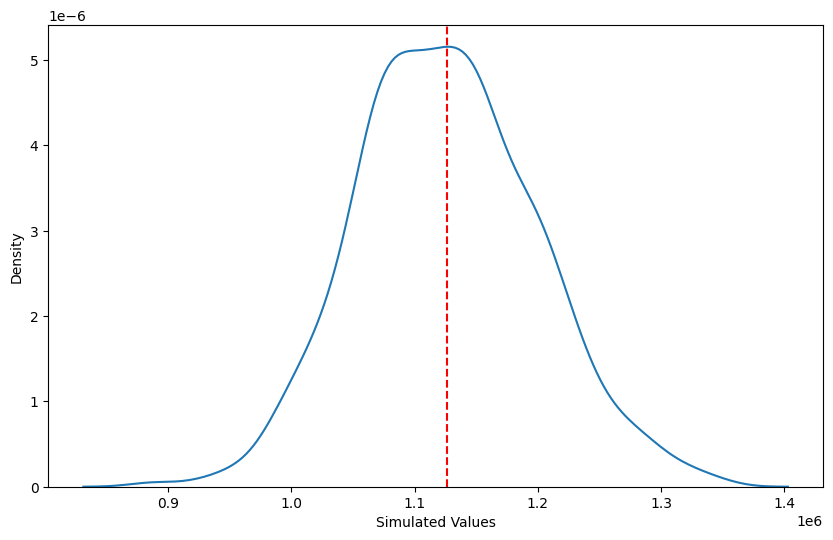

In [ ]:
last_period_values = df_cumulative.iloc[: , -1]
mean_value = last_period_values.mean()
plt.figure(figsize=(10, 6))
sns.kdeplot(last_period_values)
plt.xlabel('Simulated Values')
plt.ylabel('Density')
mean_value = np.mean(last_period_values.values.flatten())
plt.axvline(mean_value, color='red', linestyle='--', label='Mean')
plt.show()

The predicted values are quite different from the observed one but the model is able to follow the trend of the data.


# Sector Pesca


In [ ]:
df_pesca=df_clean.loc[df_clean["Sector"]=="Fishing"]
df_pesca=df_pesca[["Date","Total", "Temperature_Nord", "Temperature_Center", "Temperature_Sud"]]

## Aggregare per mesi su 8 anni

In [ ]:
def function(dataSp, dataSpAnnoMese, dataSpTotalePerMese, dataSpMese):
    dataSp = dataSp.set_index('Date')
    dataSp.index = pd.to_datetime(dataSp.index)
    dataSpAnnoMese = dataSp.groupby([(dataSp.index.year), (dataSp.index.month)]).sum()
    dataSpTotalePerMese = dataSp.groupby([(dataSp.index.month)]).sum()
    dataSpMese = dataSp.groupby(pd.Grouper(freq="M")).sum()
    dataSpMese['year'] = [d.year for d in dataSpMese.index]
    dataSpMese['month'] = [d.strftime('%b') for d in dataSpMese.index]
    years = dataSpMese['year'].unique()
    np.random.seed(100)
    mycolors = ["blue",  "green" ,"black" , "cyan", "magenta", "lime", "red", "indigo", "royalblue", "brown"]
    plt.figure(figsize=(10, 8), dpi = 80)
    for i, y in enumerate(years):
        if i > 0:
            plt.plot('month', 'Total', data=dataSpMese.loc[dataSpMese.year==y, :], color=mycolors[i], label=y)
            plt.text(dataSpMese.loc[dataSpMese.year==y, :].shape[0]-.9, dataSpMese.loc[dataSpMese.year==y, 'Total'][-1:].values[0],
                     y, fontsize=12, color=mycolors[i])
    plt.gca().set(xlim=(-0.3, 11), ylabel='$Total(Millions-€)$', xlabel='$Month$')
    plt.yticks(fontsize=12, alpha=.7)
    plt.show()

    return dataSpAnnoMese, dataSpTotalePerMese, dataSpMese

In [ ]:
import matplotlib as mpl
def totaleAnno(dataSpAnno, dataSp, strSp):
    dataSp = dataSp.set_index('Date')
    dataSp.index = pd.to_datetime(dataSp.index)
    dataSpAnno = dataSp.groupby(pd.Grouper(freq="Y")).sum()
    dataSpAnno['year'] = [d.year for d in dataSpAnno.index]
    dataSpAnno['NumAnno'] = dataSpAnno.year.apply(lambda x: 0 if x==2015 else(1 if x==2016 else 2 if x==2017 else 3 if x==2018 else 4 if x==2019 else 5 if x==2020 else 6 if x==2021 else 7 if x==2022 else 8))
    dataSpAnno['Sector'] = strSp
    settori = dataSpAnno['Sector'].unique()
    np.random.seed(100)
    mycolors = np.random.choice(list(mpl.colors.XKCD_COLORS.keys()), len(settori), replace=False)

    plt.figure(figsize=(10, 8), dpi = 80)
    for i, y in enumerate(settori):
            plt.plot('NumAnno', 'Total', data=dataSpAnno.loc[dataSpAnno.Sector==y, :], color=mycolors[i], label=y)
            plt.text(dataSpAnno.loc[dataSpAnno.Sector==y, :].shape[0]-.9, dataSpAnno.loc[dataSpAnno.Sector==y, 'Total'][-1:].values[0],
                     y, fontsize=12, color=mycolors[i])

    plt.gca().set(xlim=(-0.3, 11), ylabel='$Total(Millions-€)$', xlabel='$Year$')
    plt.xticks([0, 1, 2, 3, 4, 5, 6, 7, 8], ['2015', '2016', '2017', '2018', '2019', '2020', '2021', '2022', "2023"])
    plt.yticks(fontsize=12, alpha=.7)
    plt.show()

    return dataSpAnno

In [ ]:
def totaleMese(dataSpTotalePerMese, dataSp, strSp):
  dataSp = dataSp.set_index('Date')
  dataSp.index = pd.to_datetime(dataSp.index)
  dataSp['month'] = [d.strftime('%b') for d in dataSp.index]
  dataSpTotalePerMese = dataSp
  dataSpTotalePerMese['month'] =  dataSpTotalePerMese.month.apply(lambda x: 1 if x=='Jan' else(2 if x=='Feb' else 3 if x=='Mar' else 4 if x=='Apr' else 5 if x=='May' else 6 if x=='Jun' else 7 if x=='Jul' else 8 if x=='Aug' else 9 if x=='Sep' else 10 if x=='Oct' else 11 if x=='Nov' else 12))
  dataSpTotalePerMese = dataSpTotalePerMese.groupby(pd.Grouper(key = 'month')).sum()
  dataSpTotalePerMese['Sector'] = strSp
  dataSpTotalePerMese = dataSpTotalePerMese.sort_values('month')
  dataSpTotalePerMese = dataSpTotalePerMese.reset_index()
  np.random.seed(100)
  mycolors = np.random.choice(list(mpl.colors.XKCD_COLORS.keys()), len(dataSpTotalePerMese['month']), replace=False)
  plt.figure(figsize=(10, 8), dpi = 80)
  for i, y in enumerate(dataSpTotalePerMese['Sector']):
          plt.plot('month', 'Total', data=dataSpTotalePerMese.loc[dataSpTotalePerMese.Sector==y, :], color=mycolors[i], label=y)
          plt.text(dataSpTotalePerMese.loc[dataSpTotalePerMese.Sector==y, :].shape[0]-.9, dataSpTotalePerMese.loc[dataSpTotalePerMese.Sector==y, 'Total'][-1:].values[0],
                  y, fontsize=12, color=mycolors[i])

  plt.gca().set(xlim=(-0.3, 12), ylabel='$Total(Millions-€)$', xlabel='$Month$')
  plt.xticks([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12], [' ', 'Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dic'])
  plt.yticks(fontsize=12, alpha=.7)
  plt.show()

  return dataSpTotalePerMese

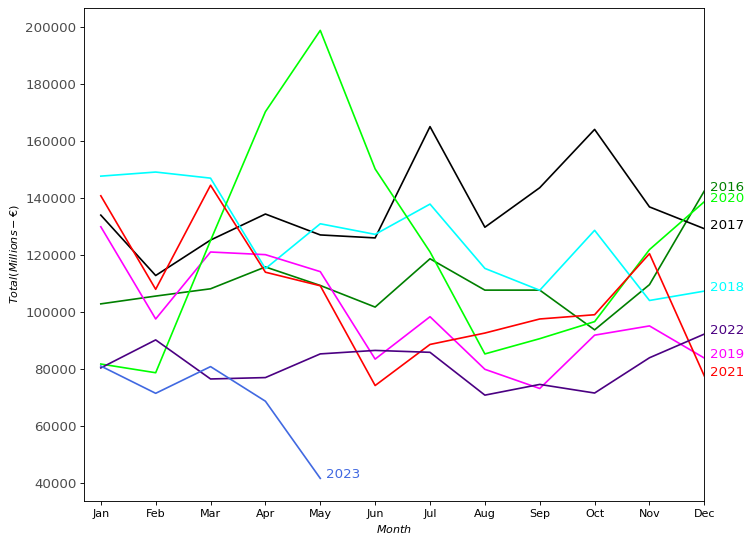

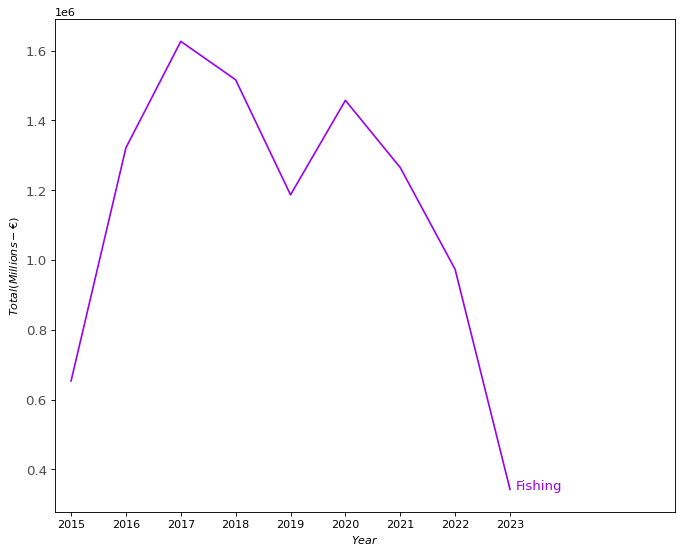

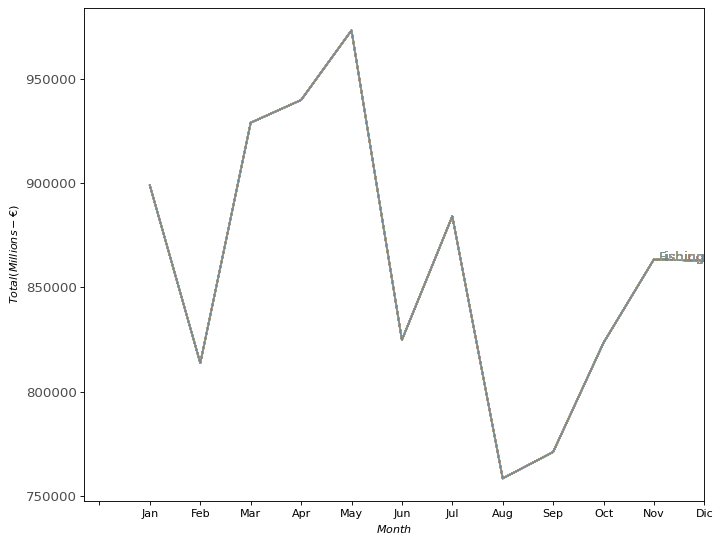

In [ ]:
dataPescaAnnoMese = df_pesca
dataPescaTotalePerMese = df_pesca
dataPescaMese = df_pesca
dataPescaAnno = df_pesca
strPesca = "Fishing"
(dataPescaAnnoMese, dataPescaTotalePerMese, dataPescaMese) = function(df_pesca, dataPescaAnnoMese, dataPescaTotalePerMese, dataPescaMese)
dataPescaAnno = totaleAnno(dataPescaAnno, df_pesca, strPesca)
dataPescaTotalePerMese = totaleMese(dataPescaTotalePerMese, df_pesca, strPesca)

In [ ]:
import pandas as pd

# Create the dataframe df_pesca_m
df_pesca_m = pd.DataFrame()

# Set the index on the 'Date' column
df_pesca.set_index('Date', inplace=True)

# Calculate the sum for the "Total" column with weekly frequency
df_pesca_m['Total'] = df_pesca['Total'].resample('W').sum()

# Calculate the mean for the temperature columns with weekly frequency
df_pesca_m['Temperature_Nord'] = df_pesca['Temperature_Nord'].resample('W').mean()
df_pesca_m['Temperature_Center'] = df_pesca['Temperature_Center'].resample('W').mean()
df_pesca_m['Temperature_Sud'] = df_pesca['Temperature_Sud'].resample('W').mean()

# Remove rows with NaN values in the temperature columns
df_pesca_m = df_pesca_m.dropna(subset=['Temperature_Nord', 'Temperature_Center', 'Temperature_Sud'])

In [ ]:
df_pesca_m=df_pesca_m.round(2)

Smoothed graph with all observations

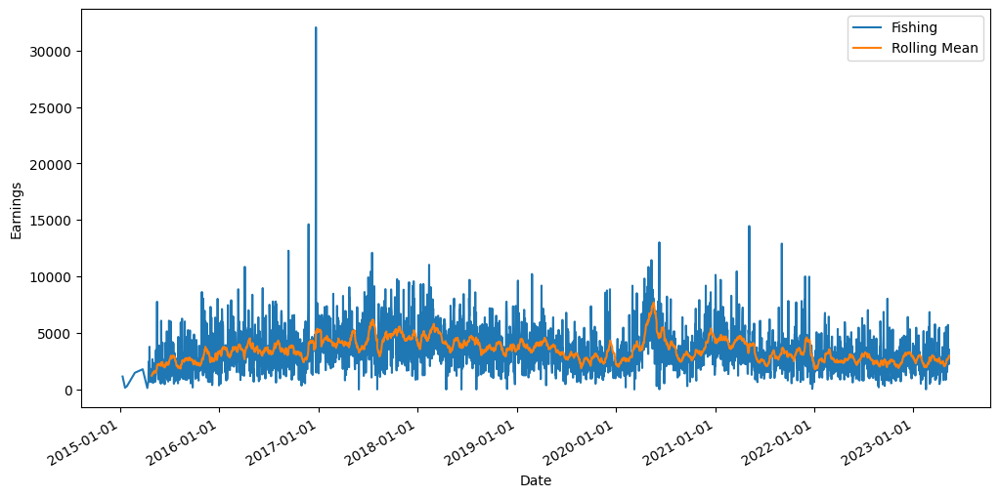

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

pesca_noise = df_pesca['Total'].rolling(20).mean()

# Create a figure and axis
fig, ax = plt.subplots(figsize=(12,6))

# Plot the data and rolling mean
ax.plot(df_pesca.index, df_pesca['Total'])
ax.plot(df_pesca.index, pesca_noise)

# Format the x-axis as dates
date_formatter = mdates.DateFormatter('%Y-%m-%d')
ax.xaxis.set_major_formatter(date_formatter)
plt.gcf().autofmt_xdate()

# Set labels and legend
plt.xlabel('Date')
plt.ylabel('Earnings')
plt.legend(['Fishing','Rolling Mean'])
# Show the plot
plt.show()

Aggregate relaxed graph by weeks

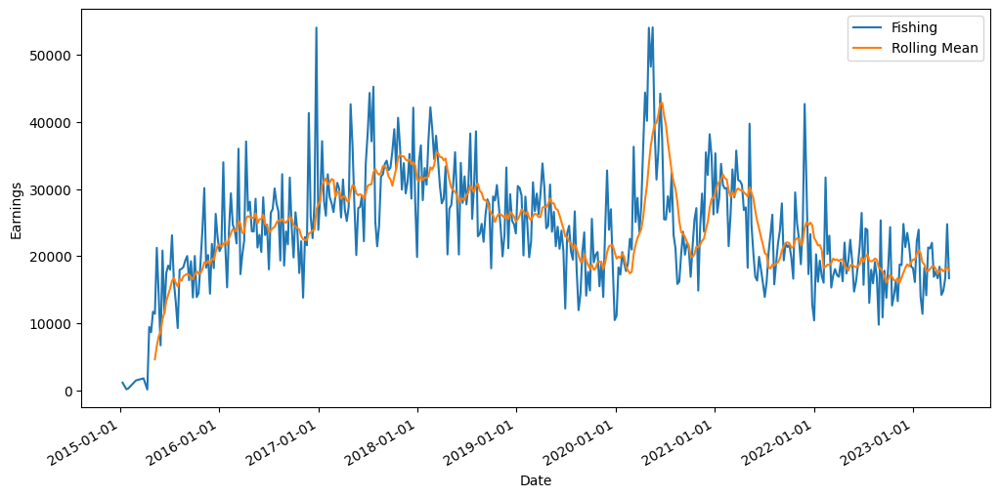

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

pesca_noiseM = df_pesca_m['Total'].rolling(10).mean()

# Create a figure and axis
fig, ax = plt.subplots(figsize=(12,6))

# Plot the data and rolling mean
ax.plot(df_pesca_m.index, df_pesca_m['Total'])
ax.plot(df_pesca_m.index, pesca_noiseM)

# Format the x-axis as dates
date_formatter = mdates.DateFormatter('%Y-%m-%d')
ax.xaxis.set_major_formatter(date_formatter)
plt.gcf().autofmt_xdate()

# Set labels and legend
plt.xlabel('Date')
plt.ylabel('Earnings')
plt.legend(['Fishing','Rolling Mean'])
# Show the plot
plt.show()

Saving the dataset for analysis in R

In [ ]:
#df_pesca_m=df_pesca_m.reset_index()

In [ ]:
#df_pesca_m.to_csv(filepath + 'df_pesca.csv', index=False)

/usr/local/lib/python3.10/dist-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


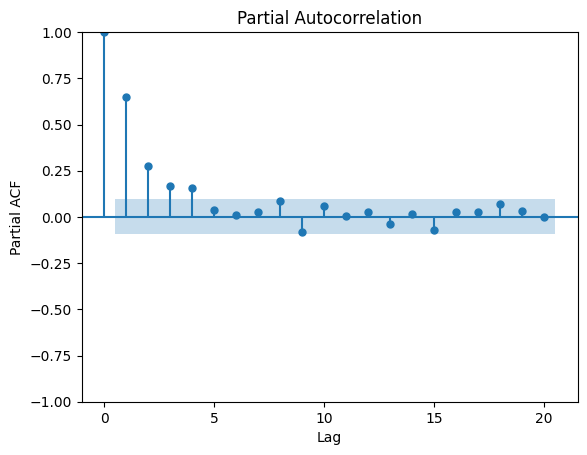

In [ ]:
from statsmodels.graphics.tsaplots import plot_pacf
plot_pacf(df_pesca_m["Total"], lags=20)
plt.xlabel('Lag')
plt.ylabel('Partial ACF')
plt.show()

## Model for pesca

ARIMA MODEL

In [ ]:
#from pmdarima import auto_arima
#stepwise_fit = auto_arima(df_pesca_m['Total'], trace=True,suppress_warnings=True)

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=8774.611, Time=0.45 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=8910.772, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=8832.659, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=8774.185, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=8908.785, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=8773.716, Time=0.13 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=8775.666, Time=0.26 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=8775.796, Time=0.23 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=8773.861, Time=0.12 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=8805.323, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=8771.413, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=8772.151, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=8830.699, Time=0.05 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=8773.378, Time=0.20 sec
 ARIMA(1,1,2)(0,0,0)[0]          

#### Una settimana

ARIMA MODEL

In [ ]:
df_pesca_m.index = pd.DatetimeIndex(df_pesca_m.index).to_period('W')

In [ ]:
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Definisci la finestra temporale per la previsione
window_size = 2

# Esegui la previsione rolling
predictions = []
#df_pesca_m = df_pesca_m.asfreq('W')
exog_data = df_pesca_m[["Temperature_Nord", "Temperature_Center", "Temperature_Sud"]].values  # Variabili esogene
for i in range(len(df_pesca_m) - window_size):
    endog_data = df_pesca_m["Total"].iloc[:i + window_size]
    exog_train_data = exog_data[:i + window_size]
    model = SARIMAX(endog=endog_data, exog=exog_train_data, order=(1, 0, 0), freq="W")  # Esempio di modello ARIMAX con ordine (1, 0, 0)
    model_fit_1 = model.fit()
    forecast = model_fit_1.forecast(steps=1, exog=exog_data[i + window_size].reshape(1, -1))  # Previsione per il prossimo step
    predictions.append(forecast)


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood op

In [ ]:
df_pesca_m.index = df_pesca_m.index.to_timestamp()

In [ ]:
predict_pesca=df_calcio_m[1:].copy()
predict_pesca["Total"]=predictions
predict_pesca=predict_pesca.shift(-1).dropna()

SARIMAX MODEL

In [ ]:
df_pesca_m.index = pd.DatetimeIndex(df_pesca_m.index).to_period('W')

In [ ]:
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Definisci la finestra temporale per la previsione
window_size = 2

# Esegui la previsione rolling
predictions = []
#df_pesca_m = df_pesca_m.asfreq('W')
exog_data = df_pesca_m[["Temperature_Nord", "Temperature_Center", "Temperature_Sud"]].values  # Variabili esogene
for i in range(len(df_pesca_m) - window_size):
    endog_data = df_pesca_m["Total"].iloc[:i + window_size]
    exog_train_data = exog_data[:i + window_size]
    model = SARIMAX(endog=endog_data, exog=exog_train_data, order=(1, 0, 0), seasonal_order=(2, 0, 0, 13), freq="W", initialization='approximate_diffuse')
    model_fit_s1 = model.fit()
    forecast = model_fit_s1.forecast(steps=1, exog=exog_data[i + window_size].reshape(1, -1))  # Previsione per il prossimo step
    predictions.append(forecast)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimat

In [ ]:
df_pesca_m.index = df_pesca_m.index.to_timestamp()

In [ ]:
predict_pesca_s=df_pesca_m[2:].copy()
predict_pesca_s["Total"]=predictions
predict_pesca_s=predict_pesca_s.shift(-1).dropna()

PROPHET MODEL

In [ ]:
df_pesca_m=df_pesca_m.reset_index()
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd
from prophet import Prophet

pesca_prophet=pd.DataFrame(columns=["ds","yhat"])

# Create Prophet dataframe
df_prophet = df_pesca_m[['Date', 'Total',"Temperature_Nord","Temperature_Center","Temperature_Sud"]].copy()
df_prophet.columns = ['ds', 'y',"Temperature_Nord","Temperature_Center","Temperature_Sud"]
#df_prophet["ds"] = pd.to_datetime(df_prophet["ds"].dt.to_timestamp())
df_prophet["ds"] = pd.to_datetime(df_prophet["ds"])


for i in range(2, len(df_pesca_m) - 1):
    df_train = df_prophet[:i]
    df_test = df_prophet.iloc[[i + 1]]

    # Instantiate and fit Prophet model
    model_prophet = Prophet(interval_width=0.95)
    model_prophet.add_regressor("Temperature_Nord")
    model_prophet.add_regressor("Temperature_Center")
    model_prophet.add_regressor("Temperature_Sud")
    model_prophet.fit(df_train)

    # Make predictions for the next observation
    future = model_prophet.make_future_dataframe(periods=2, freq='W')
    future = future.iloc[-1:]  # Select the last row for prediction
    future["Temperature_Nord"] = df_test["Temperature_Nord"].values
    future["Temperature_Center"] = df_test["Temperature_Center"].values
    future["Temperature_Sud"] = df_test["Temperature_Sud"].values

    forecast = model_prophet.predict(future)
    prediction_row = forecast[["ds", "yhat", "yhat_lower", "yhat_upper"]].iloc[0]

    pesca_prophet = pesca_prophet.append(prediction_row, ignore_index=True)

pesca_prophet['yhat']=pesca_prophet['yhat'].shift(-1).dropna()
pesca_prophet=pesca_prophet.dropna()

Streaming output truncated to the last 5000 lines.
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=75564', 'data', 'file=/tmp/tmp_onldwd1/hf64ukgx.json', 'init=/tmp/tmp_onldwd1/z3ot3216.json', 'output', 'file=/tmp/tmp_onldwd1/prophet_model5co3qifg/prophet_model-20230702163448.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
16:34:48 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
16:34:49 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
<ipython-input-207-7aff3f5263f8>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pesca_prophet = pesca_prophet.append(prediction_row, ignore_index=True)
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seaso

In [ ]:
df_pesca_m.set_index('Date', inplace=True)

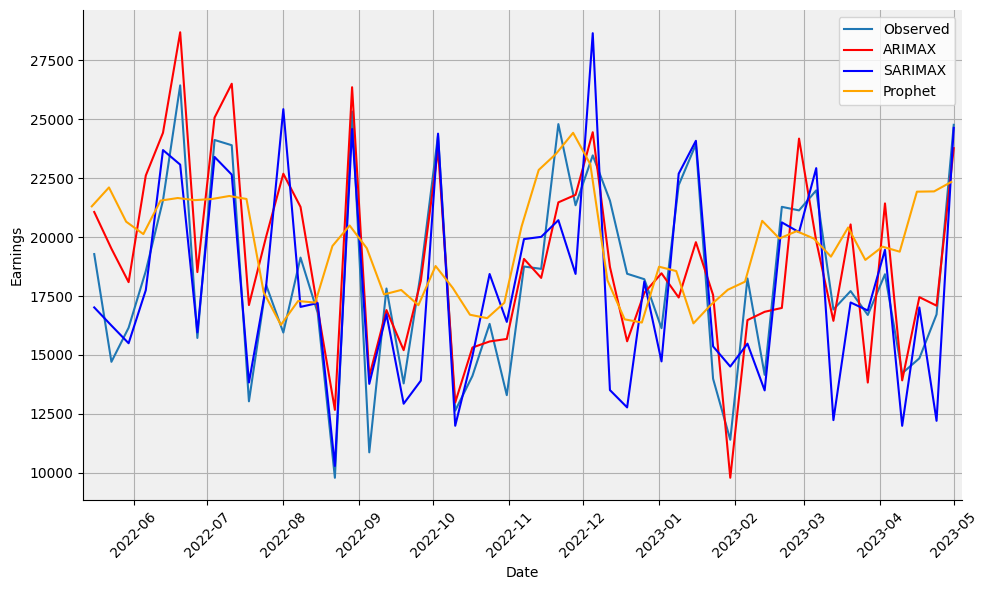

In [ ]:
import matplotlib.pyplot as plt

# Set the figure size to make the dates readable on the x-axis
plt.figure(figsize=(10, 6))

# Plot the graphs of predictions and actual values
plt.plot(df_pesca_m["Total"][-52:-1], label='Observed')
plt.plot(predict_pesca["Total"][-51:], color='red', label='ARIMAX')
plt.plot(predict_pesca_s["Total"][-51:], color='blue', label='SARIMAX')
plt.plot(pesca_prophet["ds"][-51:], pesca_prophet["yhat"][-51:], color='orange', label='Prophet')

# Rotate the labels on the x-axis by 45 degrees to make them readable
plt.xticks(rotation=45)

# Add a legend
plt.legend()

# Set labels and title
plt.xlabel('Date')
plt.ylabel('Earnings')

# Add gridlines
plt.grid(True)

# Set a background color
plt.gca().set_facecolor('#f0f0f0')

# Remove the top and right spines
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

# Add a margin to the x-axis
plt.margins(x=0.01)

# Adjust the layout to avoid overlapping elements
plt.tight_layout()

# Show the graph
plt.show()


In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

rmse_ARIMAX=sqrt(mean_squared_error(df_pesca_m["Total"][-52:-1], predict_pesca["Total"][-51:]))
rmse_SARIMAX=sqrt(mean_squared_error(df_pesca_m["Total"][-52:-1], predict_pesca_s["Total"][-51:]))
rmse_Prophet=sqrt(mean_squared_error(df_pesca_m["Total"][-52:-1], pesca_prophet[-51:].set_index("ds").loc[:, ["yhat"]]))
print(rmse_ARIMAX)
print(rmse_SARIMAX)
print(rmse_Prophet)

2590.8273641983765
2794.2847634435484
4143.942930853228


In [ ]:
from sklearn.metrics import mean_absolute_percentage_error
error_ARIMAX = mean_absolute_percentage_error(df_pesca_m["Total"][-52:-1], predict_pesca["Total"][-51:])
error_SARIMAX = mean_absolute_percentage_error(df_pesca_m["Total"][-52:-1], predict_pesca_s["Total"][-51:])
error_Prophet = mean_absolute_percentage_error(df_pesca_m["Total"][-52:-1], pesca_prophet[-51:].set_index("ds").loc[:, ["yhat"]])
print(error_ARIMAX)
print(error_SARIMAX)
print(error_Prophet)

0.12605035853396987
0.11195198843280904
0.21081900569079548


#### Due settimane

ARIMA MODEL

In [ ]:
df_pesca_m.index = pd.DatetimeIndex(df_pesca_m.index).to_period('W')

In [ ]:
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Definisci la finestra temporale per la previsione
window_size = 3

# Esegui la previsione rolling
predictions = []
#df_pesca_m = df_pesca_m.asfreq('W')
exog_data = df_pesca_m[["Temperature_Nord", "Temperature_Center", "Temperature_Sud"]].values  # Variabili esogene
for i in range(len(df_pesca_m) - window_size):
    endog_data = df_pesca_m["Total"].iloc[:i + window_size]
    exog_train_data = exog_data[:i + window_size]
    model = SARIMAX(endog=endog_data, exog=exog_train_data, order=(1, 0, 0), freq="W")  # Esempio di modello ARIMAX con ordine (1, 0, 0)
    model_fit_2 = model.fit()
    forecast = model_fit_2.forecast(steps=1, exog=exog_data[i + window_size].reshape(1, -1))  # Previsione per il prossimo step
    predictions.append(forecast)


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood op

In [ ]:
df_pesca_m.index = df_pesca_m.index.to_timestamp()

In [ ]:
predict_pesca=df_pesca_m[3:].copy()
predict_pesca["Total"]=predictions
predict_pesca=predict_pesca.shift(-1).dropna()

SARIMAX MODEL

In [ ]:
df_pesca_m.index = pd.DatetimeIndex(df_pesca_m.index).to_period('W')

In [ ]:
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Definisci la finestra temporale per la previsione
window_size = 3

# Esegui la previsione rolling
predictions = []
#df_pesca_m = df_pesca_m.asfreq('W')
exog_data = df_pesca_m[["Temperature_Nord", "Temperature_Center", "Temperature_Sud"]].values  # Variabili esogene
for i in range(len(df_pesca_m) - window_size):
    endog_data = df_pesca_m["Total"].iloc[:i + window_size]
    exog_train_data = exog_data[:i + window_size]
    model = SARIMAX(endog=endog_data, exog=exog_train_data, order=(1, 0, 0), seasonal_order=(2, 0, 0, 13), freq="W", initialization='approximate_diffuse')
    model_fit_s2 = model.fit()
    forecast = model_fit_s2.forecast(steps=1, exog=exog_data[i + window_size].reshape(1, -1))  # Previsione per il prossimo step
    predictions.append(forecast)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimat

In [ ]:
df_pesca_m.index = df_pesca_m.index.to_timestamp()

In [ ]:
predict_pesca_s=df_pesca_m[3:].copy()
predict_pesca_s["Total"]=predictions
predict_pesca_s=predict_pesca_s.shift(-1).dropna()

PROPHET MODEL

In [ ]:
df_pesca_m=df_pesca_m.reset_index()
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd
from prophet import Prophet

pesca_prophet=pd.DataFrame(columns=["ds","yhat"])

# Create Prophet dataframe
df_prophet = df_pesca_m[['Date', 'Total',"Temperature_Nord","Temperature_Center","Temperature_Sud"]].copy()
df_prophet.columns = ['ds', 'y',"Temperature_Nord","Temperature_Center","Temperature_Sud"]
#df_prophet["ds"] = pd.to_datetime(df_prophet["ds"].dt.to_timestamp())
df_prophet["ds"] = pd.to_datetime(df_prophet["ds"])


for i in range(2, len(df_pesca_m) - 2):
    df_train = df_prophet[:i]
    df_test = df_prophet.iloc[i + 1:i + 3]

    # Instantiate and fit Prophet model
    model_prophet = Prophet(interval_width=0.95)
    model_prophet.add_regressor("Temperature_Nord")
    model_prophet.add_regressor("Temperature_Center")
    model_prophet.add_regressor("Temperature_Sud")
    model_prophet.fit(df_train)

    # Make predictions for the next observation
    future = model_prophet.make_future_dataframe(periods=4, freq='W')
    future = future.iloc[-2:]  # Select the last row for prediction
    future["Temperature_Nord"] = df_test["Temperature_Nord"].values
    future["Temperature_Center"] = df_test["Temperature_Center"].values
    future["Temperature_Sud"] = df_test["Temperature_Sud"].values

    forecast = model_prophet.predict(future)
    prediction_row = forecast[["ds", "yhat"]].iloc[0]

    pesca_prophet = pesca_prophet.append(prediction_row, ignore_index=True)

pesca_prophet['yhat']=pesca_prophet['yhat'].shift(-1).dropna()
pesca_prophet=pesca_prophet.dropna()

Streaming output truncated to the last 5000 lines.
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=80350', 'data', 'file=/tmp/tmp_onldwd1/htj3memo.json', 'init=/tmp/tmp_onldwd1/gej_bayo.json', 'output', 'file=/tmp/tmp_onldwd1/prophet_modelms2zu295/prophet_model-20230702165043.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
16:50:43 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
16:50:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
<ipython-input-221-64354c727221>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pesca_prophet = pesca_prophet.append(prediction_row, ignore_index=True)
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to overrid

In [ ]:
df_pesca_m.set_index('Date', inplace=True)

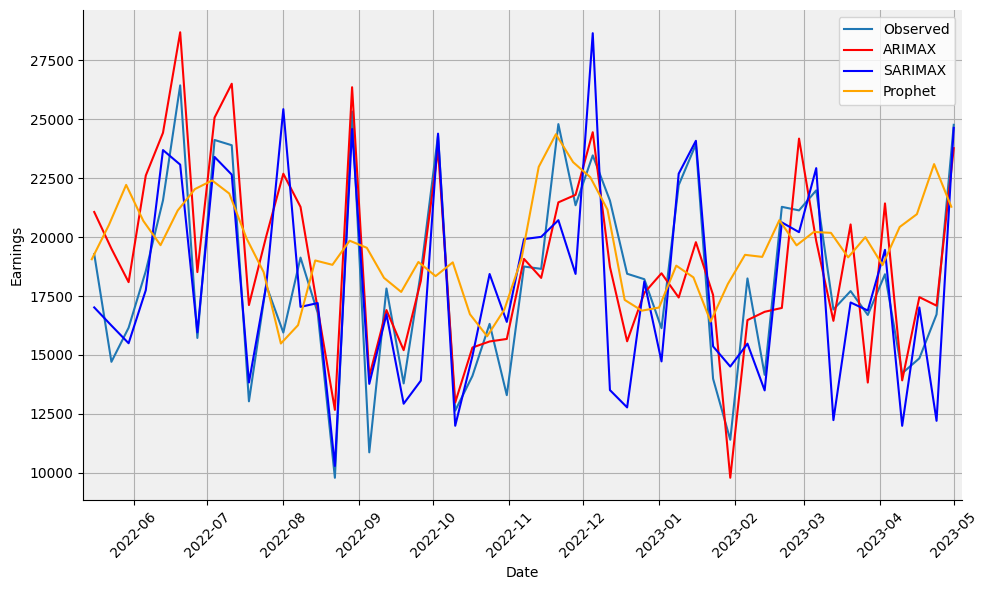

In [ ]:
import matplotlib.pyplot as plt

# Set the figure size to make the dates readable on the x-axis
plt.figure(figsize=(10, 6))

# Plot the graphs of predictions and actual values
plt.plot(df_pesca_m["Total"][-52:-1], label='Observed')
plt.plot(predict_pesca["Total"][-51:], color='red', label='ARIMAX')
plt.plot(predict_pesca_s["Total"][-51:], color='blue', label='SARIMAX')
plt.plot(pesca_prophet["ds"][-51:], pesca_prophet["yhat"][-51:], color='orange', label='Prophet')

# Rotate the labels on the x-axis by 45 degrees to make them readable
plt.xticks(rotation=45)

# Add a legend
plt.legend()

# Set labels and title
plt.xlabel('Date')
plt.ylabel('Earnings')

# Add gridlines
plt.grid(True)

# Set a background color
plt.gca().set_facecolor('#f0f0f0')

# Remove the top and right spines
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

# Add a margin to the x-axis
plt.margins(x=0.01)

# Adjust the layout to avoid overlapping elements
plt.tight_layout()

# Show the graph
plt.show()


In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

rmse_ARIMAX=sqrt(mean_squared_error(df_pesca_m["Total"][-52:-1], predict_pesca["Total"][-51:]))
rmse_SARIMAX=sqrt(mean_squared_error(df_pesca_m["Total"][-52:-1], predict_pesca_s["Total"][-51:]))
rmse_Prophet=sqrt(mean_squared_error(df_pesca_m["Total"][-52:-1], pesca_prophet[-51:].set_index("ds").loc[:, ["yhat"]]))
print(rmse_ARIMAX)
print(rmse_SARIMAX)
print(rmse_Prophet)

2590.8273641983765
2794.2847634435484
4002.901327586302


In [ ]:
from sklearn.metrics import mean_absolute_percentage_error
error_ARIMAX = mean_absolute_percentage_error(df_pesca_m["Total"][-52:-1], predict_pesca["Total"][-51:])
error_SARIMAX = mean_absolute_percentage_error(df_pesca_m["Total"][-52:-1], predict_pesca_s["Total"][-51:])
error_Prophet = mean_absolute_percentage_error(df_pesca_m["Total"][-52:-1], pesca_prophet[-51:].set_index("ds").loc[:, ["yhat"]])
print(error_ARIMAX)
print(error_SARIMAX)
print(error_Prophet)

0.12605035853396987
0.11195198843280904
0.20200174373797913


#### Tre settimane

ARIMA MODEL

In [ ]:
df_pesca_m.index = pd.DatetimeIndex(df_pesca_m.index).to_period('W')

In [ ]:
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Definisci la finestra temporale per la previsione
window_size = 4

# Esegui la previsione rolling
predictions = []
#df_pesca_m = df_pesca_m.asfreq('W')
exog_data = df_pesca_m[["Temperature_Nord", "Temperature_Center", "Temperature_Sud"]].values  # Variabili esogene
for i in range(len(df_pesca_m) - window_size):
    endog_data = df_pesca_m["Total"].iloc[:i + window_size]
    exog_train_data = exog_data[:i + window_size]
    model = SARIMAX(endog=endog_data, exog=exog_train_data, order=(1, 0, 0), freq="W")  # Esempio di modello ARIMAX con ordine (1, 0, 0)
    model_fit_3 = model.fit()
    forecast = model_fit_3.forecast(steps=1, exog=exog_data[i + window_size].reshape(1, -1))  # Previsione per il prossimo step
    predictions.append(forecast)


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood op

In [ ]:
df_pesca_m.index = df_pesca_m.index.to_timestamp()

In [ ]:
predict_pesca=df_pesca_m[4:].copy()
predict_pesca["Total"]=predictions
predict_pesca=predict_pesca.shift(-1).dropna()

SARIMAX MODEL

In [ ]:
df_pesca_m.index = pd.DatetimeIndex(df_pesca_m.index).to_period('W')

In [ ]:
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Definisci la finestra temporale per la previsione
window_size = 4

# Esegui la previsione rolling
predictions = []
li=pd.DataFrame()
#df_pesca_m = df_pesca_m.asfreq('W')
exog_data = df_pesca_m[["Temperature_Nord", "Temperature_Center", "Temperature_Sud"]].values  # Variabili esogene
for i in range(len(df_pesca_m) - window_size):
    endog_data = df_pesca_m["Total"].iloc[:i + window_size]
    exog_train_data = exog_data[:i + window_size]
    model = SARIMAX(endog=endog_data, exog=exog_train_data, order=(1, 0, 0), seasonal_order=(2, 0, 0, 13), freq="W", initialization='approximate_diffuse')
    model_fit_s3 = model.fit()
    forecast = model_fit_s3.forecast(steps=1, exog=exog_data[i + window_size].reshape(1, -1))  # Previsione per il prossimo step
    prova = model_fit_s3.get_forecast(steps=1, exog=exog_data[i + window_size].reshape(1, -1), alpha=0.05).conf_int()
    predictions.append(forecast)
    li=li.append(prova)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
<ipython-input-27-3491e62bfa02>:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  li=li.append(prova)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
<ipython-input-27-3491e62bfa02>:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  li=li.append(prova)
/usr/local/lib/python3.10/dist-packa

In [ ]:
df_pesca_m.index = df_pesca_m.index.to_timestamp()

In [ ]:
predict_pesca_s=df_pesca_m[4:].copy()
predict_pesca_s["Total"]=predictions

PROPHET MODEL

In [ ]:
df_pesca_m=df_pesca_m.reset_index()
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd
from prophet import Prophet

pesca_prophet=pd.DataFrame(columns=["ds","yhat"])

# Create Prophet dataframe
df_prophet = df_pesca_m[['Date', 'Total',"Temperature_Nord","Temperature_Center","Temperature_Sud"]].copy()
df_prophet.columns = ['ds', 'y',"Temperature_Nord","Temperature_Center","Temperature_Sud"]
#df_prophet["ds"] = pd.to_datetime(df_prophet["ds"].dt.to_timestamp())
df_prophet["ds"] = pd.to_datetime(df_prophet["ds"])


for i in range(2, len(df_pesca_m) - 3):
    df_train = df_prophet[:i]
    df_test = df_prophet.iloc[i + 1:i + 4]

    # Instantiate and fit Prophet model
    model_prophet = Prophet(interval_width=0.95)
    model_prophet.add_regressor("Temperature_Nord")
    model_prophet.add_regressor("Temperature_Center")
    model_prophet.add_regressor("Temperature_Sud")
    model_prophet.fit(df_train)

    # Make predictions for the next observation
    future = model_prophet.make_future_dataframe(periods=6, freq='W')
    future = future.iloc[-3:]  # Select the last row for prediction
    future["Temperature_Nord"] = df_test["Temperature_Nord"].values
    future["Temperature_Center"] = df_test["Temperature_Center"].values
    future["Temperature_Sud"] = df_test["Temperature_Sud"].values

    forecast = model_prophet.predict(future)
    prediction_row = forecast[["ds", "yhat"]].iloc[0]

    pesca_prophet = pesca_prophet.append(prediction_row, ignore_index=True)

pesca_prophet['yhat']=pesca_prophet['yhat'].shift(-1).dropna()
pesca_prophet=pesca_prophet.dropna()

Streaming output truncated to the last 5000 lines.
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=27664', 'data', 'file=/tmp/tmp_onldwd1/f4lrrk6z.json', 'init=/tmp/tmp_onldwd1/z158g_tt.json', 'output', 'file=/tmp/tmp_onldwd1/prophet_modelgz44msyu/prophet_model-20230702170948.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:09:48 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:09:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
<ipython-input-236-42f6fbac44b3>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  pesca_prophet = pesca_prophet.append(prediction_row, ignore_index=True)
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. 

In [ ]:
df_pesca_m.set_index('Date', inplace=True)

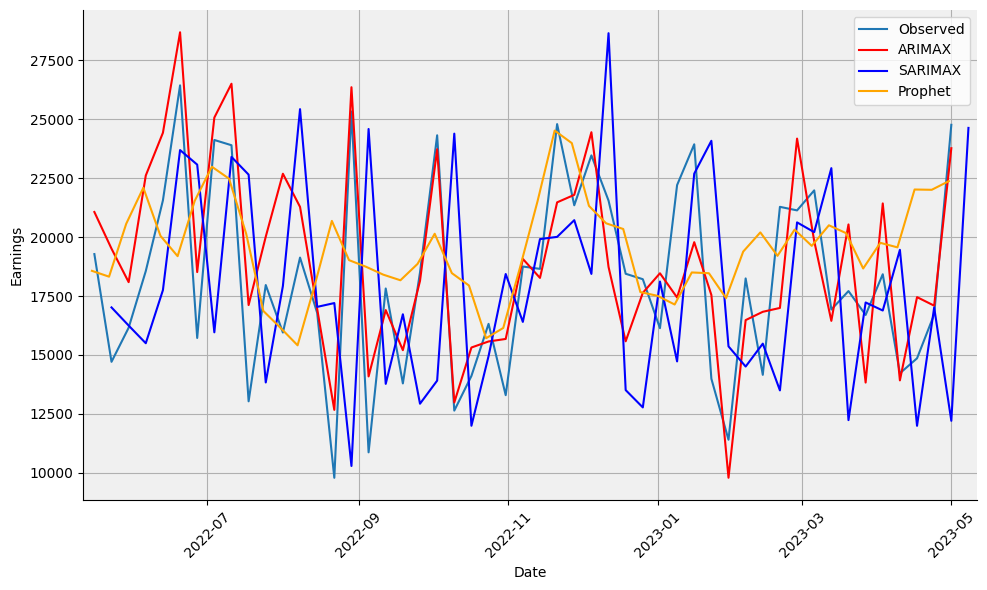

In [ ]:
import matplotlib.pyplot as plt

# Set the figure size to make the dates readable on the x-axis
plt.figure(figsize=(10, 6))

# Plot the graphs of predictions and actual values
plt.plot(df_pesca_m["Total"][-52:-1], label='Observed')
plt.plot(predict_pesca["Total"][-51:], color='red', label='ARIMAX')
plt.plot(predict_pesca_s["Total"][-51:], color='blue', label='SARIMAX')
plt.plot(pesca_prophet["ds"][-51:], pesca_prophet["yhat"][-51:], color='orange', label='Prophet')

# Rotate the labels on the x-axis by 45 degrees to make them readable
plt.xticks(rotation=45)

# Add a legend
plt.legend()

# Set labels and title
plt.xlabel('Date')
plt.ylabel('Earnings')

# Add gridlines
plt.grid(True)

# Set a background color
plt.gca().set_facecolor('#f0f0f0')

# Remove the top and right spines
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

# Add a margin to the x-axis
plt.margins(x=0.01)

# Adjust the layout to avoid overlapping elements
plt.tight_layout()

# Show the graph
plt.show()


In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt
#df_pesca_m[2:].mean()
rmse_ARIMAX=sqrt(mean_squared_error(df_pesca_m["Total"][-52:-1], predict_pesca["Total"][-51:]))
rmse_SARIMAX=sqrt(mean_squared_error(df_pesca_m["Total"][-52:-1], predict_pesca_s["Total"][-51:]))
rmse_Prophet=sqrt(mean_squared_error(df_pesca_m["Total"][-52:-1], pesca_prophet[-51:].set_index("ds").loc[:, ["yhat"]]))
print(rmse_ARIMAX)
print(rmse_SARIMAX)
print(rmse_Prophet)

2590.8273641983765
2794.2847634435484
4065.600315094948


In [ ]:
from sklearn.metrics import mean_absolute_percentage_error
error_ARIMAX = mean_absolute_percentage_error(df_pesca_m["Total"][-52:-1], predict_pesca["Total"][-51:])
error_SARIMAX = mean_absolute_percentage_error(df_pesca_m["Total"][-52:-1], predict_pesca_s["Total"][-51:])
error_Prophet = mean_absolute_percentage_error(df_pesca_m["Total"][-52:-1], pesca_prophet[-51:].set_index("ds").loc[:, ["yhat"]])
print(error_ARIMAX)
print(error_SARIMAX)
print(error_Prophet)

0.12605035853396987
0.11195198843280904
0.20682494372798316


Possible future scenarios with confidence intervals



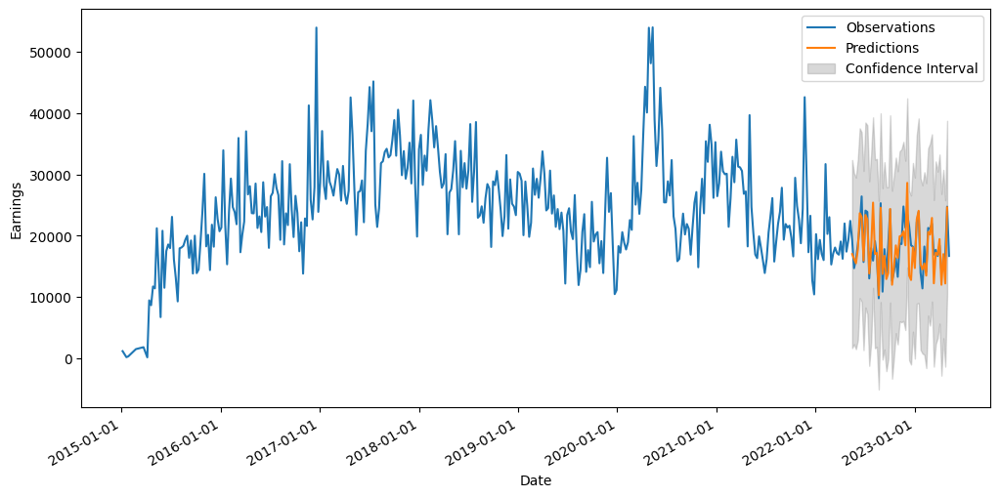

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np

# Convert predictions and confidence intervals to arrays
# predictions = np.array(predictions)
ci = li

# Create a figure and axis
fig, ax = plt.subplots(figsize=(12, 6))

# Plot all observations
ax.plot(df_pesca_m.index, df_pesca_m['Total'], label='Observations')

# Plot predictions for the last 52 weeks
ax.plot(df_pesca_m.index[-52:-1], predict_pesca_s["Total"][-51:], label='Predictions')

# Plot confidence intervals for the last 52 weeks
ax.fill_between(df_pesca_m.index[-52:-1], ci.iloc[-51:, 0], ci.iloc[-51:, 1], color='gray', alpha=0.3, label='Confidence Interval')

# Format the x-axis as dates
date_formatter = mdates.DateFormatter('%Y-%m-%d')
ax.xaxis.set_major_formatter(date_formatter)
plt.gcf().autofmt_xdate()

# Set labels and legend
plt.xlabel('Date')
plt.ylabel('Earnings')
plt.legend()

# Show the plot
plt.show()


Possible future scenarios with 1000 random solutions

In [ ]:
df_pesca_m.set_index('Date', inplace=True)

In [ ]:
import statsmodels.api as sm
model2=sm.tsa.ARIMA(df_pesca_m["Total"], order=(1,1,1))
model_fit2 = model2.fit()

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


In [ ]:
simulation=model_fit2.simulate(52,anchor='end',repetitions=1000)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


In [ ]:
ar_params = model_fit2.arparams
ma_params = model_fit2.maparams

# Extract the residuals from the fitted model
residuals = model_fit2.resid

# Estimate the variance of the residuals
residual_variance = np.var(residuals)

In [ ]:
num_periods=52
simulations=[]
for _ in range(1000):
    # Generate random errors based on the estimated variance
    errors = np.random.normal(loc=0, scale=np.sqrt(residual_variance), size=num_periods)

    # Generate simulated data for each scenario
    simulated_data = model_fit2.forecast(steps=num_periods).values + errors
    simulations.append(simulated_data)

# Create a pandas DataFrame for the simulated data
dates = pd.date_range(start='2023-01-01', periods=num_periods, freq='W')
simulations_df = pd.DataFrame(simulations, index=np.arange(1000), columns=dates)
mean_simulated_data = simulations_df.mean()


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa

Graphs

In [ ]:
# Iterate over all the columns of the dataframe
for column in simulation.columns:
    # Replace negative numbers with NaN in the current column
    simulation[column] = simulation[column].apply(lambda x: np.NaN if x < 0 else x)

In [ ]:
simulations_df1=simulations_df
# Iterate over all the columns of the dataframe
for column in simulations_df.columns:
    # Replace negative numbers with 0 in the current column
    simulations_df1[column] = simulations_df[column].apply(lambda x: 0 if x < 0 else x)

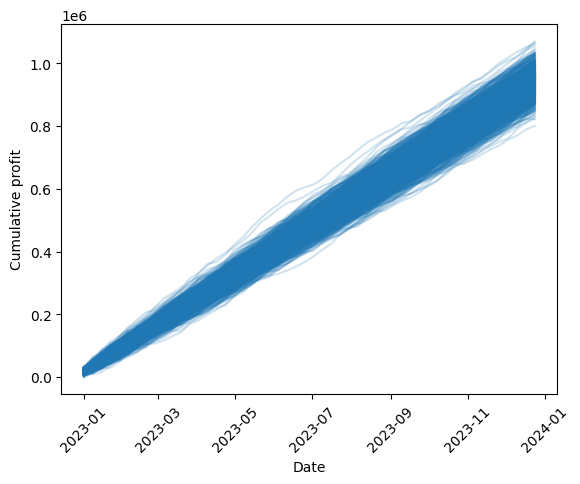

In [ ]:
# Calculation of cumulative earnings for each row
df_cumulative = simulations_df1.cumsum(axis=1)

# Plotting the cumulative earnings graph for each row
plt.plot(simulations_df1.columns, df_cumulative.transpose(), color="C0", alpha=0.2)
plt.xlabel('Date')
plt.ylabel('Cumulative profit')
plt.xticks(rotation=45)
plt.show()

In [ ]:
simulations_df2=simulations_df
# Iterate over all the columns of the dataframe
for column in simulations_df.columns:
    # Replace negative numbers with 0 in the current column
    simulations_df2[column] = simulations_df[column].apply(lambda x: np.NaN if x < 0 else x)

<ipython-input-91-82f1b22c8850>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(simulation.values.flatten(), shade=True)


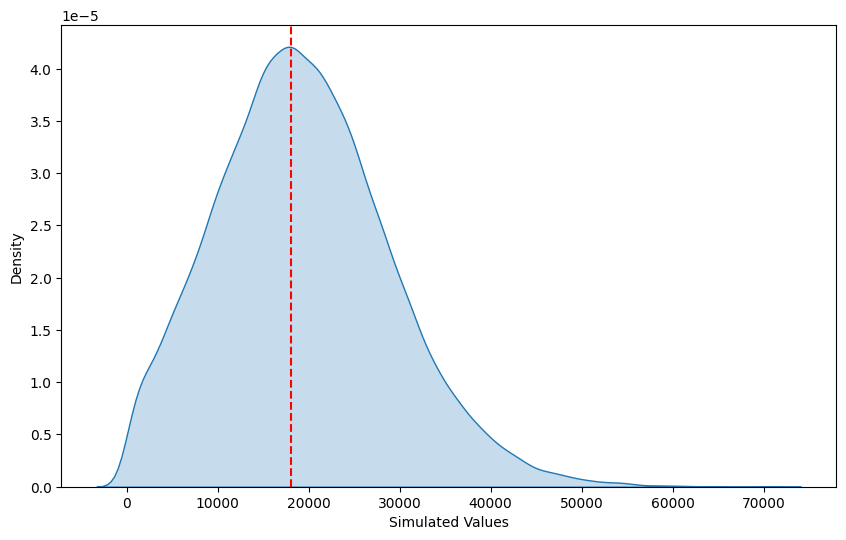

In [ ]:
import seaborn as sns
plt.figure(figsize=(10, 6))
sns.kdeplot(simulation.values.flatten(), shade=True)
plt.xlabel('Simulated Values')
plt.ylabel('Density')
mean_value = np.nanmean(simulations_df2.values.flatten())
plt.axvline(x=mean_value, color='red', linestyle='--', label='Mean Value')
plt.show()

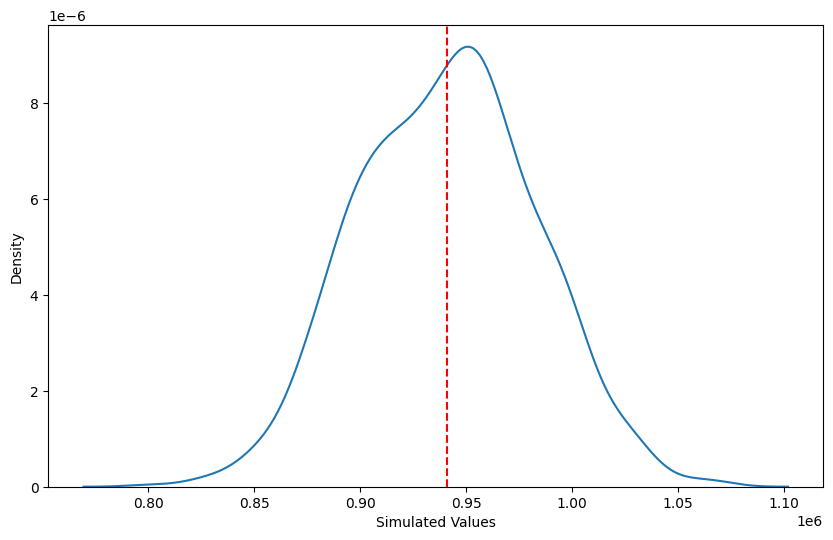

In [ ]:
last_period_values = df_cumulative.iloc[: , -1]
mean_value = last_period_values.mean()
plt.figure(figsize=(10, 6))
sns.kdeplot(last_period_values)
plt.xlabel('Simulated Values')
plt.ylabel('Density')
mean_value = np.mean(last_period_values.values.flatten())
plt.axvline(mean_value, color='red', linestyle='--', label='Mean')
plt.show()

# Sector Padel


In [ ]:
df_padel=df_clean.loc[df_clean["Sector"]=="Padel"]
df_padel=df_padel[["Date","Total", "Temperature_Nord", "Temperature_Center", "Temperature_Sud"]]

## Aggregare per mesi su 8 anni

In [ ]:
def function(dataSp, dataSpAnnoMese, dataSpTotalePerMese, dataSpMese):
    dataSp = dataSp.set_index('Date')
    dataSp.index = pd.to_datetime(dataSp.index)
    dataSpAnnoMese = dataSp.groupby([(dataSp.index.year), (dataSp.index.month)]).sum()
    dataSpTotalePerMese = dataSp.groupby([(dataSp.index.month)]).sum()
    dataSpMese = dataSp.groupby(pd.Grouper(freq="M")).sum()
    dataSpMese['year'] = [d.year for d in dataSpMese.index]
    dataSpMese['month'] = [d.strftime('%b') for d in dataSpMese.index]
    years = dataSpMese['year'].unique()
    np.random.seed(100)
    mycolors = ["blue",  "green" ,"black" , "cyan", "magenta", "lime", "red", "indigo", "royalblue", "brown"]
    plt.figure(figsize=(10, 8), dpi = 80)
    for i, y in enumerate(years):
        if i > 0:
            plt.plot('month', 'Total', data=dataSpMese.loc[dataSpMese.year==y, :], color=mycolors[i], label=y)
            plt.text(dataSpMese.loc[dataSpMese.year==y, :].shape[0]-.9, dataSpMese.loc[dataSpMese.year==y, 'Total'][-1:].values[0],
                     y, fontsize=12, color=mycolors[i])
    plt.gca().set(xlim=(-0.3, 11), ylabel='$Total(Millions-€)$', xlabel='$Month$')
    plt.yticks(fontsize=12, alpha=.7)
    plt.show()

    return dataSpAnnoMese, dataSpTotalePerMese, dataSpMese

In [ ]:
import matplotlib as mpl
def totaleAnno(dataSpAnno, dataSp, strSp):
    dataSp = dataSp.set_index('Date')
    dataSp.index = pd.to_datetime(dataSp.index)
    dataSpAnno = dataSp.groupby(pd.Grouper(freq="Y")).sum()
    dataSpAnno['year'] = [d.year for d in dataSpAnno.index]
    dataSpAnno['NumAnno'] = dataSpAnno.year.apply(lambda x: 0 if x==2015 else(1 if x==2016 else 2 if x==2017 else 3 if x==2018 else 4 if x==2019 else 5 if x==2020 else 6 if x==2021 else 7 if x==2022 else 8))
    dataSpAnno['Sector'] = strSp
    settori = dataSpAnno['Sector'].unique()
    np.random.seed(100)
    mycolors = np.random.choice(list(mpl.colors.XKCD_COLORS.keys()), len(settori), replace=False)

    plt.figure(figsize=(10, 8), dpi = 80)
    for i, y in enumerate(settori):
            plt.plot('NumAnno', 'Total', data=dataSpAnno.loc[dataSpAnno.Sector==y, :], color=mycolors[i], label=y)
            plt.text(dataSpAnno.loc[dataSpAnno.Sector==y, :].shape[0]-.9, dataSpAnno.loc[dataSpAnno.Sector==y, 'Total'][-1:].values[0],
                     y, fontsize=12, color=mycolors[i])

    plt.gca().set(xlim=(-0.3, 11), ylabel='$Total(Millions-€)$', xlabel='$Year$')
    plt.xticks([0, 1, 2, 3, 4, 5, 6, 7, 8], ['2015', '2016', '2017', '2018', '2019', '2020', '2021', '2022', "2023"])
    plt.yticks(fontsize=12, alpha=.7)
    plt.show()

    return dataSpAnno

In [ ]:
def totaleMese(dataSpTotalePerMese, dataSp, strSp):
  dataSp = dataSp.set_index('Date')
  dataSp.index = pd.to_datetime(dataSp.index)
  dataSp['month'] = [d.strftime('%b') for d in dataSp.index]
  dataSpTotalePerMese = dataSp
  dataSpTotalePerMese['month'] =  dataSpTotalePerMese.month.apply(lambda x: 1 if x=='Jan' else(2 if x=='Feb' else 3 if x=='Mar' else 4 if x=='Apr' else 5 if x=='May' else 6 if x=='Jun' else 7 if x=='Jul' else 8 if x=='Aug' else 9 if x=='Sep' else 10 if x=='Oct' else 11 if x=='Nov' else 12))
  dataSpTotalePerMese = dataSpTotalePerMese.groupby(pd.Grouper(key = 'month')).sum()
  dataSpTotalePerMese['Sector'] = strSp
  dataSpTotalePerMese = dataSpTotalePerMese.sort_values('month')
  dataSpTotalePerMese = dataSpTotalePerMese.reset_index()
  np.random.seed(100)
  mycolors = np.random.choice(list(mpl.colors.XKCD_COLORS.keys()), len(dataSpTotalePerMese['month']), replace=False)
  plt.figure(figsize=(10, 8), dpi = 80)
  for i, y in enumerate(dataSpTotalePerMese['Sector']):
          plt.plot('month', 'Total', data=dataSpTotalePerMese.loc[dataSpTotalePerMese.Sector==y, :], color=mycolors[i], label=y)
          plt.text(dataSpTotalePerMese.loc[dataSpTotalePerMese.Sector==y, :].shape[0]-.9, dataSpTotalePerMese.loc[dataSpTotalePerMese.Sector==y, 'Total'][-1:].values[0],
                  y, fontsize=12, color=mycolors[i])

  plt.gca().set(xlim=(-0.3, 12), ylabel='$Total(Millions-€)$', xlabel='$Month$')
  plt.xticks([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12], [' ', 'Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dic'])
  plt.yticks(fontsize=12, alpha=.7)
  plt.show()

  return dataSpTotalePerMese

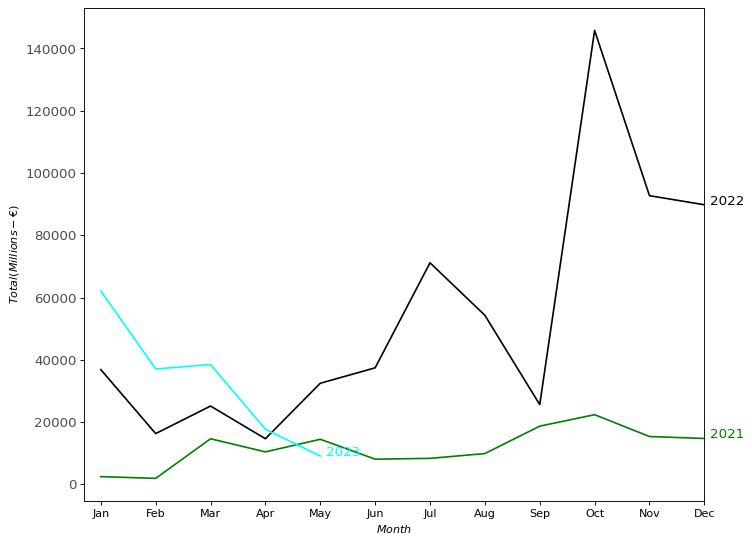

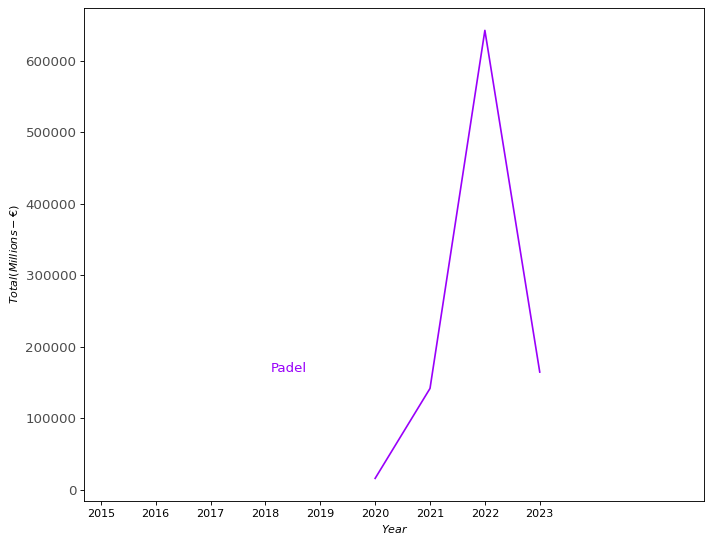

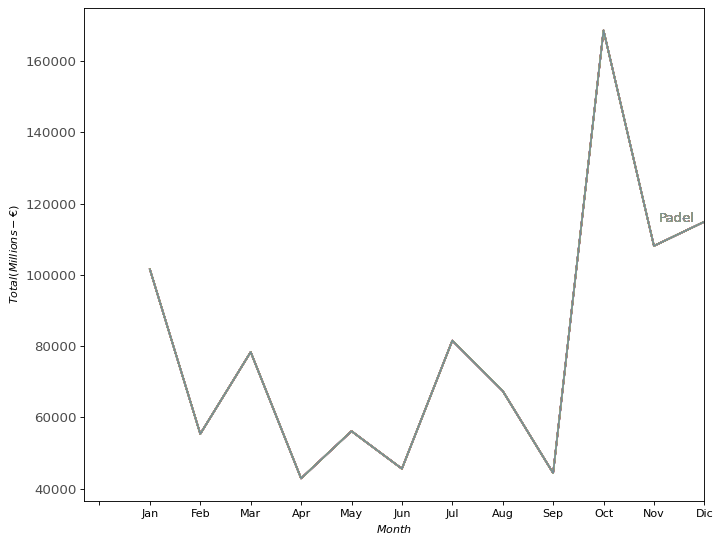

In [ ]:
dataPadelAnnoMese = df_padel
dataPadelTotalePerMese = df_padel
dataPadelMese = df_padel
dataPadelAnno = df_padel
strPadel = "Padel"
(dataPadelAnnoMese, dataPadelTotalePerMese, dataPadelMese) = function(df_padel, dataPadelAnnoMese, dataPadelTotalePerMese, dataPadelMese)
dataPadelAnno = totaleAnno(dataPadelAnno, df_padel, strPadel)
dataPadelTotalePerMese = totaleMese(dataPadelTotalePerMese, df_padel, strPadel)

In [ ]:
import pandas as pd

# Create the dataframe df_padel_m
df_padel_m = pd.DataFrame()

# Set the index on the 'Date' column
df_padel.set_index('Date', inplace=True)

# Calculate the sum for the "Total" column with weekly frequency
df_padel_m['Total'] = df_padel['Total'].resample('W').sum()

# Calculate the mean for the temperature columns with weekly frequency
df_padel_m['Temperature_Nord'] = df_padel['Temperature_Nord'].resample('W').mean()
df_padel_m['Temperature_Center'] = df_padel['Temperature_Center'].resample('W').mean()
df_padel_m['Temperature_Sud'] = df_padel['Temperature_Sud'].resample('W').mean()

# Remove rows with NaN values in the temperature columns
df_padel_m = df_padel_m.dropna(subset=['Temperature_Nord', 'Temperature_Center', 'Temperature_Sud'])

In [ ]:
df_padel_m=df_padel_m.round(2)

Smoothed graph with all observations

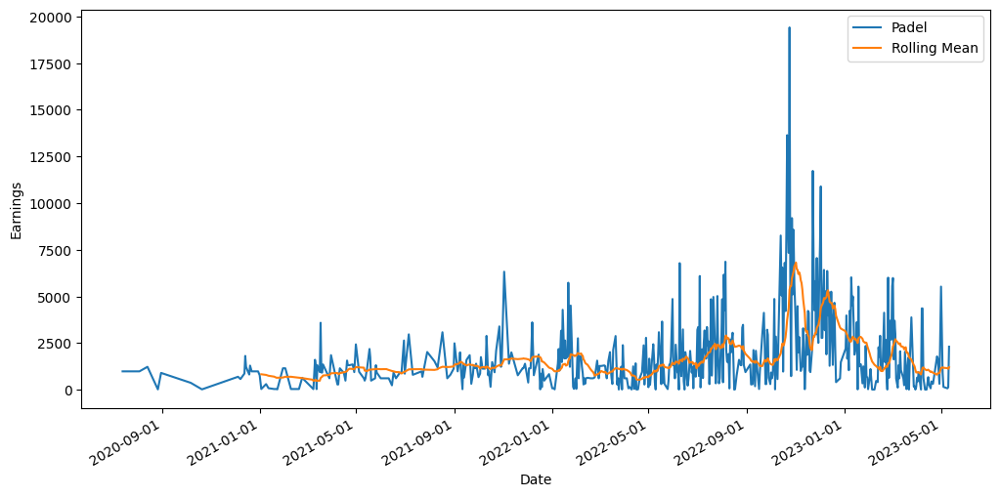

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

padel_noise = df_padel['Total'].rolling(20).mean()

# Create a figure and axis
fig, ax = plt.subplots(figsize=(12,6))

# Plot the data and rolling mean
ax.plot(df_padel.index, df_padel['Total'])
ax.plot(df_padel.index, padel_noise)

# Format the x-axis as dates
date_formatter = mdates.DateFormatter('%Y-%m-%d')
ax.xaxis.set_major_formatter(date_formatter)
plt.gcf().autofmt_xdate()

# Set labels and legend
plt.xlabel('Date')
plt.ylabel('Earnings')
plt.legend(['Padel','Rolling Mean'])
# Show the plot
plt.show()

Aggregate relaxed graph by weeks

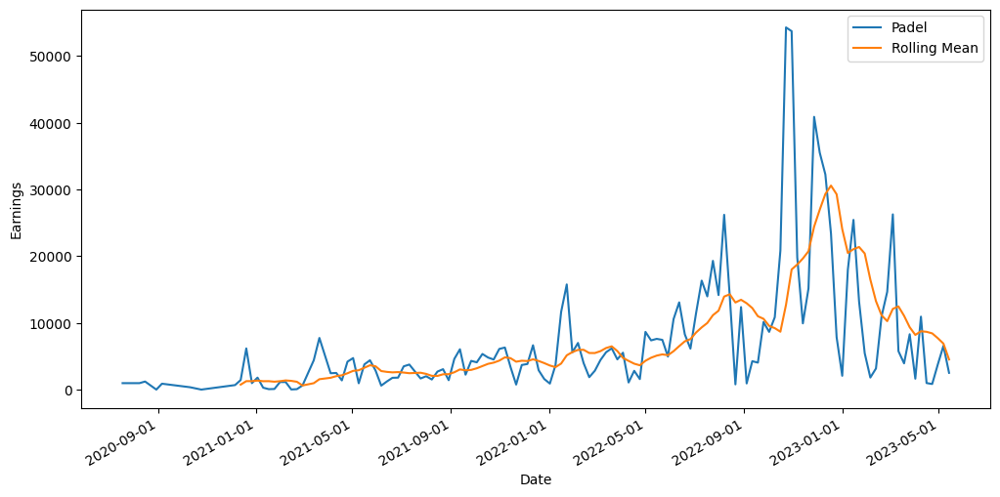

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

padel_noiseM = df_padel_m['Total'].rolling(10).mean()

# Create a figure and axis
fig, ax = plt.subplots(figsize=(12,6))

# Plot the data and rolling mean
ax.plot(df_padel_m.index, df_padel_m['Total'])
ax.plot(df_padel_m.index, padel_noiseM)

# Format the x-axis as dates
date_formatter = mdates.DateFormatter('%Y-%m-%d')
ax.xaxis.set_major_formatter(date_formatter)
plt.gcf().autofmt_xdate()

# Set labels and legend
plt.xlabel('Date')
plt.ylabel('Earnings')
plt.legend(['Padel','Rolling Mean'])
# Show the plot
plt.show()

Saving the dataset for analysis in R

In [ ]:
#df_padel_m=df_padel_m.reset_index()

In [ ]:
#df_padel_m.to_csv(filepath + 'df_padel.csv', index=False)

/usr/local/lib/python3.10/dist-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


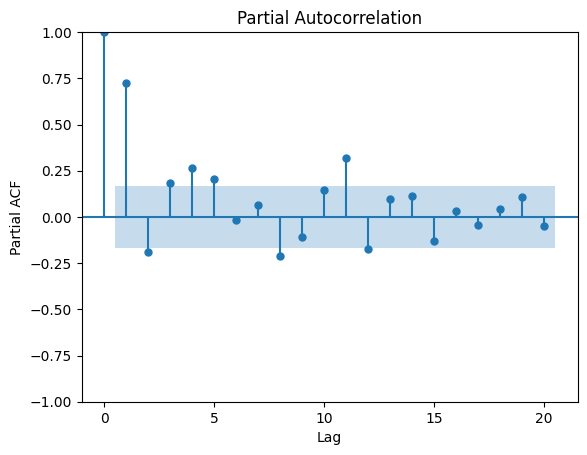

In [ ]:
from statsmodels.graphics.tsaplots import plot_pacf
plot_pacf(df_padel_m["Total"], lags=20)
plt.xlabel('Lag')
plt.ylabel('Partial ACF')
plt.show()

## Model for padel


ARIMAX MODEL

In [ ]:
#from pmdarima import auto_arima
#stepwise_fit = auto_arima(df_padel_m['Total'], trace=True,suppress_warnings=True)

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=2976.161, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3010.554, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3012.528, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3012.509, Time=0.05 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3008.558, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=2983.148, Time=0.15 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2978.544, Time=0.12 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=2977.620, Time=0.28 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=2978.485, Time=0.24 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=2984.625, Time=0.14 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=2978.555, Time=0.13 sec
 ARIMA(3,1,3)(0,0,0)[0] intercept   : AIC=2978.166, Time=0.99 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=2974.156, Time=0.35 sec
 ARIMA(1,1,2)(0,0,0)[0]             : 

#### Una settimana

ARIMA MODEL

In [ ]:
df_padel_m.index = pd.DatetimeIndex(df_padel_m.index).to_period('W')

In [ ]:
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Definisci la finestra temporale per la previsione
window_size = 2

# Esegui la previsione rolling
predictions = []
li=pd.DataFrame()
#df_padel_m = df_padel_m.asfreq('W')
exog_data = df_padel_m[["Temperature_Nord", "Temperature_Center", "Temperature_Sud"]].values  # Variabili esogene
for i in range(len(df_padel_m) - window_size):
    endog_data = df_padel_m["Total"].iloc[:i + window_size]
    exog_train_data = exog_data[:i + window_size]
    model = SARIMAX(endog=endog_data, exog=exog_train_data, order=(1, 0, 0), freq="W")  # Esempio di modello ARIMAX con ordine (1, 0, 0)
    model_fit_1 = model.fit()
    forecast = model_fit_1.forecast(steps=1, exog=exog_data[i + window_size].reshape(1, -1))  # Previsione per il prossimo step
    prova = model_fit_1.get_forecast(steps=1, exog=exog_data[i + window_size].reshape(1, -1), alpha=0.05).conf_int()
    predictions.append(forecast)
    li=li.append(prova)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-249-7a130a36543c>:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  li=li.append(prova)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning:

In [ ]:
df_padel_m.index = df_padel_m.index.to_timestamp()

In [ ]:
predict_padel=df_padel_m[2:].copy()
predict_padel["Total"]=predictions
predict_padel=predict_padel.shift(-1).dropna()

SARIMAX MODEL

In [ ]:
df_padel_m.index = pd.DatetimeIndex(df_padel_m.index).to_period('W')

In [ ]:
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Definisci la finestra temporale per la previsione
window_size = 2

# Esegui la previsione rolling
predictions = []
#df_padel_m = df_padel_m.asfreq('W')
exog_data = df_padel_m[["Temperature_Nord", "Temperature_Center", "Temperature_Sud"]].values  # Variabili esogene
for i in range(len(df_padel_m) - window_size):
    endog_data = df_padel_m["Total"].iloc[:i + window_size]
    exog_train_data = exog_data[:i + window_size]
    model = SARIMAX(endog=endog_data, exog=exog_train_data, order=(1, 0, 0), seasonal_order=(2, 0, 0, 13), freq="W", initialization='approximate_diffuse')
    model_fit_s1 = model.fit()
    forecast = model_fit_s1.forecast(steps=1, exog=exog_data[i + window_size].reshape(1, -1))  # Previsione per il prossimo step
    predictions.append(forecast)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be s

In [ ]:
df_padel_m.index = df_padel_m.index.to_timestamp()

In [ ]:
predict_padel_s=df_padel_m[2:].copy()
predict_padel_s["Total"]=predictions
predict_padel_s=predict_padel_s.shift(-1).dropna()

PROPHET MODEL

In [ ]:
df_padel_m=df_padel_m.reset_index()
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd
from prophet import Prophet

padel_prophet=pd.DataFrame(columns=["ds","yhat"])

# Create Prophet dataframe
df_prophet = df_padel_m[['Date', 'Total',"Temperature_Nord","Temperature_Center","Temperature_Sud"]].copy()
df_prophet.columns = ['ds', 'y',"Temperature_Nord","Temperature_Center","Temperature_Sud"]
#df_prophet["ds"] = pd.to_datetime(df_prophet["ds"].dt.to_timestamp())
df_prophet["ds"] = pd.to_datetime(df_prophet["ds"])


for i in range(2, len(df_padel_m) - 1):
    df_train = df_prophet[:i]
    df_test = df_prophet.iloc[[i + 1]]

    # Instantiate and fit Prophet model
    model_prophet = Prophet(interval_width=0.95)
    model_prophet.add_regressor("Temperature_Nord")
    model_prophet.add_regressor("Temperature_Center")
    model_prophet.add_regressor("Temperature_Sud")
    model_prophet.fit(df_train)

    # Make predictions for the next observation
    future = model_prophet.make_future_dataframe(periods=2, freq='W')
    future = future.iloc[-1:]  # Select the last row for prediction
    future["Temperature_Nord"] = df_test["Temperature_Nord"].values
    future["Temperature_Center"] = df_test["Temperature_Center"].values
    future["Temperature_Sud"] = df_test["Temperature_Sud"].values

    forecast = model_prophet.predict(future)
    prediction_row = forecast[["ds", "yhat"]].iloc[0]

    padel_prophet = padel_prophet.append(prediction_row, ignore_index=True)

padel_prophet['yhat']=padel_prophet['yhat'].shift(-1).dropna()
padel_prophet=padel_prophet.dropna()

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 0.
<ipython-input-256-3ea596c05684>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  padel_prophet = padel_prophet.append(prediction_row, ignore_index=True)
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 1.


In [ ]:
df_padel_m.set_index('Date', inplace=True)

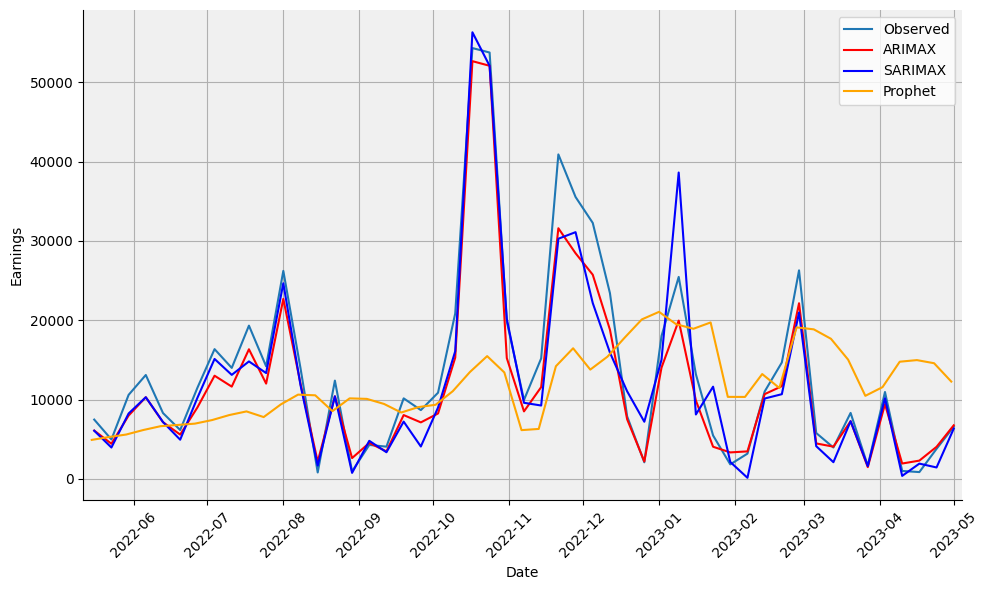

In [ ]:
import matplotlib.pyplot as plt

# Set the figure size to make the dates readable on the x-axis
plt.figure(figsize=(10, 6))

# Plot the graphs of predictions and actual values
plt.plot(df_padel_m["Total"][-52:-1], label='Observed')
plt.plot(predict_padel["Total"][-51:], color='red', label='ARIMAX')
plt.plot(predict_padel_s["Total"][-51:], color='blue', label='SARIMAX')
plt.plot(padel_prophet["ds"][-51:], padel_prophet["yhat"][-51:], color='orange', label='Prophet')

# Rotate the labels on the x-axis by 45 degrees to make them readable
plt.xticks(rotation=45)

# Add a legend
plt.legend()

# Set labels and title
plt.xlabel('Date')
plt.ylabel('Earnings')

# Add gridlines
plt.grid(True)

# Set a background color
plt.gca().set_facecolor('#f0f0f0')

# Remove the top and right spines
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

# Add a margin to the x-axis
plt.margins(x=0.01)

# Adjust the layout to avoid overlapping elements
plt.tight_layout()

# Show the graph
plt.show()


In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt
#df_calcio_m[2:].mean()
rmse_ARIMAX=sqrt(mean_squared_error(df_padel_m["Total"][-52:-1], predict_padel["Total"][-51:]))
rmse_SARIMAX=sqrt(mean_squared_error(df_padel_m["Total"][-52:-1], predict_padel_s["Total"][-51:]))
rmse_Prophet=sqrt(mean_squared_error(df_padel_m["Total"][-51:], padel_prophet[-51:].set_index("ds").loc[:, ["yhat"]]))
print(rmse_ARIMAX)
print(rmse_SARIMAX)
print(rmse_Prophet)

3014.9513579528875
3951.371689900354
13371.95417093792


In [ ]:
from sklearn.metrics import mean_absolute_percentage_error
error_ARIMAX = mean_absolute_percentage_error(df_padel_m["Total"][-52:-1], predict_padel["Total"][-51:])
error_SARIMAX = mean_absolute_percentage_error(df_padel_m["Total"][-52:-1], predict_padel_s["Total"][-51:])
error_Prophet = mean_absolute_percentage_error(df_padel_m["Total"][-51:], padel_prophet[-51:].set_index("ds").loc[:, ["yhat"]])
print(error_ARIMAX)
print(error_SARIMAX)
print(error_Prophet)

0.2753183573321383
0.3253587613647815
2.1219037319984806


#### Due settimane

ARIMA MODEL

In [ ]:
df_padel_m.index = pd.DatetimeIndex(df_padel_m.index).to_period('W')

In [ ]:
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Definisci la finestra temporale per la previsione
window_size = 3

# Esegui la previsione rolling
predictions = []
#df_padel_m = df_padel_m.asfreq('W')
exog_data = df_padel_m[["Temperature_Nord", "Temperature_Center", "Temperature_Sud"]].values  # Variabili esogene
for i in range(len(df_padel_m) - window_size):
    endog_data = df_padel_m["Total"].iloc[:i + window_size]
    exog_train_data = exog_data[:i + window_size]
    model = SARIMAX(endog=endog_data, exog=exog_train_data, order=(1, 0, 0), freq="W")  # Esempio di modello ARIMAX con ordine (1, 0, 0)
    model_fit_2 = model.fit()
    forecast = model_fit_2.forecast(steps=1, exog=exog_data[i + window_size].reshape(1, -1))  # Previsione per il prossimo step
    predictions.append(forecast)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarn

In [ ]:
df_padel_m.index = df_padel_m.index.to_timestamp()

In [ ]:
predict_padel=df_padel_m[3:].copy()
predict_padel["Total"]=predictions
predict_padel=predict_padel.shift(-1).dropna()

SARIMAX MODEL

In [ ]:
df_padel_m.index = pd.DatetimeIndex(df_padel_m.index).to_period('W')

In [ ]:
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Definisci la finestra temporale per la previsione
window_size = 3

# Esegui la previsione rolling
predictions = []
#df_padel_m = df_padel_m.asfreq('W')
exog_data = df_padel_m[["Temperature_Nord", "Temperature_Center", "Temperature_Sud"]].values  # Variabili esogene
for i in range(len(df_padel_m) - window_size):
    endog_data = df_padel_m["Total"].iloc[:i + window_size]
    exog_train_data = exog_data[:i + window_size]
    model = SARIMAX(endog=endog_data, exog=exog_train_data, order=(1, 0, 0), seasonal_order=(2, 0, 0, 13), freq="W", initialization='approximate_diffuse')
    model_fit_s2 = model.fit()
    forecast = model_fit_s2.forecast(steps=1, exog=exog_data[i + window_size].reshape(1, -1))  # Previsione per il prossimo step
    predictions.append(forecast)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. Al

In [ ]:
df_padel_m.index = df_padel_m.index.to_timestamp()

In [ ]:
predict_padel_s=df_padel_m[3:].copy()
predict_padel_s["Total"]=predictions
predict_padel_s=predict_padel_s.shift(-1).dropna()

PROPHET MODEL

In [ ]:
df_padel_m=df_padel_m.reset_index()
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd
from prophet import Prophet

padel_prophet=pd.DataFrame(columns=["ds","yhat"])

# Create Prophet dataframe
df_prophet = df_padel_m[['Date', 'Total',"Temperature_Nord","Temperature_Center","Temperature_Sud"]].copy()
df_prophet.columns = ['ds', 'y',"Temperature_Nord","Temperature_Center","Temperature_Sud"]
#df_prophet["ds"] = pd.to_datetime(df_prophet["ds"].dt.to_timestamp())
df_prophet["ds"] = pd.to_datetime(df_prophet["ds"])


for i in range(2, len(df_padel_m) - 2):
    df_train = df_prophet[:i]
    df_test = df_prophet.iloc[i + 1:i + 3]

    # Instantiate and fit Prophet model
    model_prophet = Prophet(interval_width=0.95)
    model_prophet.add_regressor("Temperature_Nord")
    model_prophet.add_regressor("Temperature_Center")
    model_prophet.add_regressor("Temperature_Sud")
    model_prophet.fit(df_train)

    # Make predictions for the next observation
    future = model_prophet.make_future_dataframe(periods=4, freq='W')
    future = future.iloc[-2:]  # Select the last row for prediction
    future["Temperature_Nord"] = df_test["Temperature_Nord"].values
    future["Temperature_Center"] = df_test["Temperature_Center"].values
    future["Temperature_Sud"] = df_test["Temperature_Sud"].values

    forecast = model_prophet.predict(future)
    prediction_row = forecast[["ds", "yhat"]].iloc[0]

    padel_prophet = padel_prophet.append(prediction_row, ignore_index=True)

padel_prophet['yhat']=padel_prophet['yhat'].shift(-1).dropna()
padel_prophet=padel_prophet.dropna()

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 0.
<ipython-input-269-bf9bfc10820d>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  padel_prophet = padel_prophet.append(prediction_row, ignore_index=True)
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 1.


In [ ]:
df_padel_m.set_index('Date', inplace=True)

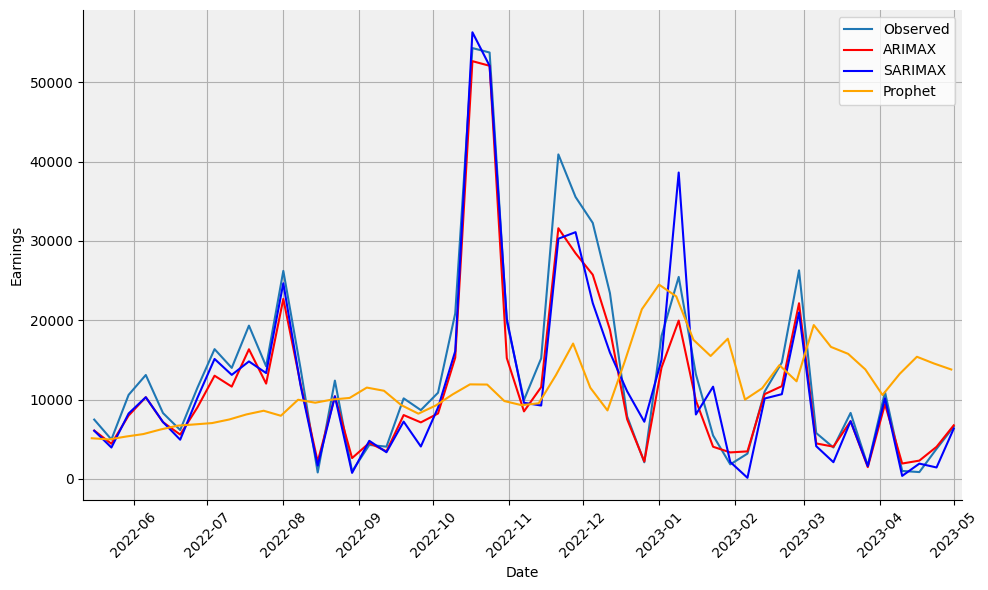

In [ ]:
import matplotlib.pyplot as plt

# Set the figure size to make the dates readable on the x-axis
plt.figure(figsize=(10, 6))

# Plot the graphs of predictions and actual values
plt.plot(df_padel_m["Total"][-52:-1], label='Observed')
plt.plot(predict_padel["Total"][-51:], color='red', label='ARIMAX')
plt.plot(predict_padel_s["Total"][-51:], color='blue', label='SARIMAX')
plt.plot(padel_prophet["ds"][-51:], padel_prophet["yhat"][-51:], color='orange', label='Prophet')

# Rotate the labels on the x-axis by 45 degrees to make them readable
plt.xticks(rotation=45)

# Add a legend
plt.legend()

# Set labels and title
plt.xlabel('Date')
plt.ylabel('Earnings')

# Add gridlines
plt.grid(True)

# Set a background color
plt.gca().set_facecolor('#f0f0f0')

# Remove the top and right spines
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

# Add a margin to the x-axis
plt.margins(x=0.01)

# Adjust the layout to avoid overlapping elements
plt.tight_layout()

# Show the graph
plt.show()


In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt
#df_padel_m[2:].mean()
rmse_ARIMAX=sqrt(mean_squared_error(df_padel_m["Total"][-52:-1], predict_padel["Total"][-51:]))
rmse_SARIMAX=sqrt(mean_squared_error(df_padel_m["Total"][-52:-1], predict_padel_s["Total"][-51:]))
rmse_Prophet=sqrt(mean_squared_error(df_padel_m["Total"][-52:-1], padel_prophet[-51:].set_index("ds").loc[:, ["yhat"]]))
print(rmse_ARIMAX)
print(rmse_SARIMAX)
print(rmse_Prophet)

3014.9513579528875
3951.371689900354
13082.470545940414


In [ ]:
from sklearn.metrics import mean_absolute_percentage_error
error_ARIMAX = mean_absolute_percentage_error(df_padel_m["Total"][-52:-1], predict_padel["Total"][-51:])
error_SARIMAX = mean_absolute_percentage_error(df_padel_m["Total"][-52:-1], predict_padel_s["Total"][-51:])
error_Prophet = mean_absolute_percentage_error(df_padel_m["Total"][-52:-1], padel_prophet[-51:].set_index("ds").loc[:, ["yhat"]])
print(error_ARIMAX)
print(error_SARIMAX)
print(error_Prophet)

0.2753183573321383
0.3253587613647815
2.076796003513342


#### Tre settimane

ARIMA MODEL

In [ ]:
df_padel_m.index = pd.DatetimeIndex(df_padel_m.index).to_period('W')

In [ ]:
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Definisci la finestra temporale per la previsione
window_size = 4

# Esegui la previsione rolling
predictions = []
#df_padel_m = df_padel_m.asfreq('W')
exog_data = df_padel_m[["Temperature_Nord", "Temperature_Center", "Temperature_Sud"]].values  # Variabili esogene
for i in range(len(df_padel_m) - window_size):
    endog_data = df_padel_m["Total"].iloc[:i + window_size]
    exog_train_data = exog_data[:i + window_size]
    model = SARIMAX(endog=endog_data, exog=exog_train_data, order=(1, 0, 0), freq="W")  # Esempio di modello ARIMAX con ordine (1, 0, 0)
    model_fit_3 = model.fit()
    forecast = model_fit_3.forecast(steps=1, exog=exog_data[i + window_size].reshape(1, -1))  # Previsione per il prossimo step
    predictions.append(forecast)


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood op

In [ ]:
df_padel_m.index = df_padel_m.index.to_timestamp()

In [ ]:
predict_padel=df_padel_m[4:].copy()
predict_padel["Total"]=predictions
predict_padel=predict_padel.shift(-1).dropna()

SARIMAX MODEL

In [ ]:
df_padel_m.index = pd.DatetimeIndex(df_padel_m.index).to_period('W')

In [ ]:
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Definisci la finestra temporale per la previsione
window_size = 4

# Esegui la previsione rolling
predictions = []
#df_padel_m = df_padel_m.asfreq('W')
exog_data = df_padel_m[["Temperature_Nord", "Temperature_Center", "Temperature_Sud"]].values  # Variabili esogene
for i in range(len(df_padel_m) - window_size):
    endog_data = df_padel_m["Total"].iloc[:i + window_size]
    exog_train_data = exog_data[:i + window_size]
    model = SARIMAX(endog=endog_data, exog=exog_train_data, order=(1, 0, 0), seasonal_order=(2, 0, 0, 13), freq="W", initialization='approximate_diffuse')
    model_fit_s3 = model.fit()
    forecast = model_fit_s3.forecast(steps=1, exog=exog_data[i + window_size].reshape(1, -1))  # Previsione per il prossimo step
    predictions.append(forecast)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimat

In [ ]:
df_padel_m.index = df_padel_m.index.to_timestamp()

In [ ]:
predict_padel_s=df_padel_m[4:].copy()
predict_padel_s["Total"]=predictions
predict_padel_s=predict_padel_s.shift(-1).dropna()

PROPHET MODEL

In [ ]:
df_padel_m=df_padel_m.reset_index()
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd
from prophet import Prophet

padel_prophet=pd.DataFrame(columns=["ds","yhat"])

# Create Prophet dataframe
df_prophet = df_padel_m[['Date', 'Total',"Temperature_Nord","Temperature_Center","Temperature_Sud"]].copy()
df_prophet.columns = ['ds', 'y',"Temperature_Nord","Temperature_Center","Temperature_Sud"]
#df_prophet["ds"] = pd.to_datetime(df_prophet["ds"].dt.to_timestamp())
df_prophet["ds"] = pd.to_datetime(df_prophet["ds"])


for i in range(2, len(df_padel_m) - 3):
    df_train = df_prophet[:i]
    df_test = df_prophet.iloc[i + 1:i + 4]

    # Instantiate and fit Prophet model
    model_prophet = Prophet(interval_width=0.95)
    model_prophet.add_regressor("Temperature_Nord")
    model_prophet.add_regressor("Temperature_Center")
    model_prophet.add_regressor("Temperature_Sud")
    model_prophet.fit(df_train)

    # Make predictions for the next observation
    future = model_prophet.make_future_dataframe(periods=6, freq='W')
    future = future.iloc[-3:]  # Select the last row for prediction
    future["Temperature_Nord"] = df_test["Temperature_Nord"].values
    future["Temperature_Center"] = df_test["Temperature_Center"].values
    future["Temperature_Sud"] = df_test["Temperature_Sud"].values

    forecast = model_prophet.predict(future)
    prediction_row = forecast[["ds", "yhat"]].iloc[0]

    padel_prophet = padel_prophet.append(prediction_row, ignore_index=True)

padel_prophet['yhat']=padel_prophet['yhat'].shift(-1).dropna()
padel_prophet=padel_prophet.dropna()

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 0.
<ipython-input-282-2b5c311be49f>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  padel_prophet = padel_prophet.append(prediction_row, ignore_index=True)
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 1.


In [ ]:
df_padel_m.set_index('Date', inplace=True)

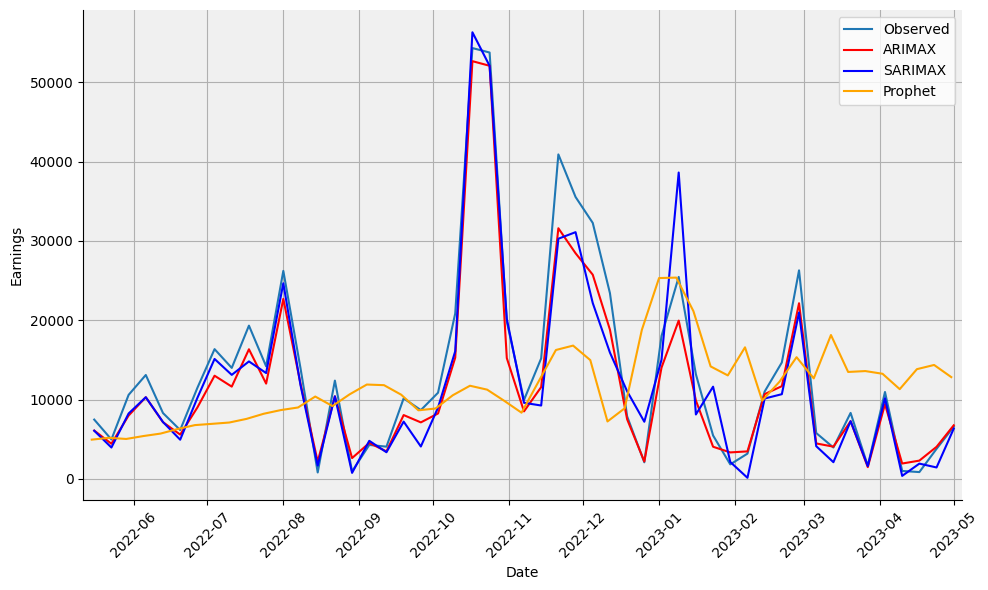

In [ ]:
import matplotlib.pyplot as plt

# Set the figure size to make the dates readable on the x-axis
plt.figure(figsize=(10, 6))

# Plot the graphs of predictions and actual values
plt.plot(df_padel_m["Total"][-52:-1], label='Observed')
plt.plot(predict_padel["Total"][-51:], color='red', label='ARIMAX')
plt.plot(predict_padel_s["Total"][-51:], color='blue', label='SARIMAX')
plt.plot(padel_prophet["ds"][-51:], padel_prophet["yhat"][-51:], color='orange', label='Prophet')

# Rotate the labels on the x-axis by 45 degrees to make them readable
plt.xticks(rotation=45)

# Add a legend
plt.legend()

# Set labels and title
plt.xlabel('Date')
plt.ylabel('Earnings')

# Add gridlines
plt.grid(True)

# Set a background color
plt.gca().set_facecolor('#f0f0f0')

# Remove the top and right spines
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

# Add a margin to the x-axis
plt.margins(x=0.01)

# Adjust the layout to avoid overlapping elements
plt.tight_layout()

# Show the graph
plt.show()


In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt
#df_padel_m[2:].mean()
rmse_ARIMAX=sqrt(mean_squared_error(df_padel_m["Total"][-52:-1], predict_padel["Total"][-51:]))
rmse_SARIMAX=sqrt(mean_squared_error(df_padel_m["Total"][-52:-1], predict_padel_s["Total"][-51:]))
rmse_Prophet=sqrt(mean_squared_error(df_padel_m["Total"][-52:-1], padel_prophet[-51:].set_index("ds").loc[:, ["yhat"]]))
print(rmse_ARIMAX)
print(rmse_SARIMAX)
print(rmse_Prophet)

3014.9513579528875
3951.371689900354
12672.162932885849


In [ ]:
from sklearn.metrics import mean_absolute_percentage_error
error_ARIMAX = mean_absolute_percentage_error(df_padel_m["Total"][-52:-1], predict_padel["Total"][-51:])
error_SARIMAX = mean_absolute_percentage_error(df_padel_m["Total"][-52:-1], predict_padel_s["Total"][-51:])
error_Prophet = mean_absolute_percentage_error(df_padel_m["Total"][-52:-1], padel_prophet[-51:].set_index("ds").loc[:, ["yhat"]])
print(error_ARIMAX)
print(error_SARIMAX)
print(error_Prophet)

0.2753183573321383
0.3253587613647815
1.9684976482732572


Possible future scenarios with confidence intervals

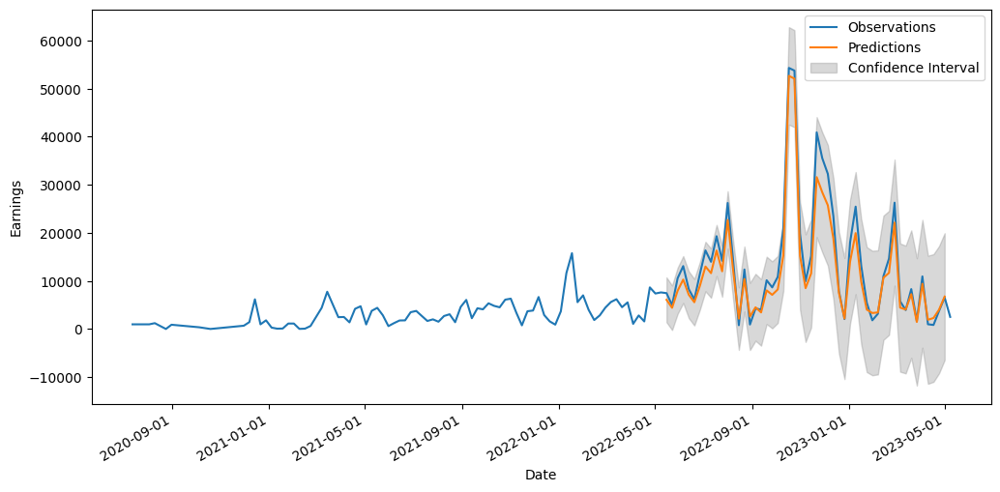

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np

# Convert predictions and confidence intervals to arrays

#ci = model_fit_1.get_forecast(steps=52, exog=exog_data[-52:].reshape(1, -1), alpha=0.05).conf_int()
ci=li
# Create a figure and axis
fig, ax = plt.subplots(figsize=(12, 6))

# Plot all observations
ax.plot(df_padel_m.index, df_padel_m['Total'], label='Observations')

# Plot predictions for the last 52 weeks
ax.plot(df_padel_m.index[-52:-1], predict_padel["Total"][-51:], label='Predictions')

# Plot confidence intervals for the last 52 weeks
ax.fill_between(df_padel_m.index[-52:-1], ci.iloc[-51:, 0], ci.iloc[-51:, 1], color='gray', alpha=0.3, label='Confidence Interval')

# Format the x-axis as dates
date_formatter = mdates.DateFormatter('%Y-%m-%d')
ax.xaxis.set_major_formatter(date_formatter)
plt.gcf().autofmt_xdate()

# Set labels and legend
plt.xlabel('Date')
plt.ylabel('Earnings')
plt.legend()

# Show the plot
plt.show()

Possible future scenarios with 1000 random solutions

In [ ]:
model2=sm.tsa.ARIMA(df_padel_m["Total"], order=(2,1,2))
model_fit2 = model2.fit()

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


In [ ]:
simulation=model_fit2.simulate(52,anchor='end',repetitions=1000)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


In [ ]:
ar_params = model_fit2.arparams
ma_params = model_fit2.maparams

# Extract the residuals from the fitted model
residuals = model_fit2.resid

# Estimate the variance of the residuals
residual_variance = np.var(residuals)

In [ ]:
num_periods=52
simulations=[]
for _ in range(1000):
    # Generate random errors based on the estimated variance
    errors = np.random.normal(loc=0, scale=np.sqrt(residual_variance), size=num_periods)

    # Generate simulated data for each scenario
    simulated_data = model_fit2.forecast(steps=num_periods).values + errors
    simulations.append(simulated_data)

# Create a pandas DataFrame for the simulated data
dates = pd.date_range(start='2023-01-01', periods=num_periods, freq='W')
simulations_df = pd.DataFrame(simulations, index=np.arange(1000), columns=dates)
mean_simulated_data = simulations_df.mean()


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa

Graphs

In [ ]:
# Iterate over all the columns of the dataframe
for column in simulation.columns:
    # Replace negative numbers with NaN in the current column
    simulation[column] = simulation[column].apply(lambda x: np.NaN if x < 0 else x)

In [ ]:
simulations_df1=simulations_df
# Iterate over all the columns of the dataframe
for column in simulations_df.columns:
    # Replace negative numbers with 0 in the current column
    simulations_df1[column] = simulations_df[column].apply(lambda x: 0 if x < 0 else x)

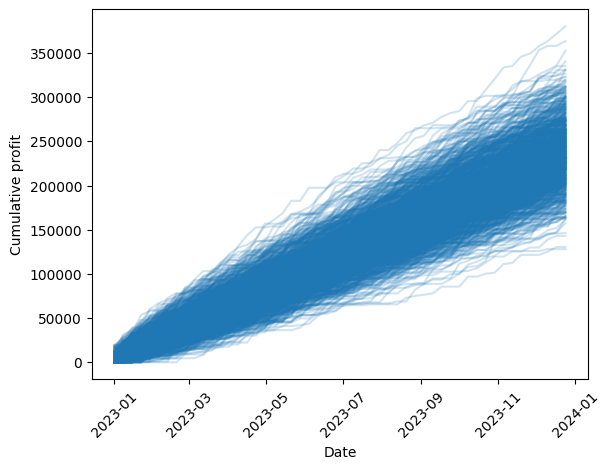

In [ ]:
# Calculation of cumulative earnings for each row
df_cumulative = simulations_df1.cumsum(axis=1)

# Plotting the cumulative earnings graph for each row
plt.plot(simulations_df1.columns, df_cumulative.transpose(), color="C0", alpha=0.2)
plt.xlabel('Date')
plt.ylabel('Cumulative profit')
plt.xticks(rotation=45)
plt.show()

In [ ]:
simulations_df2=simulations_df
# Iterate over all the columns of the dataframe
for column in simulations_df.columns:
    # Replace negative numbers with 0 in the current column
    simulations_df2[column] = simulations_df[column].apply(lambda x: np.NaN if x < 0 else x)

<ipython-input-228-82f1b22c8850>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(simulation.values.flatten(), shade=True)


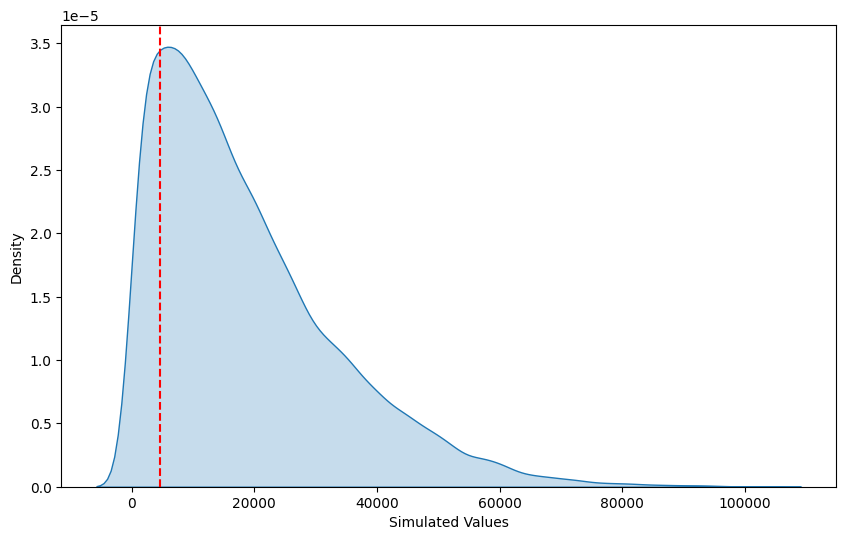

In [ ]:
import seaborn as sns
plt.figure(figsize=(10, 6))
sns.kdeplot(simulation.values.flatten(), shade=True)
plt.xlabel('Simulated Values')
plt.ylabel('Density')
mean_value = np.nanmean(simulations_df2.values.flatten())
plt.axvline(x=mean_value, color='red', linestyle='--', label='Mean Value')
plt.show()

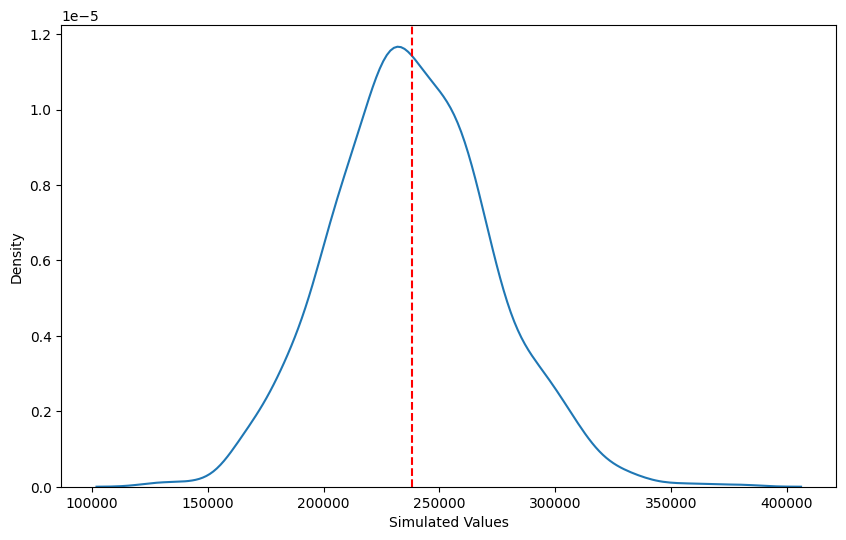

In [ ]:
last_period_values = df_cumulative.iloc[: , -1]
mean_value = last_period_values.mean()
plt.figure(figsize=(10, 6))
sns.kdeplot(last_period_values)
plt.xlabel('Simulated Values')
plt.ylabel('Density')
mean_value = np.mean(last_period_values.values.flatten())
plt.axvline(mean_value, color='red', linestyle='--', label='Mean')
plt.show()

# Sector Casual



In [ ]:
df_casual=df_clean.loc[df_clean["Sector"]=="Casual"]
df_casual=df_casual[["Date","Total", "Temperature_Nord", "Temperature_Center", "Temperature_Sud"]]

## Aggregare per mesi su 8 anni

In [ ]:
def function(dataSp, dataSpAnnoMese, dataSpTotalePerMese, dataSpMese):
    dataSp = dataSp.set_index('Date')
    dataSp.index = pd.to_datetime(dataSp.index)
    dataSpAnnoMese = dataSp.groupby([(dataSp.index.year), (dataSp.index.month)]).sum()
    dataSpTotalePerMese = dataSp.groupby([(dataSp.index.month)]).sum()
    dataSpMese = dataSp.groupby(pd.Grouper(freq="M")).sum()
    dataSpMese['year'] = [d.year for d in dataSpMese.index]
    dataSpMese['month'] = [d.strftime('%b') for d in dataSpMese.index]
    years = dataSpMese['year'].unique()
    np.random.seed(100)
    mycolors = ["blue",  "green" ,"black" , "cyan", "magenta", "lime", "red", "indigo", "royalblue", "brown"]
    plt.figure(figsize=(10, 8), dpi = 80)
    for i, y in enumerate(years):
        if i > 0:
            plt.plot('month', 'Total', data=dataSpMese.loc[dataSpMese.year==y, :], color=mycolors[i], label=y)
            plt.text(dataSpMese.loc[dataSpMese.year==y, :].shape[0]-.9, dataSpMese.loc[dataSpMese.year==y, 'Total'][-1:].values[0],
                     y, fontsize=12, color=mycolors[i])
    plt.gca().set(xlim=(-0.3, 11), ylabel='$Total(Millions-€)$', xlabel='$Month$')
    plt.yticks(fontsize=12, alpha=.7)
    plt.show()

    return dataSpAnnoMese, dataSpTotalePerMese, dataSpMese

In [ ]:
import matplotlib as mpl
def totaleAnno(dataSpAnno, dataSp, strSp):
    dataSp = dataSp.set_index('Date')
    dataSp.index = pd.to_datetime(dataSp.index)
    dataSpAnno = dataSp.groupby(pd.Grouper(freq="Y")).sum()
    dataSpAnno['year'] = [d.year for d in dataSpAnno.index]
    dataSpAnno['NumAnno'] = dataSpAnno.year.apply(lambda x: 0 if x==2015 else(1 if x==2016 else 2 if x==2017 else 3 if x==2018 else 4 if x==2019 else 5 if x==2020 else 6 if x==2021 else 7 if x==2022 else 8))
    dataSpAnno['Sector'] = strSp
    settori = dataSpAnno['Sector'].unique()
    np.random.seed(100)
    mycolors = np.random.choice(list(mpl.colors.XKCD_COLORS.keys()), len(settori), replace=False)

    plt.figure(figsize=(10, 8), dpi = 80)
    for i, y in enumerate(settori):
            plt.plot('NumAnno', 'Total', data=dataSpAnno.loc[dataSpAnno.Sector==y, :], color=mycolors[i], label=y)
            plt.text(dataSpAnno.loc[dataSpAnno.Sector==y, :].shape[0]-.9, dataSpAnno.loc[dataSpAnno.Sector==y, 'Total'][-1:].values[0],
                     y, fontsize=12, color=mycolors[i])

    plt.gca().set(xlim=(-0.3, 11), ylabel='$Total(Millions-€)$', xlabel='$Year$')
    plt.xticks([0, 1, 2, 3, 4, 5, 6, 7, 8], ['2015', '2016', '2017', '2018', '2019', '2020', '2021', '2022', "2023"])
    plt.yticks(fontsize=12, alpha=.7)
    plt.show()

    return dataSpAnno

In [ ]:
def totaleMese(dataSpTotalePerMese, dataSp, strSp):
  dataSp = dataSp.set_index('Date')
  dataSp.index = pd.to_datetime(dataSp.index)
  dataSp['month'] = [d.strftime('%b') for d in dataSp.index]
  dataSpTotalePerMese = dataSp
  dataSpTotalePerMese['month'] =  dataSpTotalePerMese.month.apply(lambda x: 1 if x=='Jan' else(2 if x=='Feb' else 3 if x=='Mar' else 4 if x=='Apr' else 5 if x=='May' else 6 if x=='Jun' else 7 if x=='Jul' else 8 if x=='Aug' else 9 if x=='Sep' else 10 if x=='Oct' else 11 if x=='Nov' else 12))
  dataSpTotalePerMese = dataSpTotalePerMese.groupby(pd.Grouper(key = 'month')).sum()
  dataSpTotalePerMese['Sector'] = strSp
  dataSpTotalePerMese = dataSpTotalePerMese.sort_values('month')
  dataSpTotalePerMese = dataSpTotalePerMese.reset_index()
  np.random.seed(100)
  mycolors = np.random.choice(list(mpl.colors.XKCD_COLORS.keys()), len(dataSpTotalePerMese['month']), replace=False)
  plt.figure(figsize=(10, 8), dpi = 80)
  for i, y in enumerate(dataSpTotalePerMese['Sector']):
          plt.plot('month', 'Total', data=dataSpTotalePerMese.loc[dataSpTotalePerMese.Sector==y, :], color=mycolors[i], label=y)
          plt.text(dataSpTotalePerMese.loc[dataSpTotalePerMese.Sector==y, :].shape[0]-.9, dataSpTotalePerMese.loc[dataSpTotalePerMese.Sector==y, 'Total'][-1:].values[0],
                  y, fontsize=12, color=mycolors[i])

  plt.gca().set(xlim=(-0.3, 12), ylabel='$Total(Millions-€)$', xlabel='$Month$')
  plt.xticks([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12], [' ', 'Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dic'])
  plt.yticks(fontsize=12, alpha=.7)
  plt.show()

  return dataSpTotalePerMese

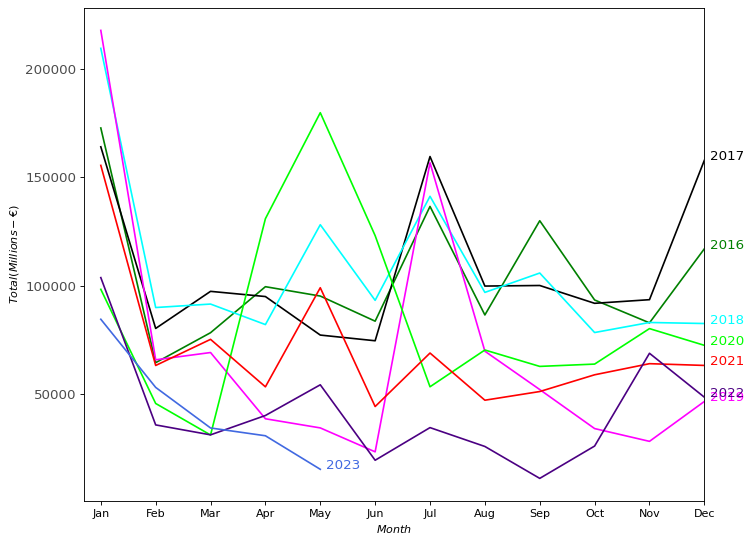

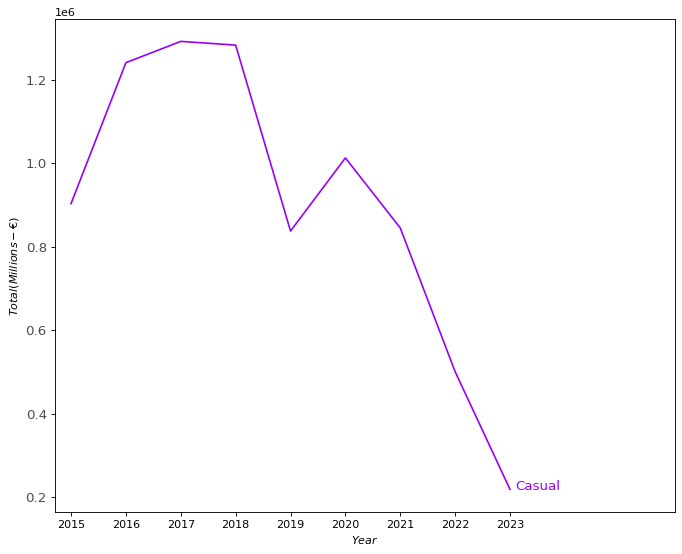

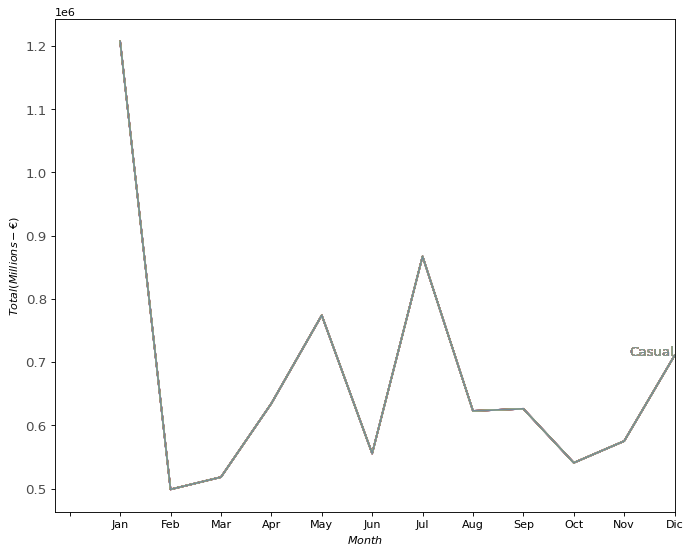

In [ ]:
dataCasualAnnoMese = df_casual
dataCasualTotalePerMese = df_casual
dataCasualMese = df_casual
dataCasualAnno = df_casual
strCasual = "Casual"
(dataCasualAnnoMese, dataCasualTotalePerMese, dataCasualMese) = function(df_casual, dataCasualAnnoMese, dataCasualTotalePerMese, dataCasualMese)
dataCasualAnno = totaleAnno(dataCasualAnno, df_casual, strCasual)
dataCasualTotalePerMese = totaleMese(dataCasualTotalePerMese, df_casual, strCasual)

In [ ]:
import pandas as pd

# Create the dataframe df_casual_m
df_casual_m = pd.DataFrame()

# Set the index on the 'Date' column
df_casual.set_index('Date', inplace=True)

# Calculate the sum for the "Total" column with weekly frequency
df_casual_m['Total'] = df_casual['Total'].resample('W').sum()

# Calculate the mean for the temperature columns with weekly frequency
df_casual_m['Temperature_Nord'] = df_casual['Temperature_Nord'].resample('W').mean()
df_casual_m['Temperature_Center'] = df_casual['Temperature_Center'].resample('W').mean()
df_casual_m['Temperature_Sud'] = df_casual['Temperature_Sud'].resample('W').mean()

# Remove rows with NaN values in the temperature columns
df_casual_m = df_casual_m.dropna(subset=['Temperature_Nord', 'Temperature_Center', 'Temperature_Sud'])

In [ ]:
df_casual_m=df_casual_m.round(2)

Smoothed graph with all observations

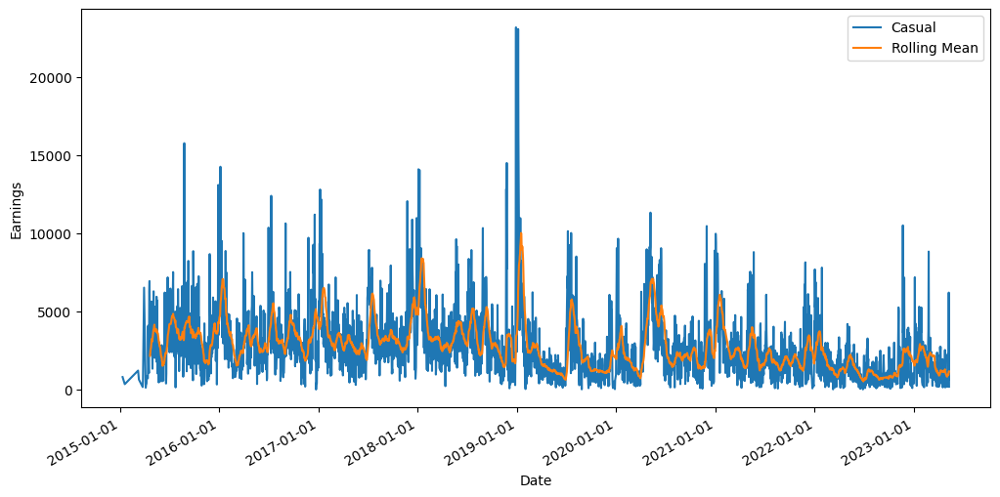

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

casual_noise = df_casual['Total'].rolling(20).mean()

# Create a figure and axis
fig, ax = plt.subplots(figsize=(12,6))

# Plot the data and rolling mean
ax.plot(df_casual.index, df_casual['Total'])
ax.plot(df_casual.index, casual_noise)

# Format the x-axis as dates
date_formatter = mdates.DateFormatter('%Y-%m-%d')
ax.xaxis.set_major_formatter(date_formatter)
plt.gcf().autofmt_xdate()

# Set labels and legend
plt.xlabel('Date')
plt.ylabel('Earnings')
plt.legend(['Casual','Rolling Mean'])
# Show the plot
plt.show()

Aggregate relaxed graph by weeks

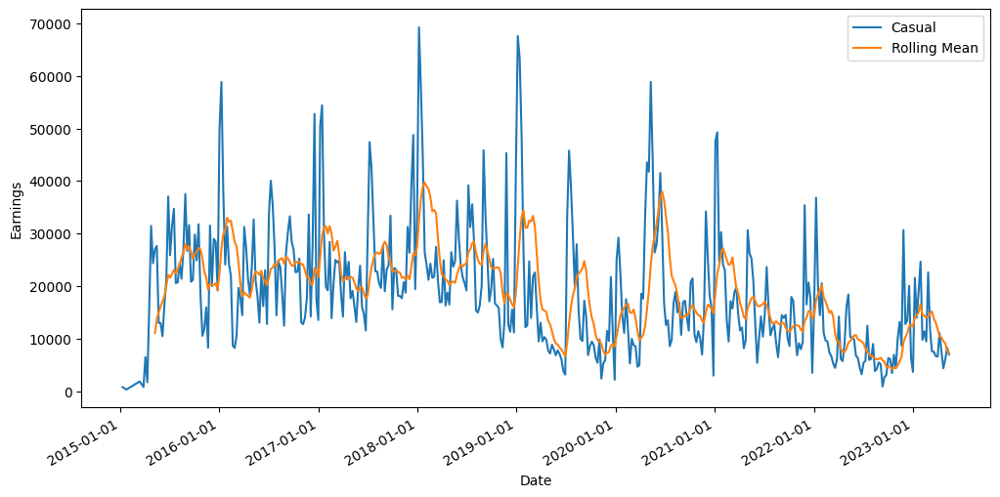

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

casual_noiseM = df_casual_m['Total'].rolling(10).mean()

# Create a figure and axis
fig, ax = plt.subplots(figsize=(12,6))

# Plot the data and rolling mean
ax.plot(df_casual_m.index, df_casual_m['Total'])
ax.plot(df_casual_m.index, casual_noiseM)

# Format the x-axis as dates
date_formatter = mdates.DateFormatter('%Y-%m-%d')
ax.xaxis.set_major_formatter(date_formatter)
plt.gcf().autofmt_xdate()

# Set labels and legend
plt.xlabel('Date')
plt.ylabel('Earnings')
plt.legend(['Casual','Rolling Mean'])
# Show the plot
plt.show()

Saving the dataset for analysis in R

In [ ]:
#df_casual_m=df_casual_m.reset_index()

In [ ]:
#df_casual_m.to_csv(filepath + 'df_casual.csv', index=False)

/usr/local/lib/python3.10/dist-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


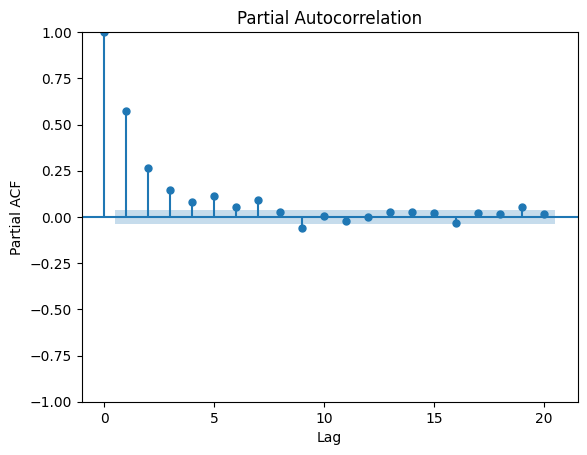

In [ ]:
from statsmodels.graphics.tsaplots import plot_pacf
plot_pacf(df_casual["Total"], lags=20)
plt.xlabel('Lag')
plt.ylabel('Partial ACF')
plt.show()

## Model for casual


ARIMA MODEL

In [ ]:
#from pmdarima import auto_arima
#stepwise_fit = auto_arima(df_casual_m['totale'], trace=True,suppress_warnings=True)

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=9135.187, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9215.979, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9210.658, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9200.863, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9213.981, Time=0.03 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9139.945, Time=0.19 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=9142.086, Time=0.67 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=9134.259, Time=1.48 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9138.104, Time=1.36 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept   : AIC=9137.905, Time=1.09 sec
 ARIMA(3,1,3)(0,0,0)[0] intercept   : AIC=9136.472, Time=0.59 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=9134.527, Time=0.90 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9136.515, Time=0.77 sec
 ARIMA(4,1,3)(0,0,0)[0] intercept   : AIC=9138.162, Time=0.74 sec
 ARIMA(3,1,2)(0,0,0)[0]          

#### Una settimana

ARIMA MODEL

In [ ]:
df_casual_m.index = pd.DatetimeIndex(df_casual_m.index).to_period('W')

In [ ]:
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Definisci la finestra temporale per la previsione
window_size = 2

# Esegui la previsione rolling
predictions = []
#df_casual_m = df_casual_m.asfreq('W')
exog_data = df_casual_m[["Temperature_Nord", "Temperature_Center", "Temperature_Sud"]].values  # Variabili esogene
for i in range(len(df_casual_m) - window_size):
    endog_data = df_casual_m["Total"].iloc[:i + window_size]
    exog_train_data = exog_data[:i + window_size]
    model = SARIMAX(endog=endog_data, exog=exog_train_data, order=(1, 0, 0), freq="W")  # Esempio di modello ARIMAX con ordine (1, 0, 0)
    model_fit_1 = model.fit()
    forecast = model_fit_1.forecast(steps=1, exog=exog_data[i + window_size].reshape(1, -1))  # Previsione per il prossimo step
    predictions.append(forecast)


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood op

In [ ]:
df_casual_m.index = df_casual_m.index.to_timestamp()

In [ ]:
predict_casual=df_casual_m[2:].copy()
predict_casual["Total"]=predictions
predict_casual=predict_casual.shift(-1).dropna()

SARIMAX MODEL

In [ ]:
df_casual_m.index = pd.DatetimeIndex(df_casual_m.index).to_period('W')

In [ ]:
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Definisci la finestra temporale per la previsione
window_size = 2

# Esegui la previsione rolling
predictions = []
#df_casual_m = df_casual_m.asfreq('W')
exog_data = df_casual_m[["Temperature_Nord", "Temperature_Center", "Temperature_Sud"]].values  # Variabili esogene
for i in range(len(df_casual_m) - window_size):
    endog_data = df_casual_m["Total"].iloc[:i + window_size]
    exog_train_data = exog_data[:i + window_size]
    model = SARIMAX(endog=endog_data, exog=exog_train_data, order=(1, 0, 0), seasonal_order=(2, 0, 0, 13), freq="W", initialization='approximate_diffuse')
    model_fit_s1 = model.fit()
    forecast = model_fit_s1.forecast(steps=1, exog=exog_data[i + window_size].reshape(1, -1))  # Previsione per il prossimo step
    predictions.append(forecast)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimat

In [ ]:
df_casual_m.index = df_casual_m.index.to_timestamp()

In [ ]:
predict_casual_s=df_casual_m[2:].copy()
predict_casual_s["Total"]=predictions
predict_casual_s=predict_casual_s.shift(-1).dropna()

PROPHET MODEL

In [ ]:
df_casual_m=df_casual_m.reset_index()
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd
from prophet import Prophet

casual_prophet=pd.DataFrame(columns=["ds","yhat"])

# Create Prophet dataframe
df_prophet = df_casual_m[['Date', 'Total',"Temperature_Nord","Temperature_Center","Temperature_Sud"]].copy()
df_prophet.columns = ['ds', 'y',"Temperature_Nord","Temperature_Center","Temperature_Sud"]
#df_prophet["ds"] = pd.to_datetime(df_prophet["ds"].dt.to_timestamp())
df_prophet["ds"] = pd.to_datetime(df_prophet["ds"])


for i in range(2, len(df_casual_m) - 1):
    df_train = df_prophet[:i]
    df_test = df_prophet.iloc[[i + 1]]

    # Instantiate and fit Prophet model
    model_prophet = Prophet(interval_width=0.95)
    model_prophet.add_regressor("Temperature_Nord")
    model_prophet.add_regressor("Temperature_Center")
    model_prophet.add_regressor("Temperature_Sud")
    model_prophet.fit(df_train)

    # Make predictions for the next observation
    future = model_prophet.make_future_dataframe(periods=2, freq='W')
    future = future.iloc[-1:]  # Select the last row for prediction
    future["Temperature_Nord"] = df_test["Temperature_Nord"].values
    future["Temperature_Center"] = df_test["Temperature_Center"].values
    future["Temperature_Sud"] = df_test["Temperature_Sud"].values

    forecast = model_prophet.predict(future)
    prediction_row = forecast[["ds", "yhat"]].iloc[0]

    casual_prophet = casual_prophet.append(prediction_row, ignore_index=True)

casual_prophet['yhat']=casual_prophet['yhat'].shift(-1).dropna()
casual_prophet=casual_prophet.dropna()

Streaming output truncated to the last 5000 lines.
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=61776', 'data', 'file=/tmp/tmp_onldwd1/iya4j7i3.json', 'init=/tmp/tmp_onldwd1/8pyeb4y5.json', 'output', 'file=/tmp/tmp_onldwd1/prophet_modelzc_epixq/prophet_model-20230702174103.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:41:03 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:41:04 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
<ipython-input-301-a877ea4a07de>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  casual_prophet = casual_prophet.append(prediction_row, ignore_index=True)
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_sea

In [ ]:
df_casual_m.set_index('Date', inplace=True)

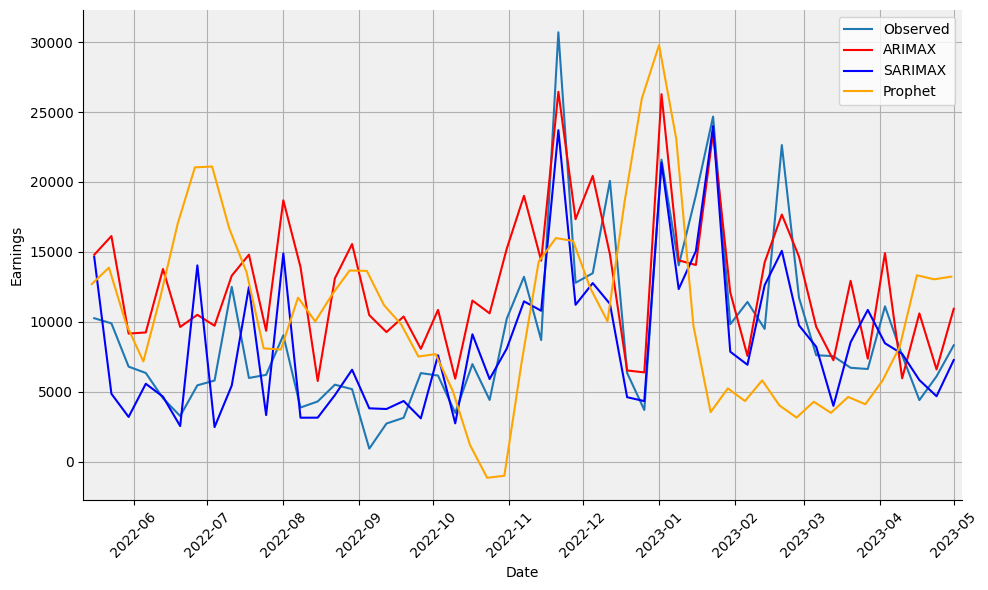

In [ ]:
import matplotlib.pyplot as plt

# Set the figure size to make the dates readable on the x-axis
plt.figure(figsize=(10, 6))

# Plot the graphs of predictions and actual values
plt.plot(df_casual_m["Total"][-52:-1], label='Observed')
plt.plot(predict_casual["Total"][-51:], color='red', label='ARIMAX')
plt.plot(predict_casual_s["Total"][-51:], color='blue', label='SARIMAX')
plt.plot(casual_prophet["ds"][-51:], casual_prophet["yhat"][-51:], color='orange', label='Prophet')

# Rotate the labels on the x-axis by 45 degrees to make them readable
plt.xticks(rotation=45)

# Add a legend
plt.legend()

# Set labels and title
plt.xlabel('Date')
plt.ylabel('Earnings')

# Add gridlines
plt.grid(True)

# Set a background color
plt.gca().set_facecolor('#f0f0f0')

# Remove the top and right spines
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

# Add a margin to the x-axis
plt.margins(x=0.01)

# Adjust the layout to avoid overlapping elements
plt.tight_layout()

# Show the graph
plt.show()


In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt
#df_casual_m[2:].mean()
rmse_ARIMAX=sqrt(mean_squared_error(df_casual_m["Total"][-52:-1], predict_casual["Total"][-51:]))
rmse_SARIMAX=sqrt(mean_squared_error(df_casual_m["Total"][-52:-1], predict_casual_s["Total"][-51:]))
rmse_Prophet=sqrt(mean_squared_error(df_casual_m["Total"][-52:-1], casual_prophet[-51:].set_index("ds").loc[:, ["yhat"]]))
print(rmse_ARIMAX)
print(rmse_SARIMAX)
print(rmse_Prophet)

5254.448918838834
3479.895733991798
8810.723807316077


In [ ]:
from sklearn.metrics import mean_absolute_percentage_error
error_ARIMAX = mean_absolute_percentage_error(df_casual_m["Total"][-52:-1], predict_casual["Total"][-51:])
error_SARIMAX = mean_absolute_percentage_error(df_casual_m["Total"][-52:-1], predict_casual_s["Total"][-51:])
error_Prophet = mean_absolute_percentage_error(df_casual_m["Total"][-52:-1], casual_prophet[-51:].set_index("ds").loc[:, ["yhat"]])
print(error_ARIMAX)
print(error_SARIMAX)
print(error_Prophet)

0.8782806229801411
0.3733538058618066
1.2759003595231406


#### Due settimane

ARIMA MODEL

In [ ]:
df_casual_m.index = pd.DatetimeIndex(df_casual_m.index).to_period('W')

In [ ]:
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Definisci la finestra temporale per la previsione
window_size = 3

# Esegui la previsione rolling
predictions = []
#df_casual_m = df_casual_m.asfreq('W')
exog_data = df_casual_m[["Temperature_Nord", "Temperature_Center", "Temperature_Sud"]].values  # Variabili esogene
for i in range(len(df_casual_m) - window_size):
    endog_data = df_casual_m["Total"].iloc[:i + window_size]
    exog_train_data = exog_data[:i + window_size]
    model = SARIMAX(endog=endog_data, exog=exog_train_data, order=(1, 0, 0), freq="W")  # Esempio di modello ARIMAX con ordine (1, 0, 0)
    model_fit_2 = model.fit()
    forecast = model_fit_2.forecast(steps=1, exog=exog_data[i + window_size].reshape(1, -1))  # Previsione per il prossimo step
    predictions.append(forecast)


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood op

In [ ]:
df_casual_m.index = df_casual_m.index.to_timestamp()

In [ ]:
predict_casual=df_casual_m[3:].copy()
predict_casual["Total"]=predictions
predict_casual=predict_casual.shift(-1).dropna()

SARIMAX MODEL

In [ ]:
df_casual_m.index = pd.DatetimeIndex(df_casual_m.index).to_period('W')

In [ ]:
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Definisci la finestra temporale per la previsione
window_size = 3

# Esegui la previsione rolling
predictions = []
#df_casual_m = df_casual_m.asfreq('W')
exog_data = df_casual_m[["Temperature_Nord", "Temperature_Center", "Temperature_Sud"]].values  # Variabili esogene
for i in range(len(df_casual_m) - window_size):
    endog_data = df_casual_m["Total"].iloc[:i + window_size]
    exog_train_data = exog_data[:i + window_size]
    model = SARIMAX(endog=endog_data, exog=exog_train_data, order=(1, 0, 0), seasonal_order=(2, 0, 0, 13), freq="W", initialization='approximate_diffuse')
    model_fit_s2 = model.fit()
    forecast = model_fit_s2.forecast(steps=1, exog=exog_data[i + window_size].reshape(1, -1))  # Previsione per il prossimo step
    predictions.append(forecast)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimat

In [ ]:
df_casual_m.index = df_casual_m.index.to_timestamp()

In [ ]:
predict_casual_s=df_casual_m[3:].copy()
predict_casual_s["Total"]=predictions
predict_casual_s=predict_casual_s.shift(-1).dropna()

PROPHET MODEL

In [ ]:
df_casual_m=df_casual_m.reset_index()
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd
from prophet import Prophet

casual_prophet=pd.DataFrame(columns=["ds","yhat"])

# Create Prophet dataframe
df_prophet = df_casual_m[['Date', 'Total',"Temperature_Nord","Temperature_Center","Temperature_Sud"]].copy()
df_prophet.columns = ['ds', 'y',"Temperature_Nord","Temperature_Center","Temperature_Sud"]
#df_prophet["ds"] = pd.to_datetime(df_prophet["ds"].dt.to_timestamp())
df_prophet["ds"] = pd.to_datetime(df_prophet["ds"])


for i in range(2, len(df_casual_m) - 2):
    df_train = df_prophet[:i]
    df_test = df_prophet.iloc[i + 1:i + 3]

    # Instantiate and fit Prophet model
    model_prophet = Prophet(interval_width=0.95)
    model_prophet.add_regressor("Temperature_Nord")
    model_prophet.add_regressor("Temperature_Center")
    model_prophet.add_regressor("Temperature_Sud")
    model_prophet.fit(df_train)

    # Make predictions for the next observation
    future = model_prophet.make_future_dataframe(periods=4, freq='W')
    future = future.iloc[-2:]  # Select the last row for prediction
    future["Temperature_Nord"] = df_test["Temperature_Nord"].values
    future["Temperature_Center"] = df_test["Temperature_Center"].values
    future["Temperature_Sud"] = df_test["Temperature_Sud"].values

    forecast = model_prophet.predict(future)
    prediction_row = forecast[["ds", "yhat"]].iloc[0]

    casual_prophet = casual_prophet.append(prediction_row, ignore_index=True)

casual_prophet['yhat']=casual_prophet['yhat'].shift(-1).dropna()
casual_prophet=casual_prophet.dropna()

Streaming output truncated to the last 5000 lines.
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=29348', 'data', 'file=/tmp/tmp_onldwd1/7j6e4tbu.json', 'init=/tmp/tmp_onldwd1/r1x6p2ga.json', 'output', 'file=/tmp/tmp_onldwd1/prophet_modell3agjj_q/prophet_model-20230702175638.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
17:56:38 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:56:38 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
<ipython-input-314-e1e8a2f55c0f>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  casual_prophet = casual_prophet.append(prediction_row, ignore_index=True)
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to overr

In [ ]:
df_casual_m.set_index('Date', inplace=True)

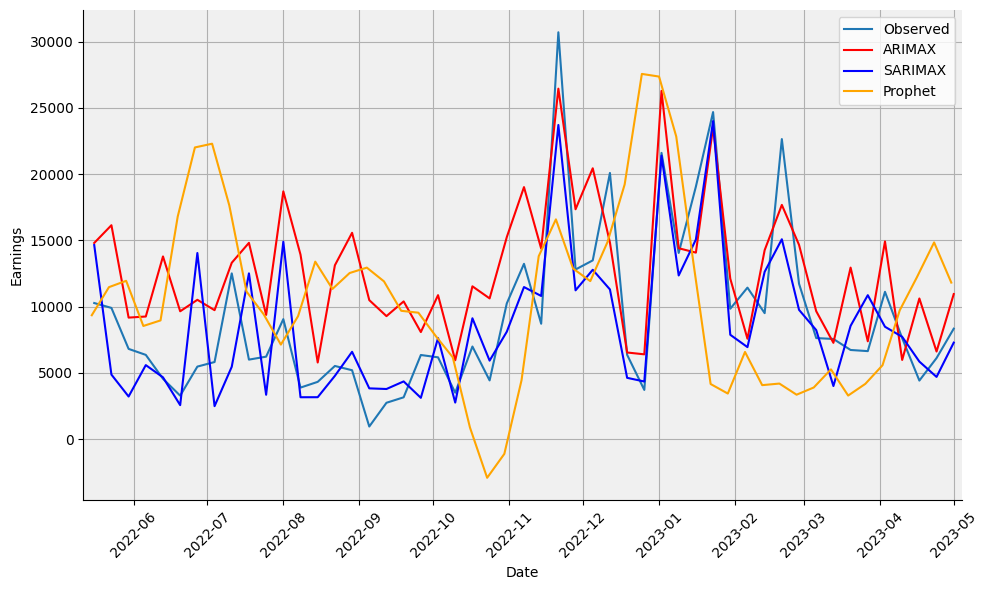

In [ ]:
import matplotlib.pyplot as plt

# Set the figure size to make the dates readable on the x-axis
plt.figure(figsize=(10, 6))

# Plot the graphs of predictions and actual values
plt.plot(df_casual_m["Total"][-52:-1], label='Observed')
plt.plot(predict_casual["Total"][-51:], color='red', label='ARIMAX')
plt.plot(predict_casual_s["Total"][-51:], color='blue', label='SARIMAX')
plt.plot(casual_prophet["ds"][-51:], casual_prophet["yhat"][-51:], color='orange', label='Prophet')

# Rotate the labels on the x-axis by 45 degrees to make them readable
plt.xticks(rotation=45)

# Add a legend
plt.legend()

# Set labels and title
plt.xlabel('Date')
plt.ylabel('Earnings')

# Add gridlines
plt.grid(True)

# Set a background color
plt.gca().set_facecolor('#f0f0f0')

# Remove the top and right spines
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

# Add a margin to the x-axis
plt.margins(x=0.01)

# Adjust the layout to avoid overlapping elements
plt.tight_layout()

# Show the graph
plt.show()


In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt
#df_casual_m[2:].mean()
rmse_ARIMAX=sqrt(mean_squared_error(df_casual_m["Total"][-52:-1], predict_casual["Total"][-51:]))
rmse_SARIMAX=sqrt(mean_squared_error(df_casual_m["Total"][-52:-1], predict_casual_s["Total"][-51:]))
rmse_Prophet=sqrt(mean_squared_error(df_casual_m["Total"][-52:-1], casual_prophet[-51:].set_index("ds").loc[:, ["yhat"]]))
print(rmse_ARIMAX)
print(rmse_SARIMAX)
print(rmse_Prophet)

5254.448918838834
3479.895733991798
8761.31576381997


In [ ]:
from sklearn.metrics import mean_absolute_percentage_error
error_ARIMAX = mean_absolute_percentage_error(df_casual_m["Total"][-52:-1], predict_casual["Total"][-51:])
error_SARIMAX = mean_absolute_percentage_error(df_casual_m["Total"][-52:-1], predict_casual_s["Total"][-51:])
error_Prophet = mean_absolute_percentage_error(df_casual_m["Total"][-52:-1], casual_prophet[-51:].set_index("ds").loc[:, ["yhat"]])
print(error_ARIMAX)
print(error_SARIMAX)
print(error_Prophet)

0.8782806229801411
0.3733538058618066
1.2813087476687544


#### Tre settimane

ARIMA MODEL

In [ ]:
df_casual_m.index = pd.DatetimeIndex(df_casual_m.index).to_period('W')

In [ ]:
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Definisci la finestra temporale per la previsione
window_size = 4

# Esegui la previsione rolling
predictions = []
#df_casual_m = df_casual_m.asfreq('W')
exog_data = df_casual_m[["Temperature_Nord", "Temperature_Center", "Temperature_Sud"]].values  # Variabili esogene
for i in range(len(df_casual_m) - window_size):
    endog_data = df_casual_m["Total"].iloc[:i + window_size]
    exog_train_data = exog_data[:i + window_size]
    model = SARIMAX(endog=endog_data, exog=exog_train_data, order=(1, 0, 0), freq="W")  # Esempio di modello ARIMAX con ordine (1, 0, 0)
    model_fit_3 = model.fit()
    forecast = model_fit_3.forecast(steps=1, exog=exog_data[i + window_size].reshape(1, -1))  # Previsione per il prossimo step
    predictions.append(forecast)


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood op

In [ ]:
df_casual_m.index = df_casual_m.index.to_timestamp()

In [ ]:
predict_casual=df_casual_m[4:].copy()
predict_casual["Total"]=predictions
predict_casual=predict_casual.shift(-1).dropna()

SARIMAX MODEL

In [ ]:
df_casual_m.index = pd.DatetimeIndex(df_casual_m.index).to_period('W')

In [ ]:
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Definisci la finestra temporale per la previsione
window_size = 4

# Esegui la previsione rolling
predictions = []
li=pd.DataFrame()
#df_casual_m = df_casual_m.asfreq('W')
exog_data = df_casual_m[["Temperature_Nord", "Temperature_Center", "Temperature_Sud"]].values  # Variabili esogene
for i in range(len(df_casual_m) - window_size):
    endog_data = df_casual_m["Total"].iloc[:i + window_size]
    exog_train_data = exog_data[:i + window_size]
    model = SARIMAX(endog=endog_data, exog=exog_train_data, order=(1, 0, 0), seasonal_order=(2, 0, 0, 13), freq="W", initialization='approximate_diffuse')
    model_fit_s3 = model.fit()
    forecast = model_fit_s3.forecast(steps=1, exog=exog_data[i + window_size].reshape(1, -1))  # Previsione per il prossimo step
    prova = model_fit_s3.get_forecast(steps=1, exog=exog_data[i + window_size].reshape(1, -1), alpha=0.05).conf_int()
    predictions.append(forecast)
    li=li.append(prova)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
<ipython-input-324-63d8e2c878dd>:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  li=li.append(prova)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
<ipython-input-324-63d8e2c878dd>:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  li=li.append(prova)
/usr/local/lib/python3.10/dist-pac

In [ ]:
df_casual_m.index = df_casual_m.index.to_timestamp()

In [ ]:
predict_casual_s=df_casual_m[4:].copy()
predict_casual_s["Total"]=predictions
predict_casual_s=predict_casual_s.shift(-1).dropna()

PROPHET MODEL

In [ ]:
df_casual_m=df_casual_m.reset_index()
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd
from prophet import Prophet

casual_prophet=pd.DataFrame(columns=["ds","yhat"])

# Create Prophet dataframe
df_prophet = df_casual_m[['Date', 'Total',"Temperature_Nord","Temperature_Center","Temperature_Sud"]].copy()
df_prophet.columns = ['ds', 'y',"Temperature_Nord","Temperature_Center","Temperature_Sud"]
#df_prophet["ds"] = pd.to_datetime(df_prophet["ds"].dt.to_timestamp())
df_prophet["ds"] = pd.to_datetime(df_prophet["ds"])


for i in range(2, len(df_casual_m) - 3):
    df_train = df_prophet[:i]
    df_test = df_prophet.iloc[i + 1:i + 4]

    # Instantiate and fit Prophet model
    model_prophet = Prophet(interval_width=0.95)
    model_prophet.add_regressor("Temperature_Nord")
    model_prophet.add_regressor("Temperature_Center")
    model_prophet.add_regressor("Temperature_Sud")
    model_prophet.fit(df_train)

    # Make predictions for the next observation
    future = model_prophet.make_future_dataframe(periods=6, freq='W')
    future = future.iloc[-3:]  # Select the last row for prediction
    future["Temperature_Nord"] = df_test["Temperature_Nord"].values
    future["Temperature_Center"] = df_test["Temperature_Center"].values
    future["Temperature_Sud"] = df_test["Temperature_Sud"].values

    forecast = model_prophet.predict(future)
    prediction_row = forecast[["ds", "yhat"]].iloc[0]

    casual_prophet = casual_prophet.append(prediction_row, ignore_index=True)

casual_prophet['yhat']=casual_prophet['yhat'].shift(-1).dropna()
casual_prophet=casual_prophet.dropna()

Streaming output truncated to the last 5000 lines.
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=20321', 'data', 'file=/tmp/tmp_onldwd1/psc06wy9.json', 'init=/tmp/tmp_onldwd1/icznc60u.json', 'output', 'file=/tmp/tmp_onldwd1/prophet_modeln057ag52/prophet_model-20230702180905.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
18:09:05 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:09:06 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
<ipython-input-327-6043d846c427>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  casual_prophet = casual_prophet.append(prediction_row, ignore_index=True)
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality

In [ ]:
df_casual_m.set_index('Date', inplace=True)

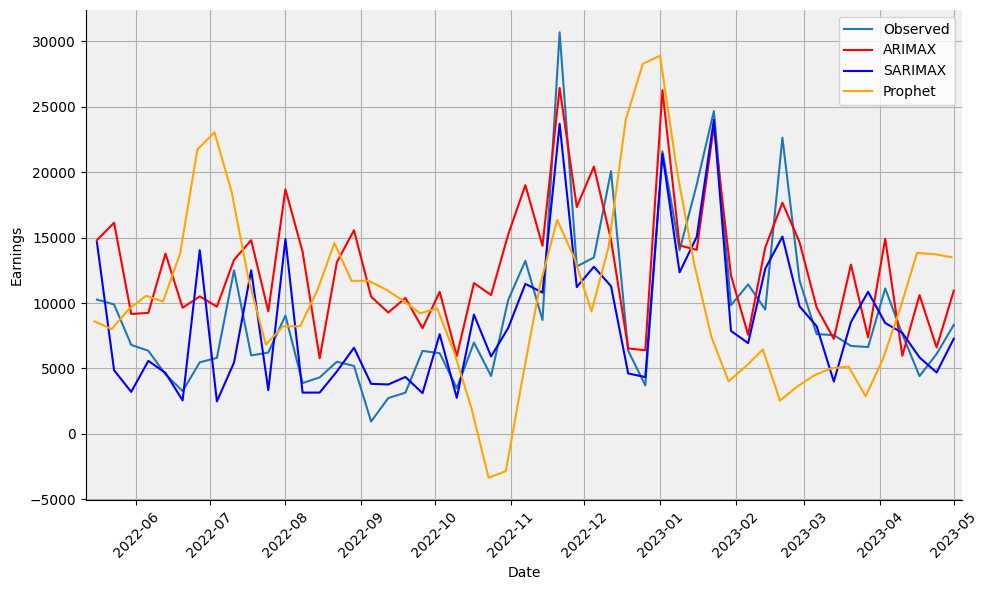

In [ ]:
import matplotlib.pyplot as plt

# Set the figure size to make the dates readable on the x-axis
plt.figure(figsize=(10, 6))

# Plot the graphs of predictions and actual values
plt.plot(df_casual_m["Total"][-52:-1], label='Observed')
plt.plot(predict_casual["Total"][-51:], color='red', label='ARIMAX')
plt.plot(predict_casual_s["Total"][-51:], color='blue', label='SARIMAX')
plt.plot(casual_prophet["ds"][-51:], casual_prophet["yhat"][-51:], color='orange', label='Prophet')

# Rotate the labels on the x-axis by 45 degrees to make them readable
plt.xticks(rotation=45)

# Add a legend
plt.legend()

# Set labels and title
plt.xlabel('Date')
plt.ylabel('Earnings')

# Add gridlines
plt.grid(True)

# Set a background color
plt.gca().set_facecolor('#f0f0f0')

# Remove the top and right spines
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

# Add a margin to the x-axis
plt.margins(x=0.01)

# Adjust the layout to avoid overlapping elements
plt.tight_layout()

# Show the graph
plt.show()


In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt
#df_casual_m[2:].mean()
rmse_ARIMAX=sqrt(mean_squared_error(df_casual_m["Total"][-52:-1], predict_casual["Total"][-51:]))
rmse_SARIMAX=sqrt(mean_squared_error(df_casual_m["Total"][-52:-1], predict_casual_s["Total"][-51:]))
rmse_Prophet=sqrt(mean_squared_error(df_casual_m["Total"][-52:-1], casual_prophet[-51:].set_index("ds").loc[:, ["yhat"]]))
print(rmse_ARIMAX)
print(rmse_SARIMAX)
print(rmse_Prophet)

5254.448918838834
3479.895733991798
8840.456003189398


In [ ]:
from sklearn.metrics import mean_absolute_percentage_error
error_ARIMAX = mean_absolute_percentage_error(df_casual_m["Total"][-52:-1], predict_casual["Total"][-51:])
error_SARIMAX = mean_absolute_percentage_error(df_casual_m["Total"][-52:-1], predict_casual_s["Total"][-51:])
error_Prophet = mean_absolute_percentage_error(df_casual_m["Total"][-52:-1], casual_prophet[-51:].set_index("ds").loc[:, ["yhat"]])
print(error_ARIMAX)
print(error_SARIMAX)
print(error_Prophet)

0.8782806229801411
0.3733538058618066
1.2506042777611373


Possible future scenarios with confidence intervals

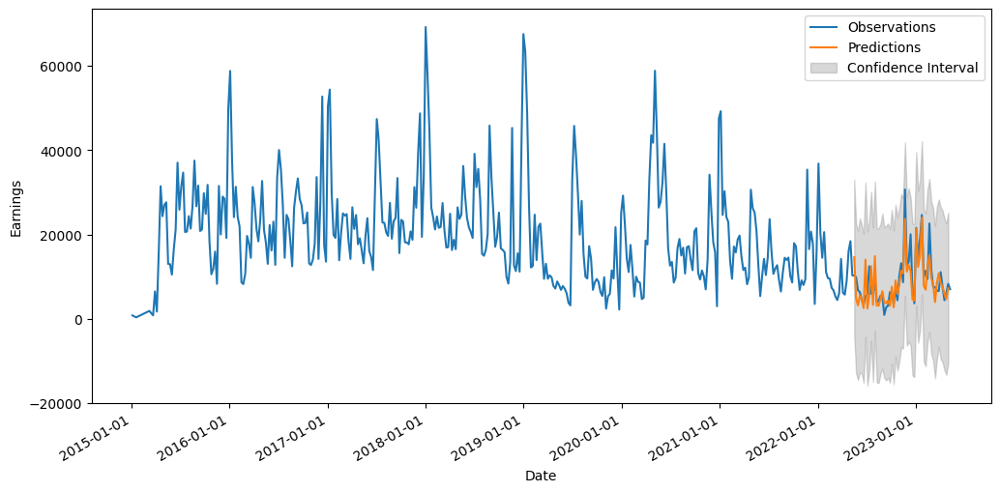

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np

# Convert predictions and confidence intervals to arrays
ci = li

# Create a figure and axis
fig, ax = plt.subplots(figsize=(12, 6))

# Plot all observations
ax.plot(df_casual_m.index, df_casual_m['Total'], label='Observations')

# Plot predictions for the last 52 weeks
ax.plot(df_casual_m.index[-52:-1], predict_casual_s['Total'][-51:], label='Predictions')

# Plot confidence intervals for the last 52 weeks
ax.fill_between(df_casual_m.index[-52:-1], ci.iloc[-51:, 0], ci.iloc[-51:, 1], color='gray', alpha=0.3, label='Confidence Interval')

# Format the x-axis as dates
date_formatter = mdates.DateFormatter('%Y-%m-%d')
ax.xaxis.set_major_formatter(date_formatter)
plt.gcf().autofmt_xdate()

# Set labels and legend
plt.xlabel('Date')
plt.ylabel('Earnings')
plt.legend()

# Show the plot
plt.show()

Possible future scenarios with 1000 random solutions

In [ ]:
model2=sm.tsa.ARIMA(df_casual_m["Total"], order=(2,1,2))
model_fit2 = model2.fit()

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


In [ ]:
simulation=model_fit2.simulate(52,anchor='end',repetitions=1000)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


In [ ]:
ar_params = model_fit2.arparams
ma_params = model_fit2.maparams

# Extract the residuals from the fitted model
residuals = model_fit2.resid

# Estimate the variance of the residuals
residual_variance = np.var(residuals)

In [ ]:
num_periods=52
simulations=[]
for _ in range(1000):
    # Generate random errors based on the estimated variance
    errors = np.random.normal(loc=0, scale=np.sqrt(residual_variance), size=num_periods)

    # Generate simulated data for each scenario
    simulated_data = model_fit2.forecast(steps=num_periods).values + errors
    simulations.append(simulated_data)

# Create a pandas DataFrame for the simulated data
dates = pd.date_range(start='2023-01-01', periods=num_periods, freq='W')
simulations_df = pd.DataFrame(simulations, index=np.arange(1000), columns=dates)
mean_simulated_data = simulations_df.mean()


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa

Graphs

In [ ]:
# Iterate over all the columns of the dataframe
for column in simulation.columns:
    # Replace negative numbers with NaN in the current column
    simulation[column] = simulation[column].apply(lambda x: np.NaN if x < 0 else x)

In [ ]:
simulations_df1=simulations_df
# Iterate over all the columns of the dataframe
for column in simulations_df.columns:
    # Replace negative numbers with 0 in the current column
    simulations_df1[column] = simulations_df[column].apply(lambda x: 0 if x < 0 else x)

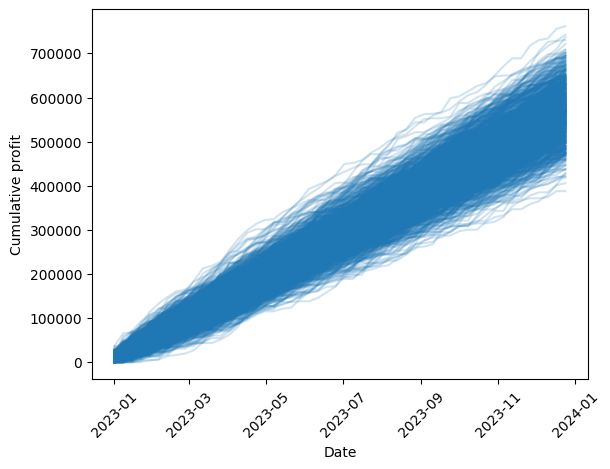

In [ ]:
# Calculation of cumulative earnings for each row
df_cumulative = simulations_df1.cumsum(axis=1)

# Plotting the cumulative earnings graph for each row
plt.plot(simulations_df1.columns, df_cumulative.transpose(), color="C0", alpha=0.2)
plt.xlabel('Date')
plt.ylabel('Cumulative profit')
plt.xticks(rotation=45)
plt.show()

In [ ]:
simulations_df2=simulations_df
# Iterate over all the columns of the dataframe
for column in simulations_df.columns:
    # Replace negative numbers with 0 in the current column
    simulations_df2[column] = simulations_df[column].apply(lambda x: np.NaN if x < 0 else x)

<ipython-input-291-82f1b22c8850>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(simulation.values.flatten(), shade=True)


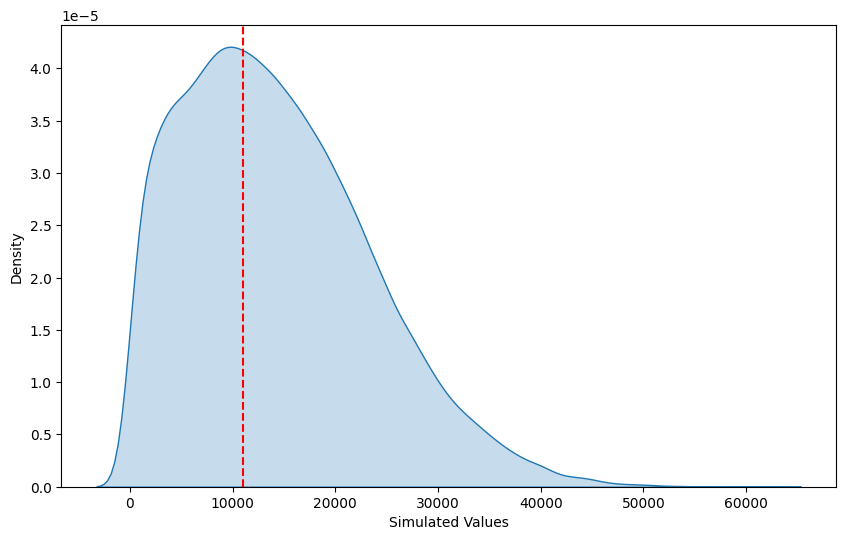

In [ ]:
import seaborn as sns
plt.figure(figsize=(10, 6))
sns.kdeplot(simulation.values.flatten(), shade=True)
plt.xlabel('Simulated Values')
plt.ylabel('Density')
mean_value = np.nanmean(simulations_df2.values.flatten())
plt.axvline(x=mean_value, color='red', linestyle='--', label='Mean Value')
plt.show()

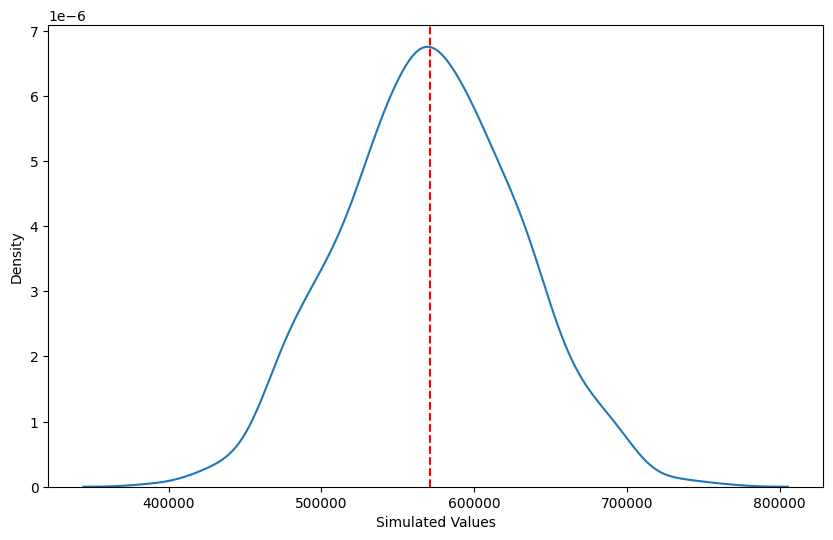

In [ ]:
last_period_values = df_cumulative.iloc[: , -1]
mean_value = last_period_values.mean()
plt.figure(figsize=(10, 6))
sns.kdeplot(last_period_values)
plt.xlabel('Simulated Values')
plt.ylabel('Density')
mean_value = np.mean(last_period_values.values.flatten())
plt.axvline(mean_value, color='red', linestyle='--', label='Mean')
plt.show()

# Sector Sci



In [ ]:
df_sci=df_clean.loc[df_clean["Sector"]=="Skiing"]
df_sci=df_sci[["Date","Total", "Temperature_Nord", "Temperature_Center", "Temperature_Sud"]]

## Aggregare per mesi su 8 anni

In [ ]:
def function(dataSp, dataSpAnnoMese, dataSpTotalePerMese, dataSpMese):
    dataSp = dataSp.set_index('Date')
    dataSp.index = pd.to_datetime(dataSp.index)
    dataSpAnnoMese = dataSp.groupby([(dataSp.index.year), (dataSp.index.month)]).sum()
    dataSpTotalePerMese = dataSp.groupby([(dataSp.index.month)]).sum()
    dataSpMese = dataSp.groupby(pd.Grouper(freq="M")).sum()
    dataSpMese['year'] = [d.year for d in dataSpMese.index]
    dataSpMese['month'] = [d.strftime('%b') for d in dataSpMese.index]
    years = dataSpMese['year'].unique()
    np.random.seed(100)
    mycolors = ["blue",  "green" ,"black" , "cyan", "magenta", "lime", "red", "indigo", "royalblue", "brown"]
    plt.figure(figsize=(10, 8), dpi = 80)
    for i, y in enumerate(years):
        if i > 0:
            plt.plot('month', 'Total', data=dataSpMese.loc[dataSpMese.year==y, :], color=mycolors[i], label=y)
            plt.text(dataSpMese.loc[dataSpMese.year==y, :].shape[0]-.9, dataSpMese.loc[dataSpMese.year==y, 'Total'][-1:].values[0],
                     y, fontsize=12, color=mycolors[i])
    plt.gca().set(xlim=(-0.3, 11), ylabel='$Total(Millions-€)$', xlabel='$Month$')
    plt.yticks(fontsize=12, alpha=.7)
    plt.show()

    return dataSpAnnoMese, dataSpTotalePerMese, dataSpMese

In [ ]:
import matplotlib as mpl
def totaleAnno(dataSpAnno, dataSp, strSp):
    dataSp = dataSp.set_index('Date')
    dataSp.index = pd.to_datetime(dataSp.index)
    dataSpAnno = dataSp.groupby(pd.Grouper(freq="Y")).sum()
    dataSpAnno['year'] = [d.year for d in dataSpAnno.index]
    dataSpAnno['NumAnno'] = dataSpAnno.year.apply(lambda x: 0 if x==2015 else(1 if x==2016 else 2 if x==2017 else 3 if x==2018 else 4 if x==2019 else 5 if x==2020 else 6 if x==2021 else 7 if x==2022 else 8))
    dataSpAnno['Sector'] = strSp
    settori = dataSpAnno['Sector'].unique()
    np.random.seed(100)
    mycolors = np.random.choice(list(mpl.colors.XKCD_COLORS.keys()), len(settori), replace=False)

    plt.figure(figsize=(10, 8), dpi = 80)
    for i, y in enumerate(settori):
            plt.plot('NumAnno', 'Total', data=dataSpAnno.loc[dataSpAnno.Sector==y, :], color=mycolors[i], label=y)
            plt.text(dataSpAnno.loc[dataSpAnno.Sector==y, :].shape[0]-.9, dataSpAnno.loc[dataSpAnno.Sector==y, 'Total'][-1:].values[0],
                     y, fontsize=12, color=mycolors[i])

    plt.gca().set(xlim=(-0.3, 11), ylabel='$Total(Millions-€)$', xlabel='$Year$')
    plt.xticks([0, 1, 2, 3, 4, 5, 6, 7, 8], ['2015', '2016', '2017', '2018', '2019', '2020', '2021', '2022', "2023"])
    plt.yticks(fontsize=12, alpha=.7)
    plt.show()

    return dataSpAnno

In [ ]:
def totaleMese(dataSpTotalePerMese, dataSp, strSp):
  dataSp = dataSp.set_index('Date')
  dataSp.index = pd.to_datetime(dataSp.index)
  dataSp['month'] = [d.strftime('%b') for d in dataSp.index]
  dataSpTotalePerMese = dataSp
  dataSpTotalePerMese['month'] =  dataSpTotalePerMese.month.apply(lambda x: 1 if x=='Jan' else(2 if x=='Feb' else 3 if x=='Mar' else 4 if x=='Apr' else 5 if x=='May' else 6 if x=='Jun' else 7 if x=='Jul' else 8 if x=='Aug' else 9 if x=='Sep' else 10 if x=='Oct' else 11 if x=='Nov' else 12))
  dataSpTotalePerMese = dataSpTotalePerMese.groupby(pd.Grouper(key = 'month')).sum()
  dataSpTotalePerMese['Sector'] = strSp
  dataSpTotalePerMese = dataSpTotalePerMese.sort_values('month')
  dataSpTotalePerMese = dataSpTotalePerMese.reset_index()
  np.random.seed(100)
  mycolors = np.random.choice(list(mpl.colors.XKCD_COLORS.keys()), len(dataSpTotalePerMese['month']), replace=False)
  plt.figure(figsize=(10, 8), dpi = 80)
  for i, y in enumerate(dataSpTotalePerMese['Sector']):
          plt.plot('month', 'Total', data=dataSpTotalePerMese.loc[dataSpTotalePerMese.Sector==y, :], color=mycolors[i], label=y)
          plt.text(dataSpTotalePerMese.loc[dataSpTotalePerMese.Sector==y, :].shape[0]-.9, dataSpTotalePerMese.loc[dataSpTotalePerMese.Sector==y, 'Total'][-1:].values[0],
                  y, fontsize=12, color=mycolors[i])

  plt.gca().set(xlim=(-0.3, 12), ylabel='$Total(Millions-€)$', xlabel='$Month$')
  plt.xticks([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12], [' ', 'Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dic'])
  plt.yticks(fontsize=12, alpha=.7)
  plt.show()

  return dataSpTotalePerMese

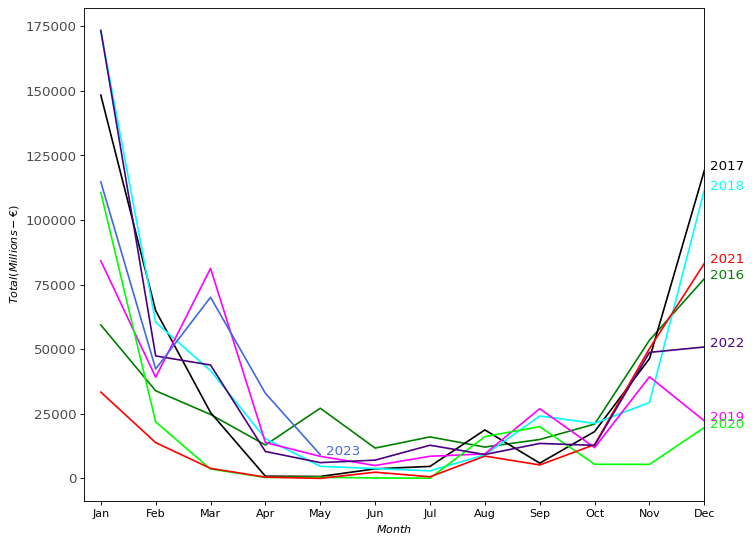

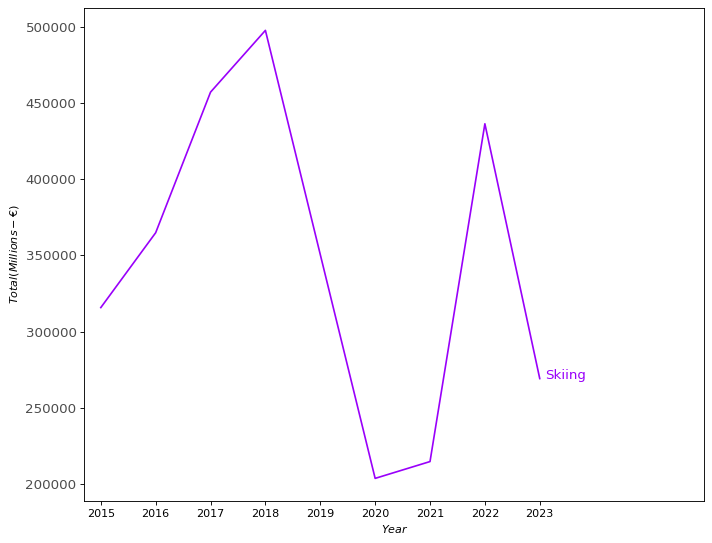

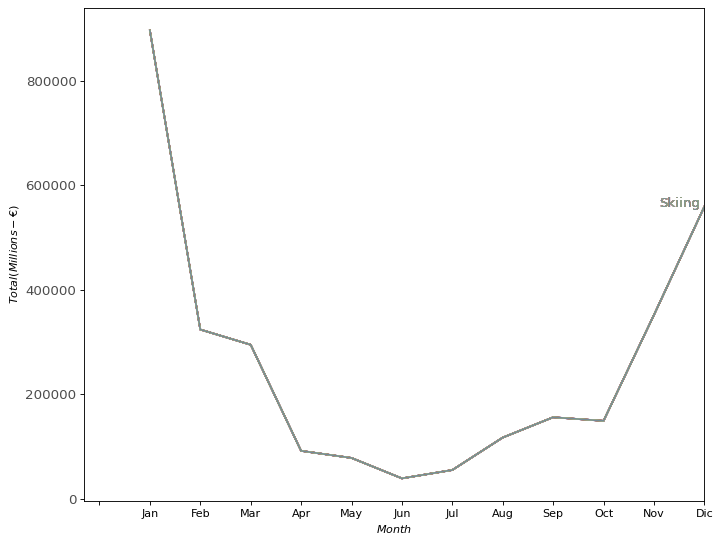

In [ ]:
dataSciAnnoMese = df_sci
dataSciTotalePerMese = df_sci
dataSciMese = df_sci
dataSciAnno = df_sci
strSci = "Skiing"
(dataSciAnnoMese, dataSciTotalePerMese, dataSciMese) = function(df_sci, dataSciAnnoMese, dataSciTotalePerMese, dataSciMese)
dataSciAnno = totaleAnno(dataSciAnno, df_sci, strSci)
dataSciTotalePerMese = totaleMese(dataSciTotalePerMese, df_sci, strSci)

In [ ]:
import pandas as pd

# Create the dataframe df_sci_m
df_sci_m = pd.DataFrame()

# Set the index on the 'Date' column
df_sci.set_index('Date', inplace=True)

# Calculate the sum for the "Total" column with weekly frequency
df_sci_m['Total'] = df_sci['Total'].resample('W').sum()

# Calculate the mean for the temperature columns with weekly frequency
df_sci_m['Temperature_Nord'] = df_sci['Temperature_Nord'].resample('W').mean()
df_sci_m['Temperature_Center'] = df_sci['Temperature_Center'].resample('W').mean()
df_sci_m['Temperature_Sud'] = df_sci['Temperature_Sud'].resample('W').mean()

# Remove rows with NaN values in the temperature columns
df_sci_m = df_sci_m.dropna(subset=['Temperature_Nord', 'Temperature_Center', 'Temperature_Sud'])

In [ ]:
df_sci_m=df_sci_m.round(2)

Smoothed graph with all observations

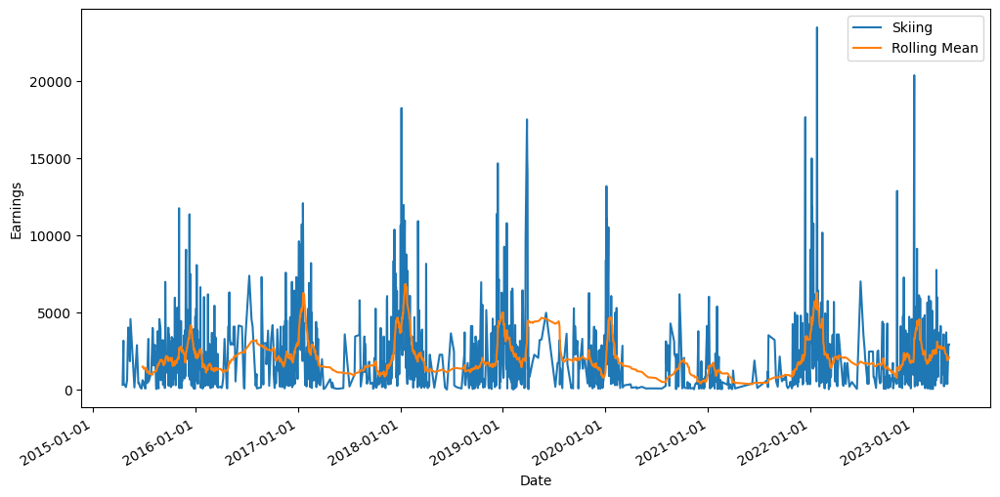

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

sci_noise = df_sci['Total'].rolling(20).mean()

# Create a figure and axis
fig, ax = plt.subplots(figsize=(12,6))

# Plot the data and rolling mean
ax.plot(df_sci.index, df_sci['Total'])
ax.plot(df_sci.index, sci_noise)

# Format the x-axis as dates
date_formatter = mdates.DateFormatter('%Y-%m-%d')
ax.xaxis.set_major_formatter(date_formatter)
plt.gcf().autofmt_xdate()

# Set labels and legend
plt.xlabel('Date')
plt.ylabel('Earnings')
plt.legend(['Skiing','Rolling Mean'])
# Show the plot
plt.show()

Aggregate relaxed graph by weeks

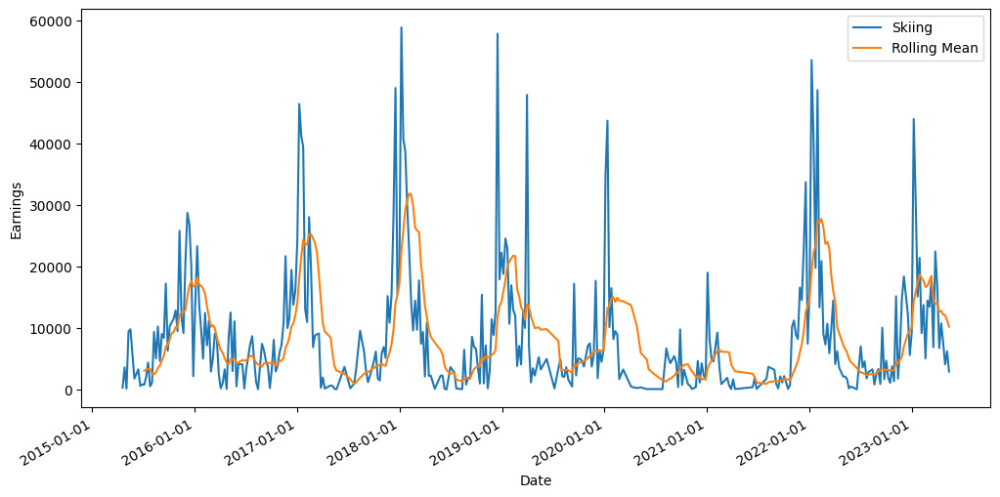

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

sci_noiseM = df_sci_m['Total'].rolling(10).mean()

# Create a figure and axis
fig, ax = plt.subplots(figsize=(12,6))

# Plot the data and rolling mean
ax.plot(df_sci_m.index, df_sci_m['Total'])
ax.plot(df_sci_m.index, sci_noiseM)

# Format the x-axis as dates
date_formatter = mdates.DateFormatter('%Y-%m-%d')
ax.xaxis.set_major_formatter(date_formatter)
plt.gcf().autofmt_xdate()

# Set labels and legend
plt.xlabel('Date')
plt.ylabel('Earnings')
plt.legend(['Skiing','Rolling Mean'])
# Show the plot
plt.show()

Saving the dataset for analysis in R

In [ ]:
#df_sci_m=df_sci_m.reset_index()

In [ ]:
#df_sci_m.to_csv(filepath + 'df_sci.csv', index=False)

/usr/local/lib/python3.10/dist-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


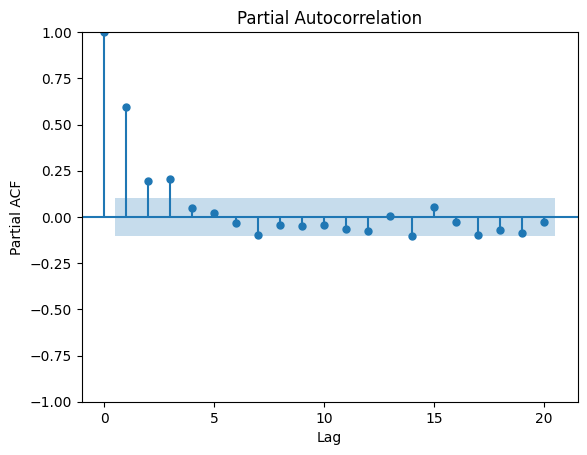

In [ ]:
from statsmodels.graphics.tsaplots import plot_pacf
plot_pacf(df_sci_m["Total"], lags=20)
plt.xlabel('Lag')
plt.ylabel('Partial ACF')
plt.show()

## Model for sci


ARIMA MODEL

In [ ]:
#from pmdarima import auto_arima
#stepwise_fit = auto_arima(df_sci_m['Total'], trace=True,suppress_warnings=True)

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=8731.352, Time=0.31 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=8977.051, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=8763.832, Time=0.15 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=8856.048, Time=0.23 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=9158.477, Time=0.06 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=8736.048, Time=0.24 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=8737.399, Time=0.28 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=8730.556, Time=0.35 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=8728.817, Time=0.32 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=8727.244, Time=0.35 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=8745.246, Time=0.12 sec
 ARIMA(4,0,0)(0,0,0)[0] intercept   : AIC=8728.140, Time=0.19 sec
 ARIMA(4,0,1)(0,0,0)[0] intercept   : AIC=8730.141, Time=0.37 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=8737.546, Time=0.11 sec

Best model:  ARIMA(3,0,0)(0,0,0)

#### Una settimana

ARIMA MODEL

In [ ]:
df_sci_m.index = pd.DatetimeIndex(df_sci_m.index).to_period('W')

In [ ]:
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Definisci la finestra temporale per la previsione
window_size = 2

# Esegui la previsione rolling
predictions = []
#df_sci_m = df_sci_m.asfreq('W')
exog_data = df_sci_m[["Temperature_Nord", "Temperature_Center", "Temperature_Sud"]].values  # Variabili esogene
for i in range(len(df_sci_m) - window_size):
    endog_data = df_sci_m["Total"].iloc[:i + window_size]
    exog_train_data = exog_data[:i + window_size]
    model = SARIMAX(endog=endog_data, exog=exog_train_data, order=(1, 0, 0), freq="W")  # Esempio di modello ARIMAX con ordine (1, 0, 0)
    model_fit_1 = model.fit()
    forecast = model_fit_1.forecast(steps=1, exog=exog_data[i + window_size].reshape(1, -1))  # Previsione per il prossimo step
    predictions.append(forecast)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarn

In [ ]:
df_sci_m.index = df_sci_m.index.to_timestamp()

In [ ]:
predict_sci=df_sci_m[2:].copy()
predict_sci["Total"]=predictions
predict_sci=predict_sci.shift(-1).dropna()

SARIMAX MODEL

In [ ]:
df_sci_m.index = pd.DatetimeIndex(df_sci_m.index).to_period('W')

In [ ]:
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Definisci la finestra temporale per la previsione
window_size = 2

# Esegui la previsione rolling
predictions = []
#df_sci_m = df_sci_m.asfreq('W')
exog_data = df_sci_m[["Temperature_Nord", "Temperature_Center", "Temperature_Sud"]].values  # Variabili esogene
for i in range(len(df_sci_m) - window_size):
    endog_data = df_sci_m["Total"].iloc[:i + window_size]
    exog_train_data = exog_data[:i + window_size]
    model = SARIMAX(endog=endog_data, exog=exog_train_data, order=(1, 0, 0), seasonal_order=(2, 0, 0, 13), freq="W", initialization='approximate_diffuse')
    model_fit_s1 = model.fit()
    forecast = model_fit_s1.forecast(steps=1, exog=exog_data[i + window_size].reshape(1, -1))  # Previsione per il prossimo step
    predictions.append(forecast)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. Al

In [ ]:
df_sci_m.index = df_sci_m.index.to_timestamp()

In [ ]:
predict_sci_s=df_sci_m[2:].copy()
predict_sci_s["Total"]=predictions
predict_sci_s=predict_sci_s.shift(-1).dropna()

PROPHET MODEL

In [ ]:
df_sci_m=df_sci_m.reset_index()
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd
from prophet import Prophet

sci_prophet=pd.DataFrame(columns=["ds","yhat"])

# Create Prophet dataframe
df_prophet = df_sci_m[['Date', 'Total',"Temperature_Nord","Temperature_Center","Temperature_Sud"]].copy()
df_prophet.columns = ['ds', 'y',"Temperature_Nord","Temperature_Center","Temperature_Sud"]
#df_prophet["ds"] = pd.to_datetime(df_prophet["ds"].dt.to_timestamp())
df_prophet["ds"] = pd.to_datetime(df_prophet["ds"])


for i in range(2, len(df_sci_m) - 1):
    df_train = df_prophet[:i]
    df_test = df_prophet.iloc[[i + 1]]

    # Instantiate and fit Prophet model
    model_prophet = Prophet(interval_width=0.95)
    model_prophet.add_regressor("Temperature_Nord")
    model_prophet.add_regressor("Temperature_Center")
    model_prophet.add_regressor("Temperature_Sud")
    model_prophet.fit(df_train)

    # Make predictions for the next observation
    future = model_prophet.make_future_dataframe(periods=2, freq='W')
    future = future.iloc[-1:]  # Select the last row for prediction
    future["Temperature_Nord"] = df_test["Temperature_Nord"].values
    future["Temperature_Center"] = df_test["Temperature_Center"].values
    future["Temperature_Sud"] = df_test["Temperature_Sud"].values

    forecast = model_prophet.predict(future)
    prediction_row = forecast[["ds", "yhat"]].iloc[0]

    sci_prophet = sci_prophet.append(prediction_row, ignore_index=True)

sci_prophet['yhat']=sci_prophet['yhat'].shift(-1).dropna()
sci_prophet=sci_prophet.dropna()

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 0.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp_onldwd1/5ee75zge.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp_onldwd1/u6sal94i.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=29409', 'data', 'file=/tmp/tmp_onldwd1/5ee75zge.json', 'init=/tmp/tmp_onldwd1/u6sal94i.json', 'output', 'file=/tmp/tmp_onldwd1/prophet_modeleu992i3i/prophet_model-20230702183222.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
18:32:22 - cmdstanpy - INFO - Chain [1] start processing
IN

In [ ]:
df_sci_m.set_index('Date', inplace=True)

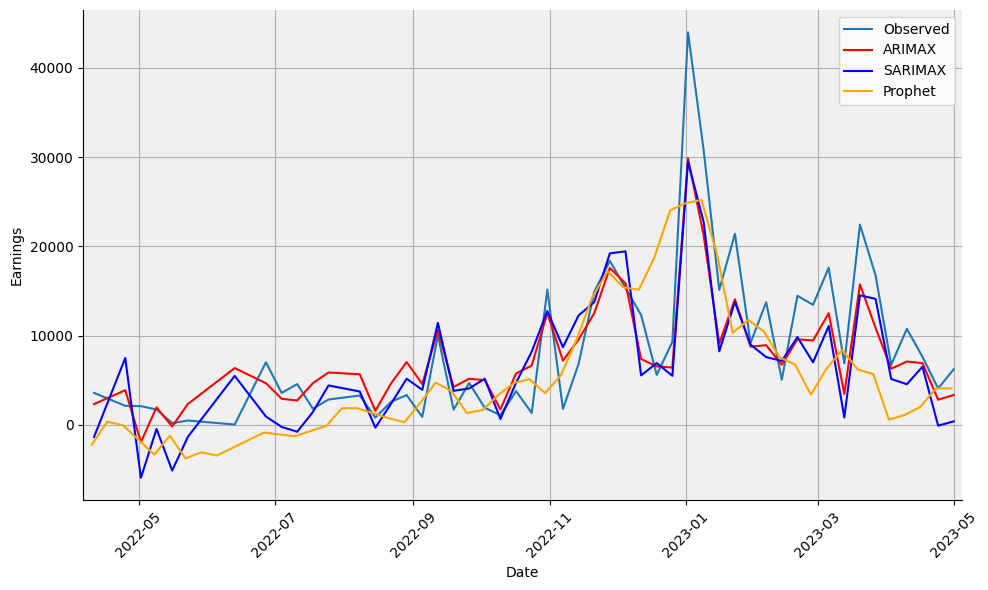

In [ ]:
import matplotlib.pyplot as plt

# Set the figure size to make the dates readable on the x-axis
plt.figure(figsize=(10, 6))

# Plot the graphs of predictions and actual values
plt.plot(df_sci_m["Total"][-52:-1], label='Observed')
plt.plot(predict_sci["Total"][-51:], color='red', label='ARIMAX')
plt.plot(predict_sci_s["Total"][-51:], color='blue', label='SARIMAX')
plt.plot(sci_prophet["ds"][-51:], sci_prophet["yhat"][-51:], color='orange', label='Prophet')

# Rotate the labels on the x-axis by 45 degrees to make them readable
plt.xticks(rotation=45)

# Add a legend
plt.legend()

# Set labels and title
plt.xlabel('Date')
plt.ylabel('Earnings')

# Add gridlines
plt.grid(True)

# Set a background color
plt.gca().set_facecolor('#f0f0f0')

# Remove the top and right spines
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

# Add a margin to the x-axis
plt.margins(x=0.01)

# Adjust the layout to avoid overlapping elements
plt.tight_layout()

# Show the graph
plt.show()


In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt
#df_sci_m[2:].mean()
rmse_ARIMAX=sqrt(mean_squared_error(df_sci_m["Total"][-52:-1], predict_sci["Total"][-51:]))
rmse_SARIMAX=sqrt(mean_squared_error(df_sci_m["Total"][-52:-1], predict_sci_s["Total"][-51:]))
rmse_Prophet=sqrt(mean_squared_error(df_sci_m["Total"][-52:-1], sci_prophet[-51:].set_index("ds").loc[:, ["yhat"]]))
print(rmse_ARIMAX)
print(rmse_SARIMAX)
print(rmse_Prophet)

4080.9165897151165
4928.730672651207
6742.690235293984


In [ ]:
from sklearn.metrics import mean_absolute_percentage_error
error_ARIMAX = mean_absolute_percentage_error(df_sci_m["Total"][-52:-1], predict_sci["Total"][-51:])
error_SARIMAX = mean_absolute_percentage_error(df_sci_m["Total"][-52:-1], predict_sci_s["Total"][-51:])
error_Prophet = mean_absolute_percentage_error(df_sci_m["Total"][-52:-1], sci_prophet[-51:].set_index("ds").loc[:, ["yhat"]])
print(error_ARIMAX)
print(error_SARIMAX)
print(error_Prophet)

3.5087804327837677
3.7910986638706334
2.484969511157326


#### Due settimane

ARIMA MODEL

In [ ]:
df_sci_m.index = pd.DatetimeIndex(df_sci_m.index).to_period('W')

In [ ]:
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Definisci la finestra temporale per la previsione
window_size = 3

# Esegui la previsione rolling
predictions = []
#df_sci_m = df_sci_m.asfreq('W')
exog_data = df_sci_m[["Temperature_Nord", "Temperature_Center", "Temperature_Sud"]].values  # Variabili esogene
for i in range(len(df_sci_m) - window_size):
    endog_data = df_sci_m["Total"].iloc[:i + window_size]
    exog_train_data = exog_data[:i + window_size]
    model = SARIMAX(endog=endog_data, exog=exog_train_data, order=(1, 0, 0), freq="W")  # Esempio di modello ARIMAX con ordine (1, 0, 0)
    model_fit_2 = model.fit()
    forecast = model_fit_2.forecast(steps=1, exog=exog_data[i + window_size].reshape(1, -1))  # Previsione per il prossimo step
    predictions.append(forecast)


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood op

In [ ]:
df_sci_m.index = df_sci_m.index.to_timestamp()

In [ ]:
predict_sci=df_sci_m[3:].copy()
predict_sci["Total"]=predictions
predict_sci=predict_sci.shift(-1).dropna()

SARIMAX MODEL

In [ ]:
df_sci_m.index = pd.DatetimeIndex(df_sci_m.index).to_period('W')

In [ ]:
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Definisci la finestra temporale per la previsione
window_size = 3

# Esegui la previsione rolling
predictions = []
#df_sci_m = df_sci_m.asfreq('W')
exog_data = df_sci_m[["Temperature_Nord", "Temperature_Center", "Temperature_Sud"]].values  # Variabili esogene
for i in range(len(df_sci_m) - window_size):
    endog_data = df_sci_m["Total"].iloc[:i + window_size]
    exog_train_data = exog_data[:i + window_size]
    model = SARIMAX(endog=endog_data, exog=exog_train_data, order=(1, 0, 0), seasonal_order=(2, 0, 0, 13), freq="W", initialization='approximate_diffuse')
    model_fit_s2 = model.fit()
    forecast = model_fit_s2.forecast(steps=1, exog=exog_data[i + window_size].reshape(1, -1))  # Previsione per il prossimo step
    predictions.append(forecast)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimat

In [ ]:
df_sci_m.index = df_sci_m.index.to_timestamp()

In [ ]:
predict_sci_s=df_sci_m[3:].copy()
predict_sci_s["Total"]=predictions
predict_sci_s=predict_sci_s.shift(-1).dropna()

PROPHET MODEL

In [ ]:
df_sci_m=df_sci_m.reset_index()
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd
from prophet import Prophet

sci_prophet=pd.DataFrame(columns=["ds","yhat"])

# Create Prophet dataframe
df_prophet = df_sci_m[['Date', 'Total',"Temperature_Nord","Temperature_Center","Temperature_Sud"]].copy()
df_prophet.columns = ['ds', 'y',"Temperature_Nord","Temperature_Center","Temperature_Sud"]
#df_prophet["ds"] = pd.to_datetime(df_prophet["ds"].dt.to_timestamp())
df_prophet["ds"] = pd.to_datetime(df_prophet["ds"])


for i in range(2, len(df_sci_m) - 2):
    df_train = df_prophet[:i]
    df_test = df_prophet.iloc[i + 1:i + 3]

    # Instantiate and fit Prophet model
    model_prophet = Prophet(interval_width=0.95)
    model_prophet.add_regressor("Temperature_Nord")
    model_prophet.add_regressor("Temperature_Center")
    model_prophet.add_regressor("Temperature_Sud")
    model_prophet.fit(df_train)

    # Make predictions for the next observation
    future = model_prophet.make_future_dataframe(periods=4, freq='W')
    future = future.iloc[-2:]  # Select the last row for prediction
    future["Temperature_Nord"] = df_test["Temperature_Nord"].values
    future["Temperature_Center"] = df_test["Temperature_Center"].values
    future["Temperature_Sud"] = df_test["Temperature_Sud"].values

    forecast = model_prophet.predict(future)
    prediction_row = forecast[["ds", "yhat"]].iloc[0]

    sci_prophet = sci_prophet.append(prediction_row, ignore_index=True)

sci_prophet['yhat']=sci_prophet['yhat'].shift(-1).dropna()
sci_prophet=sci_prophet.dropna()

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 0.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp_onldwd1/i_24soc1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp_onldwd1/fgvz6d1y.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=70296', 'data', 'file=/tmp/tmp_onldwd1/i_24soc1.json', 'init=/tmp/tmp_onldwd1/fgvz6d1y.json', 'output', 'file=/tmp/tmp_onldwd1/prophet_modelbq9km0db/prophet_model-20230702184550.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
18:45:50 - cmdstanpy - INFO - Chain [1] start processing
IN

In [ ]:
df_sci_m.set_index('Date', inplace=True)

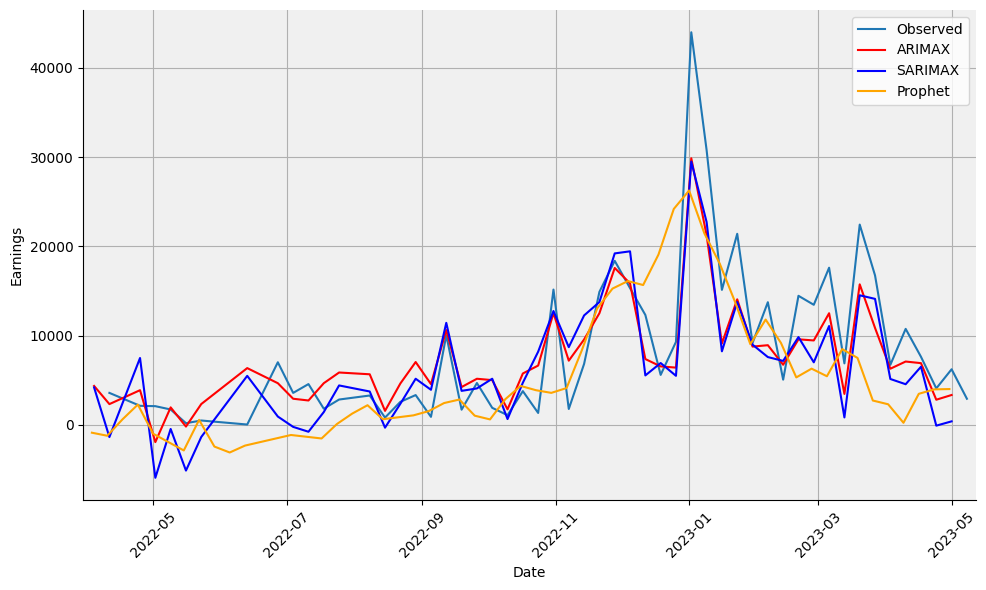

In [ ]:
import matplotlib.pyplot as plt

# Set the figure size to make the dates readable on the x-axis
plt.figure(figsize=(10, 6))

# Plot the graphs of predictions and actual values
plt.plot(df_sci_m["Total"][-52:-1], label='Observed')
plt.plot(predict_sci["Total"][-51:], color='red', label='ARIMAX')
plt.plot(predict_sci_s["Total"][-51:], color='blue', label='SARIMAX')
plt.plot(sci_prophet["ds"][-51:], sci_prophet["yhat"][-51:], color='orange', label='Prophet')

# Rotate the labels on the x-axis by 45 degrees to make them readable
plt.xticks(rotation=45)

# Add a legend
plt.legend()

# Set labels and title
plt.xlabel('Date')
plt.ylabel('Earnings')

# Add gridlines
plt.grid(True)

# Set a background color
plt.gca().set_facecolor('#f0f0f0')

# Remove the top and right spines
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

# Add a margin to the x-axis
plt.margins(x=0.01)

# Adjust the layout to avoid overlapping elements
plt.tight_layout()

# Show the graph
plt.show()


In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt
#df_sci_m[2:].mean()
rmse_ARIMAX=sqrt(mean_squared_error(df_sci_m["Total"][-52:-1], predict_sci["Total"][-51:]))
rmse_SARIMAX=sqrt(mean_squared_error(df_sci_m["Total"][-52:-1], predict_sci_s["Total"][-51:]))
rmse_Prophet=sqrt(mean_squared_error(df_sci_m["Total"][-52:-1], sci_prophet[-51:].set_index("ds").loc[:, ["yhat"]]))
print(rmse_ARIMAX)
print(rmse_SARIMAX)
print(rmse_Prophet)

4080.9165897151165
4928.730672651207
6645.636706969548


In [ ]:
from sklearn.metrics import mean_absolute_percentage_error
error_ARIMAX = mean_absolute_percentage_error(df_sci_m["Total"][-52:-1], predict_sci["Total"][-51:])
error_SARIMAX = mean_absolute_percentage_error(df_sci_m["Total"][-52:-1], predict_sci_s["Total"][-51:])
error_Prophet = mean_absolute_percentage_error(df_sci_m["Total"][-52:-1], sci_prophet[-51:].set_index("ds").loc[:, ["yhat"]])
print(error_ARIMAX)
print(error_SARIMAX)
print(error_Prophet)

3.5087804327837677
3.7910986638706334
2.1113359756688768


#### Tre settimane

ARIMA MODEL

In [ ]:
df_sci_m.index = pd.DatetimeIndex(df_sci_m.index).to_period('W')

In [ ]:
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Definisci la finestra temporale per la previsione
window_size = 4

# Esegui la previsione rolling
predictions = []
li=pd.DataFrame()
#df_sci_m = df_sci_m.asfreq('W')
exog_data = df_sci_m[["Temperature_Nord", "Temperature_Center", "Temperature_Sud"]].values  # Variabili esogene
for i in range(len(df_sci_m) - window_size):
    endog_data = df_sci_m["Total"].iloc[:i + window_size]
    exog_train_data = exog_data[:i + window_size]
    model = SARIMAX(endog=endog_data, exog=exog_train_data, order=(1, 0, 0), freq="W")  # Esempio di modello ARIMAX con ordine (1, 0, 0)
    model_fit_3 = model.fit()
    forecast = model_fit_3.forecast(steps=1, exog=exog_data[i + window_size].reshape(1, -1))  # Previsione per il prossimo step
    prova = model_fit_3.get_forecast(steps=1, exog=exog_data[i + window_size].reshape(1, -1), alpha=0.05).conf_int()
    predictions.append(forecast)
    li=li.append(prova)


<ipython-input-375-08a4716e6f86>:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  li=li.append(prova)
<ipython-input-375-08a4716e6f86>:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  li=li.append(prova)
<ipython-input-375-08a4716e6f86>:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  li=li.append(prova)
<ipython-input-375-08a4716e6f86>:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  li=li.append(prova)
<ipython-input-375-08a4716e6f86>:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  li=li.append(prova)
<ipython-input-375-08a4716e6f86>:20: Fut

In [ ]:
df_sci_m.index = df_sci_m.index.to_timestamp()

In [ ]:
predict_sci=df_sci_m[4:].copy()
predict_sci["Total"]=predictions
predict_sci=predict_sci.shift(-1).dropna()

SARIMAX MODEL

In [ ]:
df_sci_m.index = pd.DatetimeIndex(df_sci_m.index).to_period('W')

In [ ]:
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Definisci la finestra temporale per la previsione
window_size = 4

# Esegui la previsione rolling
predictions = []
#df_sci_m = df_sci_m.asfreq('W')
exog_data = df_sci_m[["Temperature_Nord", "Temperature_Center", "Temperature_Sud"]].values  # Variabili esogene
for i in range(len(df_sci_m) - window_size):
    endog_data = df_sci_m["Total"].iloc[:i + window_size]
    exog_train_data = exog_data[:i + window_size]
    model = SARIMAX(endog=endog_data, exog=exog_train_data, order=(1, 0, 0), seasonal_order=(2, 0, 0, 13), freq="W", initialization='approximate_diffuse')
    model_fit_s3 = model.fit()
    forecast = model_fit_s3.forecast(steps=1, exog=exog_data[i + window_size].reshape(1, -1))  # Previsione per il prossimo step
    predictions.append(forecast)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimat

In [ ]:
df_sci_m.index = df_sci_m.index.to_timestamp()

In [ ]:
predict_sci_s=df_sci_m[4:].copy()
predict_sci_s["Total"]=predictions
predict_sci_s=predict_sci_s.shift(-1).dropna()

PROPHET MODEL

In [ ]:
df_sci_m=df_sci_m.reset_index()
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd
from prophet import Prophet

sci_prophet=pd.DataFrame(columns=["ds","yhat"])

# Create Prophet dataframe
df_prophet = df_sci_m[['Date', 'Total',"Temperature_Nord","Temperature_Center","Temperature_Sud"]].copy()
df_prophet.columns = ['ds', 'y',"Temperature_Nord","Temperature_Center","Temperature_Sud"]
#df_prophet["ds"] = pd.to_datetime(df_prophet["ds"].dt.to_timestamp())
df_prophet["ds"] = pd.to_datetime(df_prophet["ds"])


for i in range(2, len(df_sci_m) - 3):
    df_train = df_prophet[:i]
    df_test = df_prophet.iloc[i + 1:i + 4]

    # Instantiate and fit Prophet model
    model_prophet = Prophet(interval_width=0.95)
    model_prophet.add_regressor("Temperature_Nord")
    model_prophet.add_regressor("Temperature_Center")
    model_prophet.add_regressor("Temperature_Sud")
    model_prophet.fit(df_train)

    # Make predictions for the next observation
    future = model_prophet.make_future_dataframe(periods=6, freq='W')
    future = future.iloc[-3:]  # Select the last row for prediction
    future["Temperature_Nord"] = df_test["Temperature_Nord"].values
    future["Temperature_Center"] = df_test["Temperature_Center"].values
    future["Temperature_Sud"] = df_test["Temperature_Sud"].values

    forecast = model_prophet.predict(future)
    prediction_row = forecast[["ds", "yhat"]].iloc[0]

    sci_prophet = sci_prophet.append(prediction_row, ignore_index=True)

sci_prophet['yhat']=sci_prophet['yhat'].shift(-1).dropna()
sci_prophet=sci_prophet.dropna()

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 0.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp_onldwd1/8gh7mbld.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp_onldwd1/j8nwjk5u.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=69299', 'data', 'file=/tmp/tmp_onldwd1/8gh7mbld.json', 'init=/tmp/tmp_onldwd1/j8nwjk5u.json', 'output', 'file=/tmp/tmp_onldwd1/prophet_modelmbyx0omw/prophet_model-20230702191955.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
19:19:55 - cmdstanpy - INFO - Chain [1] start processing
IN

In [ ]:
df_sci_m.set_index('Date', inplace=True)

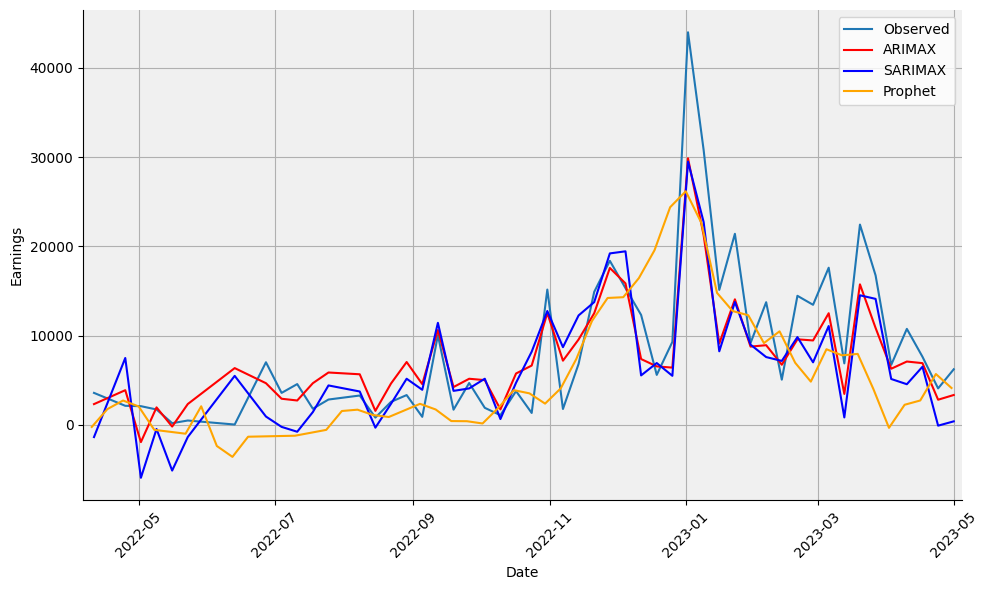

In [ ]:
import matplotlib.pyplot as plt

# Set the figure size to make the dates readable on the x-axis
plt.figure(figsize=(10, 6))

# Plot the graphs of predictions and actual values
plt.plot(df_sci_m["Total"][-52:-1], label='Observed')
plt.plot(predict_sci["Total"][-51:], color='red', label='ARIMAX')
plt.plot(predict_sci_s["Total"][-51:], color='blue', label='SARIMAX')
plt.plot(sci_prophet["ds"][-51:], sci_prophet["yhat"][-51:], color='orange', label='Prophet')

# Rotate the labels on the x-axis by 45 degrees to make them readable
plt.xticks(rotation=45)

# Add a legend
plt.legend()

# Set labels and title
plt.xlabel('Date')
plt.ylabel('Earnings')

# Add gridlines
plt.grid(True)

# Set a background color
plt.gca().set_facecolor('#f0f0f0')

# Remove the top and right spines
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

# Add a margin to the x-axis
plt.margins(x=0.01)

# Adjust the layout to avoid overlapping elements
plt.tight_layout()

# Show the graph
plt.show()


In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt
#df_sci_m[2:].mean()
rmse_ARIMAX=sqrt(mean_squared_error(df_sci_m["Total"][-52:-1], predict_sci["Total"][-51:]))
rmse_SARIMAX=sqrt(mean_squared_error(df_sci_m["Total"][-52:-1], predict_sci_s["Total"][-51:]))
rmse_Prophet=sqrt(mean_squared_error(df_sci_m["Total"][-52:-1], sci_prophet[-51:].set_index("ds").loc[:, ["yhat"]]))
print(rmse_ARIMAX)
print(rmse_SARIMAX)
print(rmse_Prophet)

4080.9165897151165
4928.730672651207
6604.888273937299


In [ ]:
from sklearn.metrics import mean_absolute_percentage_error
error_ARIMAX = mean_absolute_percentage_error(df_sci_m["Total"][-52:-1], predict_sci["Total"][-51:])
error_SARIMAX = mean_absolute_percentage_error(df_sci_m["Total"][-52:-1], predict_sci_s["Total"][-51:])
error_Prophet = mean_absolute_percentage_error(df_sci_m["Total"][-52:-1], sci_prophet[-51:].set_index("ds").loc[:, ["yhat"]])
print(error_ARIMAX)
print(error_SARIMAX)
print(error_Prophet)

3.5087804327837677
3.7910986638706334
1.7283877896376496


Possible future scenarios with confidence intervals

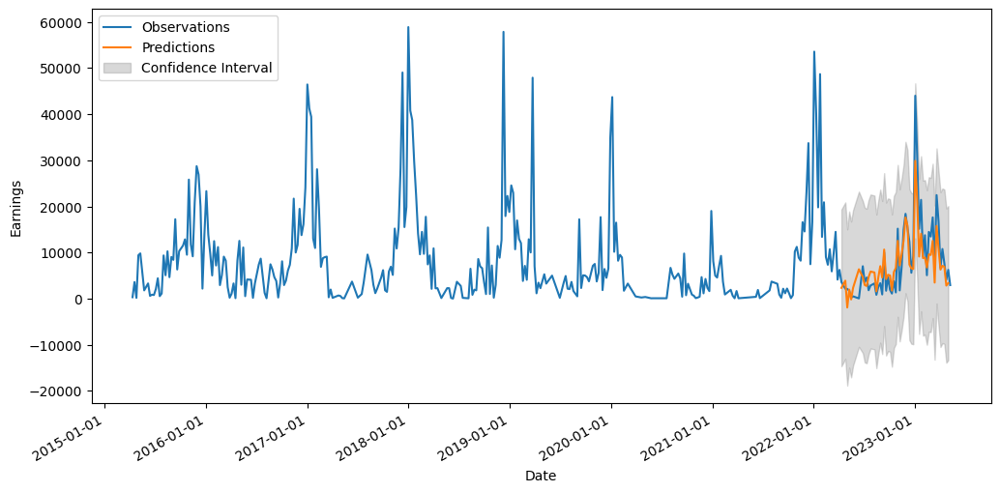

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np

# Convert predictions and confidence intervals to arrays
ci = li

# Create a figure and axis
fig, ax = plt.subplots(figsize=(12, 6))

# Plot all observations
ax.plot(df_sci_m.index, df_sci_m['Total'], label='Observations')

# Plot predictions for the last 52 weeks
ax.plot(df_sci_m.index[-52:-1], predict_sci['Total'][-51:], label='Predictions')

# Plot confidence intervals for the last 52 weeks
ax.fill_between(df_sci_m.index[-52:-1], ci.iloc[-51:, 0], ci.iloc[-51:, 1], color='gray', alpha=0.3, label='Confidence Interval')

# Format the x-axis as dates
date_formatter = mdates.DateFormatter('%Y-%m-%d')
ax.xaxis.set_major_formatter(date_formatter)
plt.gcf().autofmt_xdate()

# Set labels and legend
plt.xlabel('Date')
plt.ylabel('Earnings')
plt.legend()

# Show the plot
plt.show()

Possible future scenarios with 1000 random solutions

In [ ]:
model2=sm.tsa.ARIMA(df_sci_m["Total"], order=(3,0,0))
model_fit2 = model2.fit()

In [ ]:
simulation=model_fit2.simulate(52,anchor='end',repetitions=1000)

In [ ]:
ar_params = model_fit2.arparams
ma_params = model_fit2.maparams

# Extract the residuals from the fitted model
residuals = model_fit2.resid

# Estimate the variance of the residuals
residual_variance = np.var(residuals)

In [ ]:
num_periods=52
simulations=[]
for _ in range(1000):
    # Generate random errors based on the estimated variance
    errors = np.random.normal(loc=0, scale=np.sqrt(residual_variance), size=num_periods)

    # Generate simulated data for each scenario
    simulated_data = model_fit2.forecast(steps=num_periods).values + errors
    simulations.append(simulated_data)

# Create a pandas DataFrame for the simulated data
dates = pd.date_range(start='2023-01-01', periods=num_periods, freq='W')
simulations_df = pd.DataFrame(simulations, index=np.arange(1000), columns=dates)
mean_simulated_data = simulations_df.mean()


Graphs

In [ ]:
# Iterate over all the columns of the dataframe
for column in simulation.columns:
    # Replace negative numbers with NaN in the current column
    simulation[column] = simulation[column].apply(lambda x: np.NaN if x < 0 else x)

In [ ]:
simulations_df1=simulations_df
# Iterate over all the columns of the dataframe
for column in simulations_df.columns:
    # Replace negative numbers with 0 in the current column
    simulations_df1[column] = simulations_df[column].apply(lambda x: 0 if x < 0 else x)

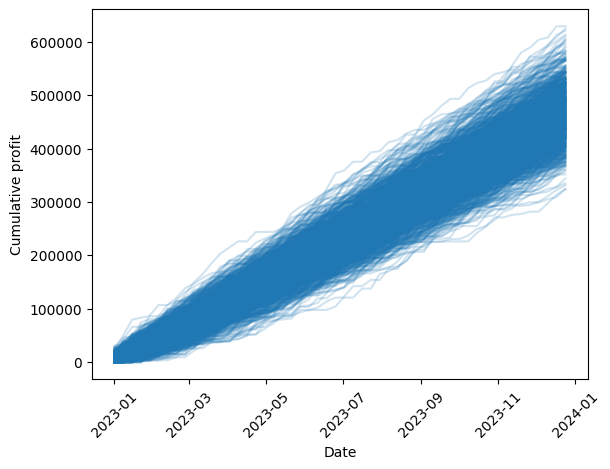

In [ ]:
# Calculation of cumulative earnings for each row
df_cumulative = simulations_df1.cumsum(axis=1)

# Plotting the cumulative earnings graph for each row
plt.plot(simulations_df1.columns, df_cumulative.transpose(), color="C0", alpha=0.2)
plt.xlabel('Date')
plt.ylabel('Cumulative profit')
plt.xticks(rotation=45)
plt.show()

In [ ]:
simulations_df2=simulations_df
# Iterate over all the columns of the dataframe
for column in simulations_df.columns:
    # Replace negative numbers with 0 in the current column
    simulations_df2[column] = simulations_df[column].apply(lambda x: np.NaN if x < 0 else x)

<ipython-input-354-82f1b22c8850>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(simulation.values.flatten(), shade=True)


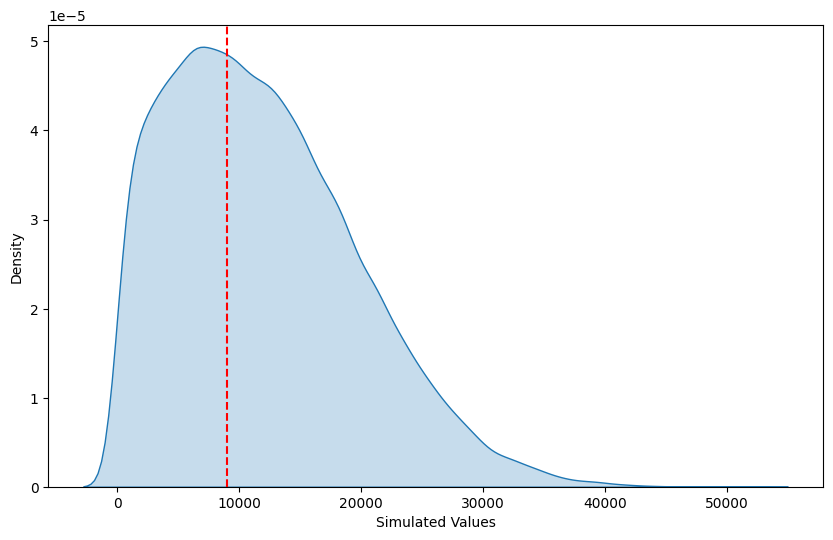

In [ ]:
import seaborn as sns
plt.figure(figsize=(10, 6))
sns.kdeplot(simulation.values.flatten(), shade=True)
plt.xlabel('Simulated Values')
plt.ylabel('Density')
mean_value = np.nanmean(simulations_df2.values.flatten())
plt.axvline(x=mean_value, color='red', linestyle='--', label='Mean Value')
plt.show()

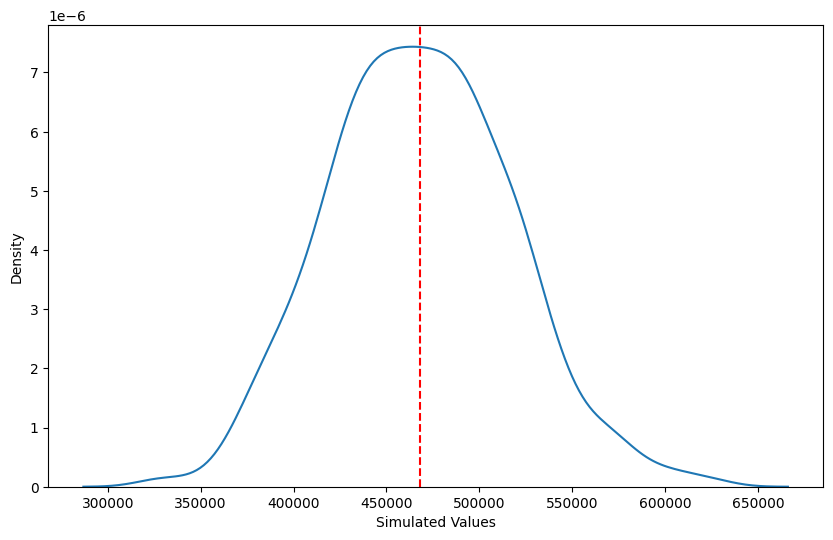

In [ ]:
last_period_values = df_cumulative.iloc[: , -1]
mean_value = last_period_values.mean()
plt.figure(figsize=(10, 6))
sns.kdeplot(last_period_values)
plt.xlabel('Simulated Values')
plt.ylabel('Density')
mean_value = np.mean(last_period_values.values.flatten())
plt.axvline(mean_value, color='red', linestyle='--', label='Mean')
plt.show()